In [1]:
#importovanie kniznic
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import jsonlines
import json
from bs4 import BeautifulSoup
import re 
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from datetime import datetime
import matplotlib.pyplot as plt
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from scipy.stats import shapiro
from scipy.stats import kruskal
from scipy.stats import ttest_ind, f_oneway
from scipy.stats import pearsonr, spearmanr
from nltk.tokenize import sent_tokenize, word_tokenize
import emoji
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
from collections import Counter #
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
import spacy
nltk.download('averaged_perceptron_tagger')
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
nlp = spacy.load('en_core_web_sm')
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, classification_report
from scipy.sparse import hstack
from scipy.sparse import csr_matrix, hstack
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics 
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn import svm
from sklearn.svm import SVC
from sklearn.feature_extraction.text import TfidfVectorizer
from langdetect import detect
from langdetect import LangDetectException
from sklearn.preprocessing import FunctionTransformer, StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_regression
from sklearn.svm import LinearSVC
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import GridSearchCV
from nltk import pos_tag
from sklearn.ensemble import GradientBoostingClassifier

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Martin\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Martin\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Martin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Martin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Martin\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Martin\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already u

## Pohlavie

Načítanie datasetov

In [2]:
data = []

with open('../datasety/syntakticke_crty_ocisteny.json', 'r') as file:
    for line in file:
        try:
            # Každý riadok je samostatný JSON objekt, nie zoznam.
            json_obj = json.loads(line)
            data.append(json_obj)
        except json.JSONDecodeError as e:
            print(f"Chyba pri dekódovaní JSON na riadku: {e}")

In [3]:
dataset_syn = pd.DataFrame(data)
dataset_syn.head()

,id,gender,age_group,declarative_percent,interrogative_percent,imperative_percent,other_ending_percent,avg_commas,average_nouns_per_tweet,average_adjective_per_tweet,...,average_particle_per_tweet,average_interjection_per_tweet,average_past_tense_per_tweet,average_present_tense_per_tweet,avg_nsubj_per_tweet,avg_dobj_per_tweet,avg_advmod_per_tweet,avg_amod_per_tweet,avg_aux_per_tweet,lemmatized_text
0,11683,1,1,90.577508,2.431611,6.686930,0.303951,0.234043,3.306991,1.395137,...,0.179331,0.0,0.509091,1.800000,1.987013,1.072727,0.825974,0.524675,0.989610,people do not know the definition and use phra...
1,42738,1,3,76.319759,20.211161,2.714932,0.754148,0.155354,2.595777,1.007541,...,0.046757,0.0,1.095975,3.229102,2.965944,1.535604,1.560372,1.018576,1.541796,wrong place to play that game no reason for ra...
2,11006,1,1,8.831169,1.168831,89.870130,0.129870,0.114286,1.914286,0.749351,...,0.068831,0.0,0.569343,1.000000,1.021898,0.880779,0.705596,0.980535,0.525547,happy hump day a little sunday drive for and I...
3,28582,1,1,41.290323,0.645161,57.419355,0.645161,0.793548,7.716129,2.890323,...,0.135484,0.0,0.333333,1.037940,0.769648,0.663957,0.566396,0.918699,0.349593,there be actorsthere be star then there be peo...
4,16463,1,4,91.971831,6.478873,0.000000,1.549296,0.745070,4.761972,1.556338,...,0.102817,0.0,1.418947,2.298947,2.166316,1.595789,1.307368,1.467368,1.343158,on sept 24 I write about offbeatenpath gm cand...


In [4]:
data = []

with open('../datasety/lexikalne_crty_ocisteny.json', 'r') as file:
    for line in file:
        try:
            # Každý riadok je samostatný JSON objekt, nie zoznam.
            json_obj = json.loads(line)
            data.append(json_obj)
        except json.JSONDecodeError as e:
            print(f"Chyba pri dekódovaní JSON na riadku: {e}")

In [5]:
dataset_lex = pd.DataFrame(data)
dataset_lex.head()

,id,gender,age_group,average_emoji,average_urls,average_mentions,average_hashtags,average_digits,average_uppercase,average_lowercase,...,average_stopwords,average_word_length,avg_words_per_sentence,avg_chars_per_sentence,avg_sentences_per_tweet,avg_words_per_tweet,avg_chars_per_tweet,average_repeats_per_tweet,vocabulary_size,text_joined
0,11683,1,1,1.002597,0.225974,0.036364,0.041558,0.537662,3.142857,52.587013,...,6.644156,5.033699,7.481793,44.526611,0.929688,6.877604,63.539062,0.007792,964,people dont know definition use phrase much ge...
1,42738,1,3,0.000000,0.975232,0.061920,0.204334,1.996904,8.560372,115.027864,...,13.294118,5.852282,5.437588,37.012623,2.207430,11.736842,128.086687,0.003096,1636,wrong place play game reason rage especially r...
2,11006,1,1,0.075426,0.454988,2.335766,0.394161,1.832117,9.978102,74.197080,...,5.746959,5.057388,5.116900,36.564168,1.924205,7.114914,62.875306,0.012165,947,happy hump day little sunday drive beetle some...
3,28582,1,1,0.040650,0.745257,1.056911,0.466125,1.471545,7.761518,69.173442,...,4.214092,5.696087,9.701695,75.549153,0.801630,6.250000,57.046196,0.008130,1081,actorsthere star people change life hit park y...
4,16463,1,4,0.000000,0.416842,0.094737,1.755789,3.164211,10.640000,116.509474,...,10.888421,5.534196,11.310030,75.015198,1.385263,13.821053,133.008421,0.008421,2050,sept wrote offbeatenpath gm candidate would co...


In [6]:
data = []

with open('../datasety/semanticke_crty_ocisteny.json', 'r') as file:
    for line in file:
        try:
            # Každý riadok je samostatný JSON objekt, nie zoznam.
            json_obj = json.loads(line)
            data.append(json_obj)
        except json.JSONDecodeError as e:
            print(f"Chyba pri dekódovaní JSON na riadku: {e}")

In [7]:
dataset_sem = pd.DataFrame(data)
dataset_sem.head()

,id,gender,age_group,average_positive_per_tweet,average_negative_per_tweet,average_neutral_per_tweet,average_entities_per_tweet,average_sentiment_score,average_negation_per_tweet,average_cognitive_word_per_tweet,average_sensory_word_per_tweet
0,11683,1,1,0.784416,0.446753,5.129870,0.205195,0.019379,0.480519,0.129870,0.122078
1,42738,1,3,1.068111,1.095975,9.123839,0.619195,-0.000972,0.130031,0.198142,0.232198
2,11006,1,1,1.708029,0.165450,4.783455,0.557178,0.076185,0.026764,0.060827,0.111922
3,28582,1,1,1.352304,0.189702,4.609756,0.466125,0.070260,0.056911,0.027100,0.084011
4,16463,1,4,1.067368,0.416842,11.496842,2.364211,0.014392,0.086316,0.155789,0.082105


Spojenie ich do jedneho

In [8]:
dataset_1 = pd.merge(dataset_lex, dataset_syn, on=['id', 'age_group', 'gender'], how='inner')

In [9]:
dataset = pd.merge(dataset_1, dataset_sem, on=['id', 'age_group', 'gender'], how='inner')

Odstranenie nepotrebnych stlpcov

In [10]:
dataset=dataset.drop([ 'id','age_group', 'text_joined' ], axis=1)

In [11]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4532 entries, 0 to 4531
Data columns (total 53 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   gender                                  4532 non-null   int64  
 1   average_emoji                           4532 non-null   float64
 2   average_urls                            4532 non-null   float64
 3   average_mentions                        4532 non-null   float64
 4   average_hashtags                        4532 non-null   float64
 5   average_digits                          4532 non-null   float64
 6   average_uppercase                       4532 non-null   float64
 7   average_lowercase                       4532 non-null   float64
 8   average_non_alpha                       4532 non-null   float64
 9   average_quotes_per_tweet                4532 non-null   float64
 10  average_apostrophe_per_tweet            4532 non-null   floa

Zobrazila heat_map, ktorá mi hovorí ako medzi sebou korelujú premenné, hlavne som sa pozerala na gender

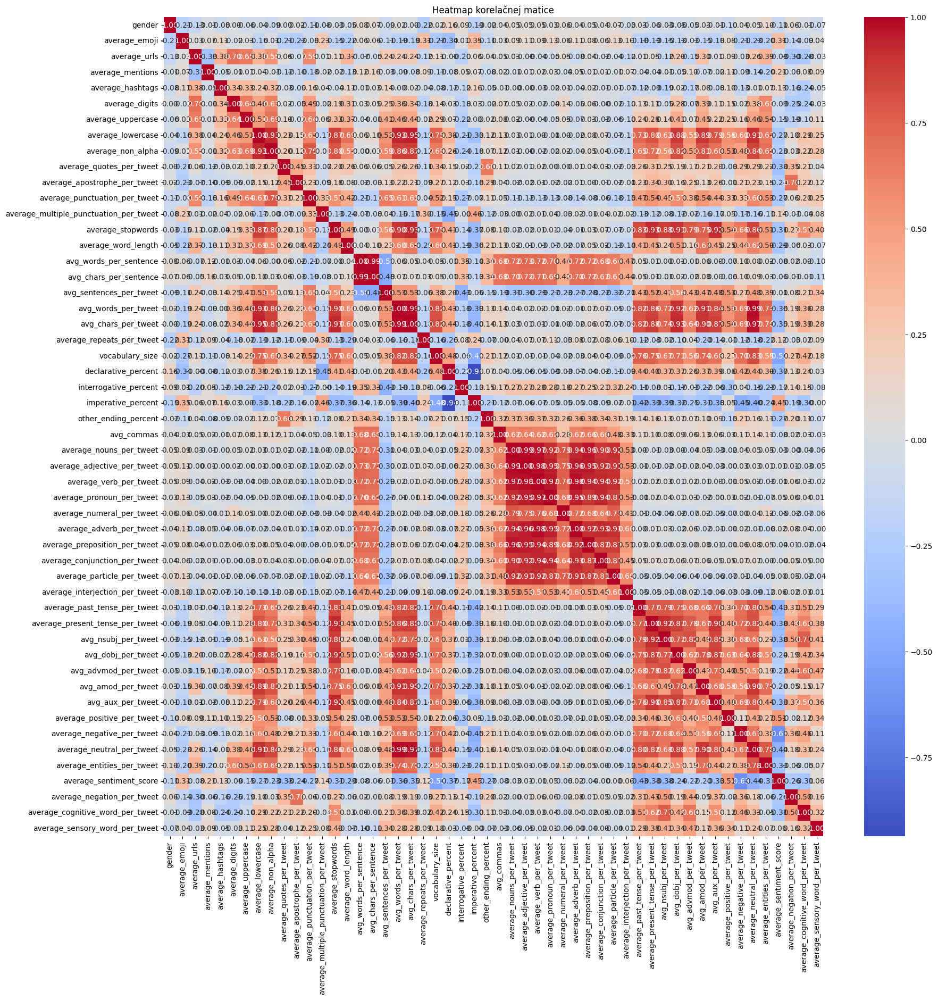

In [12]:
dataset_corr=dataset.drop([ 'lemmatized_text' ], axis=1)
corr_matrix = dataset_corr.corr()

# Vytvor heatmap
plt.figure(figsize=(20, 20))  # Nastav veľkosť obrázka podľa potreby
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title('Heatmap korelačnej matice')
plt.show()

ROZDELENIE NA TRENOVACI A TESTOVACI DATASET

Bez outlieerov a skalovania

In [13]:
y = dataset['gender']
X = dataset.drop(['gender'], axis=1) 

In [14]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [15]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3172 entries, 4185 to 1058
Data columns (total 52 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   average_emoji                           3172 non-null   float64
 1   average_urls                            3172 non-null   float64
 2   average_mentions                        3172 non-null   float64
 3   average_hashtags                        3172 non-null   float64
 4   average_digits                          3172 non-null   float64
 5   average_uppercase                       3172 non-null   float64
 6   average_lowercase                       3172 non-null   float64
 7   average_non_alpha                       3172 non-null   float64
 8   average_quotes_per_tweet                3172 non-null   float64
 9   average_apostrophe_per_tweet            3172 non-null   float64
 10  average_punctuation_per_tweet           3172 non-null   float6

In [16]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1360 entries, 2634 to 515
Data columns (total 52 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   average_emoji                           1360 non-null   float64
 1   average_urls                            1360 non-null   float64
 2   average_mentions                        1360 non-null   float64
 3   average_hashtags                        1360 non-null   float64
 4   average_digits                          1360 non-null   float64
 5   average_uppercase                       1360 non-null   float64
 6   average_lowercase                       1360 non-null   float64
 7   average_non_alpha                       1360 non-null   float64
 8   average_quotes_per_tweet                1360 non-null   float64
 9   average_apostrophe_per_tweet            1360 non-null   float64
 10  average_punctuation_per_tweet           1360 non-null   float64

Kedže veľkosť matice s frekvenciami n-gramov/slov môže byť veľmi vysoká a môže trvať aj veľmi dlho spustenie, tak sme sa rozhodli dať iba niekoľko nafrekventovanejším n-gramov/slov. Skúsili sme s rôznymi veľkosťami n-gramov natrénovať modeli aby sme videli, ktorá veľkosť je najefektívnejšia. Najlepšie by bolo toto spustiť aj s inými verziami datasetu (s outliermi, skalovaním a podobne), však to by bolo veľmi časovo náročné, tak sme zvolili túto možnosť so zakladnym datasetom. Po spustení tohto kodu sme väčšinou manuálne prepísali max_features v kode nižšie, kde sa vytvárali frekvencie n-gramov/slov, s ktorými pracujeme neskôr.

In [17]:
max_features_options = [500, 1000, 2000, 3000, 4000, 5000]  # Rôzne veľkosti slovníkov

for max_features in max_features_options:
    # Vektorizácia pre CountVectorizer
    vectorizer_ngram = CountVectorizer(ngram_range=(1, 4), analyzer='word', max_features=max_features)
    ngram_train = vectorizer_ngram.fit_transform(X_train['lemmatized_text'])
    ngram_test = vectorizer_ngram.transform(X_test['lemmatized_text'])
    
    # Kombinovanie n-gramov s ostatnými príznakmi, odstránenie 'lemmatized_text'
    X_train_dropped = X_train.drop(['lemmatized_text'], axis=1)
    X_test_dropped = X_test.drop(['lemmatized_text'], axis=1)
    X_train_combined = hstack([X_train_dropped, ngram_train])
    X_test_combined = hstack([X_test_dropped, ngram_test])

    # Trénovanie modelov
    models = {
        'SVC': SVC(),
        'Random Forest': RandomForestClassifier(),
        'Gradient Boosting Maschine': GradientBoostingClassifier()
    }

    for model_name, model in models.items():
        model.fit(X_train_combined, y_train)
        y_pred = model.predict(X_test_combined)
        accuracy = accuracy_score(y_test, y_pred)
        print(f'Model: {model_name}, Max Features: {max_features}, Accuracy: {accuracy:.2f}')

Model: SVC, Max Features: 500, Accuracy: 0.77
Model: Random Forest, Max Features: 500, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 500, Accuracy: 0.88
Model: SVC, Max Features: 1000, Accuracy: 0.77
Model: Random Forest, Max Features: 1000, Accuracy: 0.86
Model: Gradient Boosting Maschine, Max Features: 1000, Accuracy: 0.89
Model: SVC, Max Features: 2000, Accuracy: 0.78
Model: Random Forest, Max Features: 2000, Accuracy: 0.84
Model: Gradient Boosting Maschine, Max Features: 2000, Accuracy: 0.90
Model: SVC, Max Features: 3000, Accuracy: 0.78
Model: Random Forest, Max Features: 3000, Accuracy: 0.86
Model: Gradient Boosting Maschine, Max Features: 3000, Accuracy: 0.90
Model: SVC, Max Features: 4000, Accuracy: 0.78
Model: Random Forest, Max Features: 4000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 4000, Accuracy: 0.90
Model: SVC, Max Features: 5000, Accuracy: 0.78
Model: Random Forest, Max Features: 5000, Accuracy: 0.85
Model: Gradient Boosting Masc

In [18]:
max_features_options = [500, 1000, 2000, 3000, 4000, 5000]  # Rôzne veľkosti slovníkov

for max_features in max_features_options:
    # Vektorizácia pre TfidfVectorizer
    vectorizer_ngram = TfidfVectorizer(ngram_range=(1, 4), analyzer='word', max_features=max_features)
    ngram_train = vectorizer_ngram.fit_transform(X_train['lemmatized_text'])
    ngram_test = vectorizer_ngram.transform(X_test['lemmatized_text'])
    
    # Kombinovanie n-gramov s ostatnými príznakmi, odstránenie 'lemmatized_text'
    X_train_dropped = X_train.drop(['lemmatized_text'], axis=1)
    X_test_dropped = X_test.drop(['lemmatized_text'], axis=1)
    X_train_combined = hstack([X_train_dropped, ngram_train])
    X_test_combined = hstack([X_test_dropped, ngram_test])

    # Trénovanie modelov
    models = {
        'SVC': SVC(),
        'Random Forest': RandomForestClassifier(),
        'Gradient Boosting Maschine': GradientBoostingClassifier()
    }

    for model_name, model in models.items():
        model.fit(X_train_combined, y_train)
        y_pred = model.predict(X_test_combined)
        accuracy = accuracy_score(y_test, y_pred)
        print(f'Model: {model_name}, Max Features: {max_features}, Accuracy: {accuracy:.2f}')

Model: SVC, Max Features: 500, Accuracy: 0.72
Model: Random Forest, Max Features: 500, Accuracy: 0.86
Model: Gradient Boosting Maschine, Max Features: 500, Accuracy: 0.89
Model: SVC, Max Features: 1000, Accuracy: 0.72
Model: Random Forest, Max Features: 1000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 1000, Accuracy: 0.89
Model: SVC, Max Features: 2000, Accuracy: 0.72
Model: Random Forest, Max Features: 2000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 2000, Accuracy: 0.89
Model: SVC, Max Features: 3000, Accuracy: 0.72
Model: Random Forest, Max Features: 3000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 3000, Accuracy: 0.90
Model: SVC, Max Features: 4000, Accuracy: 0.72
Model: Random Forest, Max Features: 4000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 4000, Accuracy: 0.89
Model: SVC, Max Features: 5000, Accuracy: 0.72
Model: Random Forest, Max Features: 5000, Accuracy: 0.86
Model: Gradient Boosting Masc

In [19]:
max_features_options = [500, 1000, 2000, 3000, 4000, 5000]  # Rôzne veľkosti slovníkov

for max_features in max_features_options:
    # Vektorizácia pre CountVectorizer
    vectorizer_ngram = CountVectorizer( analyzer='word', max_features=max_features)
    ngram_train = vectorizer_ngram.fit_transform(X_train['lemmatized_text'])
    ngram_test = vectorizer_ngram.transform(X_test['lemmatized_text'])
    
    # Kombinovanie n-gramov s ostatnými príznakmi, odstránenie 'lemmatized_text'
    X_train_dropped = X_train.drop(['lemmatized_text'], axis=1)
    X_test_dropped = X_test.drop(['lemmatized_text'], axis=1)
    X_train_combined = hstack([X_train_dropped, ngram_train])
    X_test_combined = hstack([X_test_dropped, ngram_test])

    # Trénovanie modelov
    models = {
        'SVC': SVC(),
        'Random Forest': RandomForestClassifier(),
        'Gradient Boosting Maschine': GradientBoostingClassifier()
    }

    for model_name, model in models.items():
        model.fit(X_train_combined, y_train)
        y_pred = model.predict(X_test_combined)
        accuracy = accuracy_score(y_test, y_pred)
        print(f'Model: {model_name}, Max Features: {max_features}, Accuracy: {accuracy:.2f}')

Model: SVC, Max Features: 500, Accuracy: 0.77
Model: Random Forest, Max Features: 500, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 500, Accuracy: 0.88
Model: SVC, Max Features: 1000, Accuracy: 0.77
Model: Random Forest, Max Features: 1000, Accuracy: 0.86
Model: Gradient Boosting Maschine, Max Features: 1000, Accuracy: 0.89
Model: SVC, Max Features: 2000, Accuracy: 0.77
Model: Random Forest, Max Features: 2000, Accuracy: 0.86
Model: Gradient Boosting Maschine, Max Features: 2000, Accuracy: 0.90
Model: SVC, Max Features: 3000, Accuracy: 0.77
Model: Random Forest, Max Features: 3000, Accuracy: 0.86
Model: Gradient Boosting Maschine, Max Features: 3000, Accuracy: 0.90
Model: SVC, Max Features: 4000, Accuracy: 0.77
Model: Random Forest, Max Features: 4000, Accuracy: 0.84
Model: Gradient Boosting Maschine, Max Features: 4000, Accuracy: 0.90
Model: SVC, Max Features: 5000, Accuracy: 0.77
Model: Random Forest, Max Features: 5000, Accuracy: 0.86
Model: Gradient Boosting Masc

In [20]:
max_features_options = [500, 1000, 2000, 3000, 4000, 5000]  # Rôzne veľkosti slovníkov

for max_features in max_features_options:
    # Vektorizácia pre TfidfVectorizer
    vectorizer_ngram = TfidfVectorizer( analyzer='word', max_features=max_features)
    ngram_train = vectorizer_ngram.fit_transform(X_train['lemmatized_text'])
    ngram_test = vectorizer_ngram.transform(X_test['lemmatized_text'])
    
    # Kombinovanie n-gramov s ostatnými príznakmi, odstránenie 'lemmatized_text'
    X_train_dropped = X_train.drop(['lemmatized_text'], axis=1)
    X_test_dropped = X_test.drop(['lemmatized_text'], axis=1)
    X_train_combined = hstack([X_train_dropped, ngram_train])
    X_test_combined = hstack([X_test_dropped, ngram_test])

    # Trénovanie modelov
    models = {
        'SVC': SVC(),
        'Random Forest': RandomForestClassifier(),
        'Gradient Boosting Maschine': GradientBoostingClassifier()
    }

    for model_name, model in models.items():
        model.fit(X_train_combined, y_train)
        y_pred = model.predict(X_test_combined)
        accuracy = accuracy_score(y_test, y_pred)
        print(f'Model: {model_name}, Max Features: {max_features}, Accuracy: {accuracy:.2f}')

Model: SVC, Max Features: 500, Accuracy: 0.72
Model: Random Forest, Max Features: 500, Accuracy: 0.86
Model: Gradient Boosting Maschine, Max Features: 500, Accuracy: 0.89
Model: SVC, Max Features: 1000, Accuracy: 0.72
Model: Random Forest, Max Features: 1000, Accuracy: 0.86
Model: Gradient Boosting Maschine, Max Features: 1000, Accuracy: 0.89
Model: SVC, Max Features: 2000, Accuracy: 0.72
Model: Random Forest, Max Features: 2000, Accuracy: 0.86
Model: Gradient Boosting Maschine, Max Features: 2000, Accuracy: 0.90
Model: SVC, Max Features: 3000, Accuracy: 0.72
Model: Random Forest, Max Features: 3000, Accuracy: 0.87
Model: Gradient Boosting Maschine, Max Features: 3000, Accuracy: 0.90
Model: SVC, Max Features: 4000, Accuracy: 0.72
Model: Random Forest, Max Features: 4000, Accuracy: 0.86
Model: Gradient Boosting Maschine, Max Features: 4000, Accuracy: 0.90
Model: SVC, Max Features: 5000, Accuracy: 0.72
Model: Random Forest, Max Features: 5000, Accuracy: 0.86
Model: Gradient Boosting Masc

Vytvorenie frekvenci n-gramov, tfidf n-gramov, frekvenci slov, tfidf slov

In [21]:
vectorizer_ngram = CountVectorizer(ngram_range=(1, 4), analyzer='word', max_features=3000)
ngram_train = vectorizer_ngram.fit_transform(X_train['lemmatized_text'])
ngram_test = vectorizer_ngram.transform(X_test['lemmatized_text'])

In [22]:
vectorizer_ngram = TfidfVectorizer(ngram_range=(1, 4), analyzer='word',  max_features=5000)
ngram_train_tfidf = vectorizer_ngram.fit_transform(X_train['lemmatized_text'])
ngram_test_tfidf = vectorizer_ngram.transform(X_test['lemmatized_text'])

In [23]:
vectorizer_wfreq = CountVectorizer( analyzer='word', max_features=3000)
wfreq_train = vectorizer_wfreq.fit_transform(X_train['lemmatized_text'])
wfreq_test = vectorizer_wfreq.transform(X_test['lemmatized_text'])

In [24]:
vectorizer_wfreq = TfidfVectorizer( analyzer='word',  max_features=3000)
wfreq_train_tfidf = vectorizer_wfreq.fit_transform(X_train['lemmatized_text'])
wfreq_test_tfidf = vectorizer_wfreq.transform(X_test['lemmatized_text'])

Vymazeme slpcec, ktorý sme potrebovali na vytvorenie frekvencí n-gramov a slov, už ho viac nepotrebujeme

In [25]:
X_train = X_train.drop(['lemmatized_text'], axis=1)

In [26]:
X_test = X_test.drop(['lemmatized_text'], axis=1)

Spojíme stlpce datasetu s frekvenciami ngramov/ tfidf ngramov / slov / tfid slov

In [27]:
X_train_combined = hstack([X_train, ngram_train])
X_test_combined = hstack([X_test, ngram_test])
X_train_combined2 = hstack([X_train, ngram_train_tfidf])
X_test_combined2 = hstack([X_test, ngram_test_tfidf])
X_train_combined3 = hstack([X_train, wfreq_train])
X_test_combined3 = hstack([X_test, wfreq_test])
X_train_combined4 = hstack([X_train, wfreq_train_tfidf])
X_test_combined4 = hstack([X_test, wfreq_test_tfidf])

S ošetrenými outliermi

OUTLIERI

Rozhodla som sa riešiť outlierov (lebo niektoré algoritmy strojového učenia sú na to citlivé napríklad SVC) na základe pohlaví, kedže hodnoty v stlpcoch sa môžu líšiť na základe pohlavia a riešiť outlierov všeobecne v rámci celeho stlpca by mohlo zmenšiť rozdiely medzi pohlaviami. Zvolila som postup nahradenia outlierov meanom, kedže nechcem vymazávať a chcem ponechať rovnaký počet vzoriek. Zvolila som nahradiť dolných aj horných 10% aby som nahradila najviac vychýlené hodnoty, však aby som aj neskreslila veľmi distribúciu dát

In [28]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4532 entries, 0 to 4531
Data columns (total 53 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   gender                                  4532 non-null   int64  
 1   average_emoji                           4532 non-null   float64
 2   average_urls                            4532 non-null   float64
 3   average_mentions                        4532 non-null   float64
 4   average_hashtags                        4532 non-null   float64
 5   average_digits                          4532 non-null   float64
 6   average_uppercase                       4532 non-null   float64
 7   average_lowercase                       4532 non-null   float64
 8   average_non_alpha                       4532 non-null   float64
 9   average_quotes_per_tweet                4532 non-null   float64
 10  average_apostrophe_per_tweet            4532 non-null   floa

In [29]:
columns=['declarative_percent','interrogative_percent', 'imperative_percent', 'other_ending_percent', 'avg_commas','average_nouns_per_tweet', 'average_adjective_per_tweet', 'average_verb_per_tweet', 'average_pronoun_per_tweet', 'average_numeral_per_tweet', 'average_adverb_per_tweet', 'average_preposition_per_tweet','average_conjunction_per_tweet', 'average_particle_per_tweet', 'average_interjection_per_tweet', 'average_past_tense_per_tweet','average_present_tense_per_tweet', 'avg_nsubj_per_tweet','avg_dobj_per_tweet', 'avg_advmod_per_tweet', 'avg_amod_per_tweet','avg_aux_per_tweet' ]

Ako môžeme vidieť na grafe, tak veľa stlpcov obsahuje outlieerov - graf je pre celý dataset, nie pre x_train/x_test

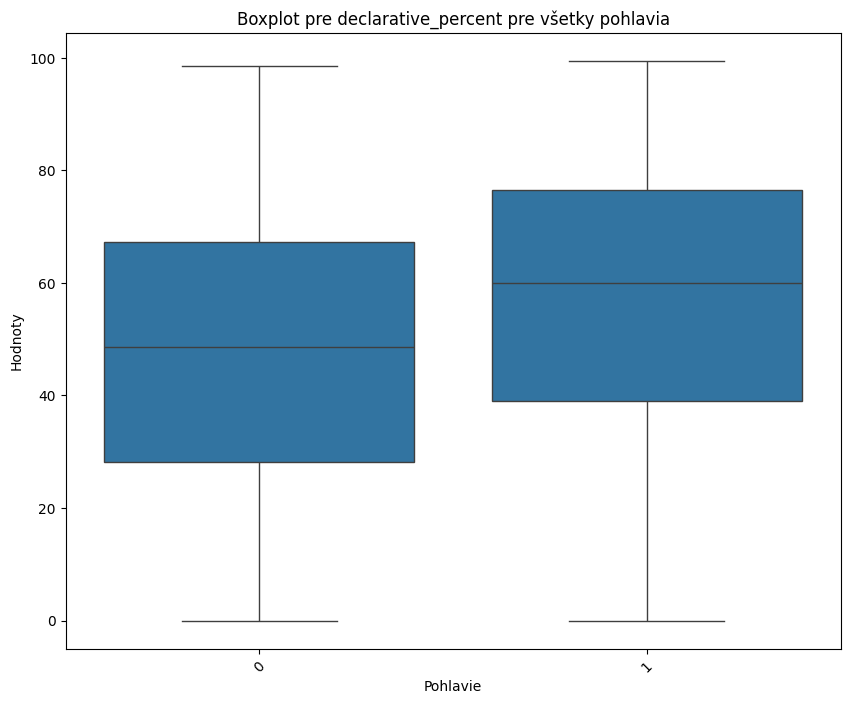

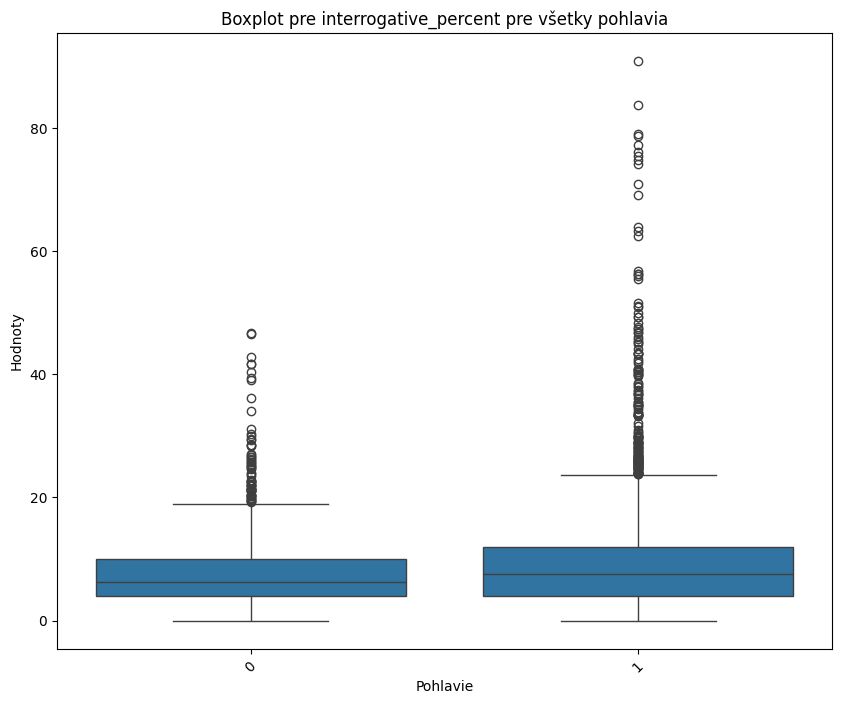

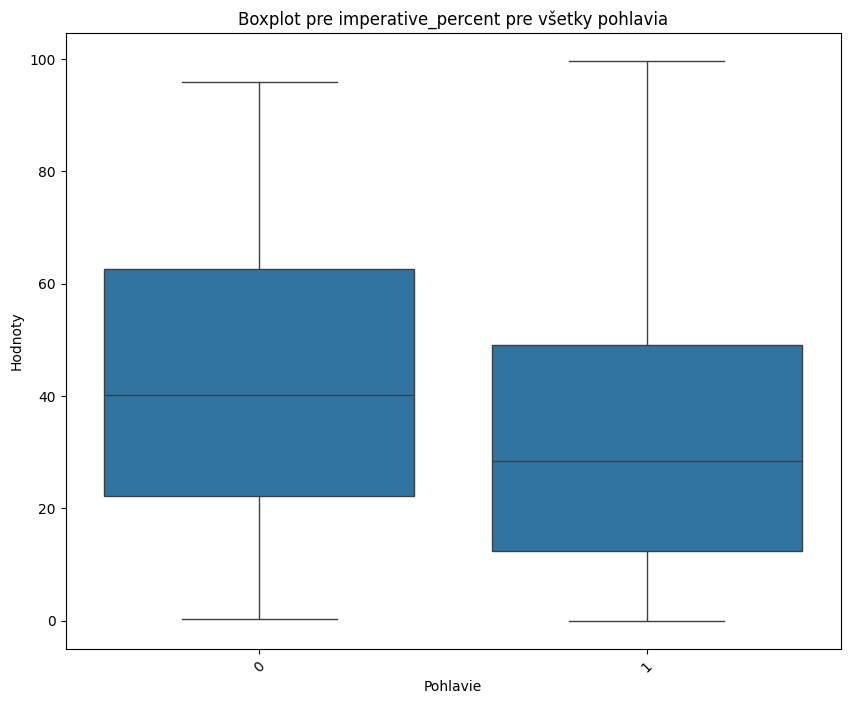

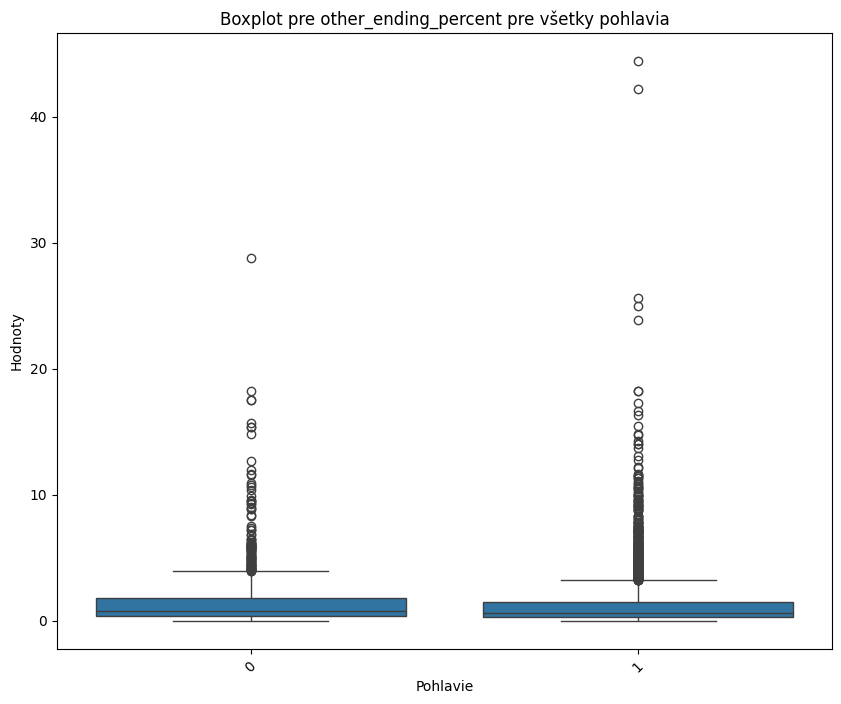

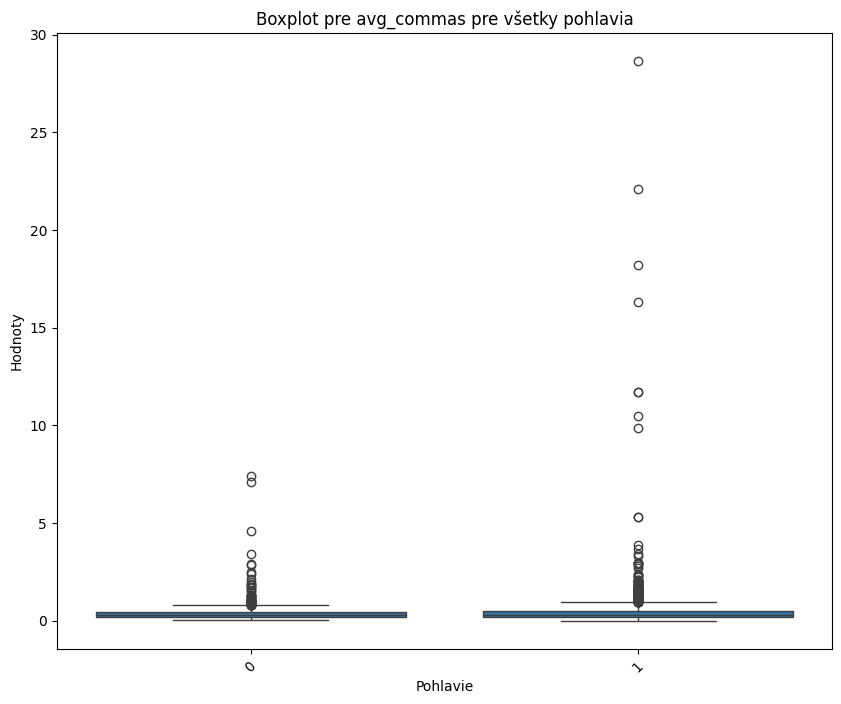

...

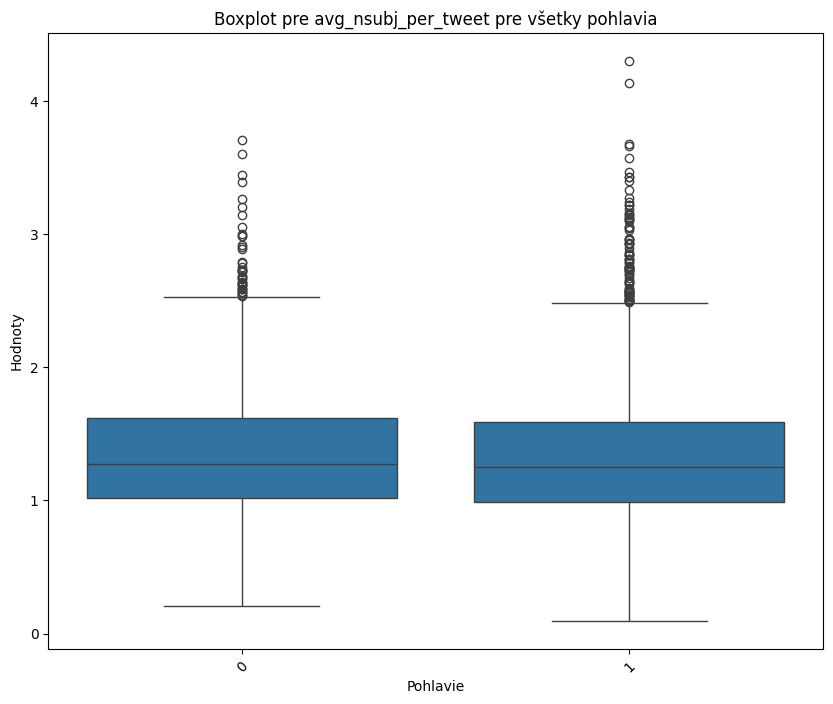

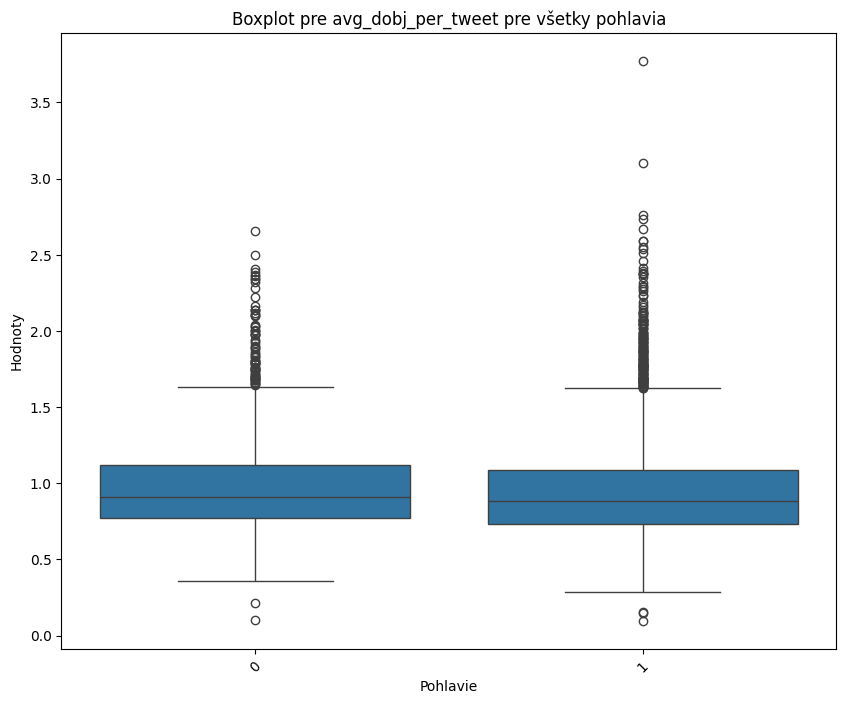

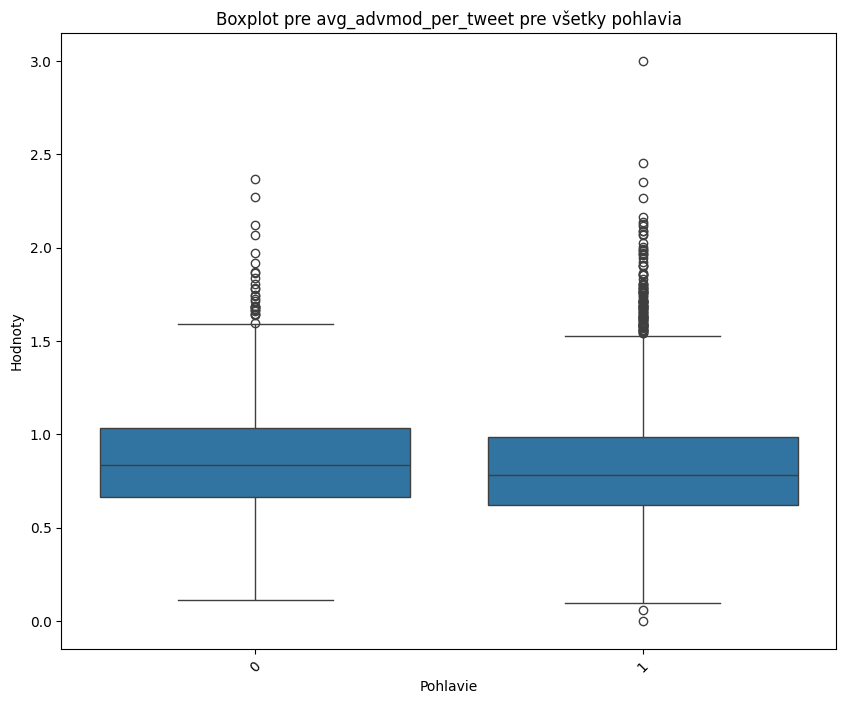

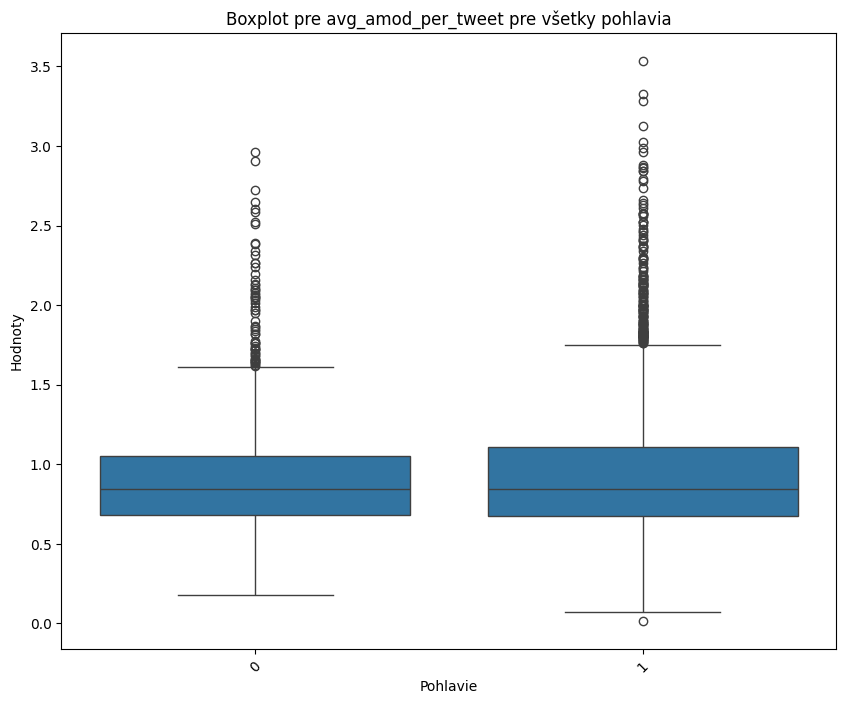

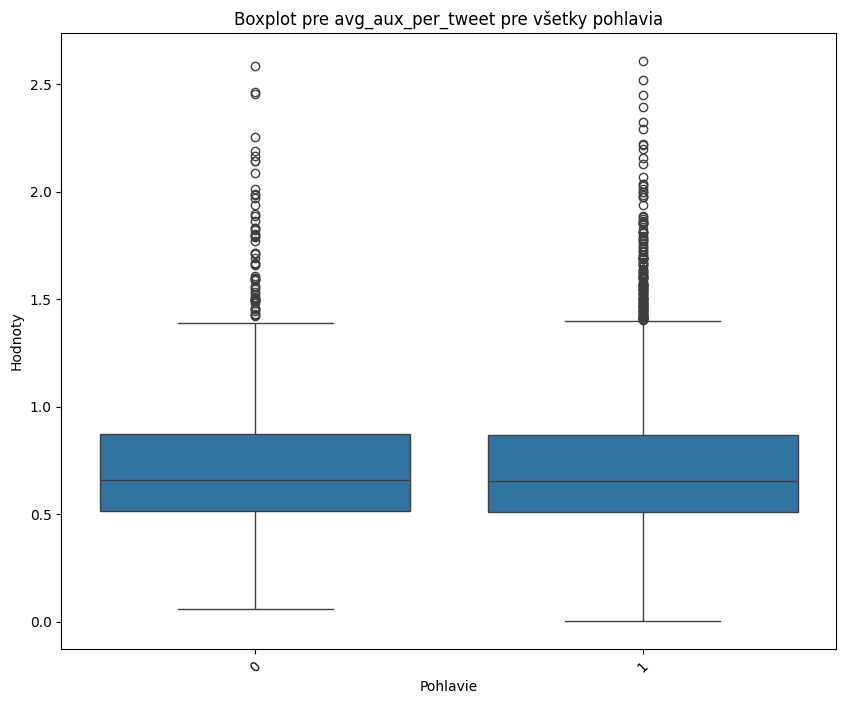

In [30]:
for column in columns:
    plt.figure(figsize=(10, 8)) # Nastaví veľkosť obrázku pre lepšiu čitateľnosť
    sns.boxplot(x='gender', y=column, data=dataset)
    plt.title(f'Boxplot pre {column} pre všetky pohlavia')
    plt.ylabel('Hodnoty')
    plt.xlabel('Pohlavie')
    plt.xticks(rotation=45) # Otáčanie menoviek pre lepšiu čitateľnosť
    plt.show()

Chceli sme zistiť outlierov pre každý slpcec a zároveň pohlavie. Zistili sme si v celkom datasete (nie pre X_train a X_test oddelene, kedže tie hranice by sa mohli líšiť) hranice a mean pre každý stlpec a zároveň každé pohlavie.

In [31]:
global_stats = {}
# Prechádza cez unikátne pohlavia v dátovom rámci
for gender in dataset['gender'].unique():
    # Prechádza cez zoznam stĺpcov, pre ktoré sa majú vypočítať štatistiky
    for column in columns:
        # Vyberie podmnožinu dát patriacu k aktuálneho pohlavia
        group_subset = dataset[dataset['gender'] == gender]
        # Vypočíta dolný limit ako 10. percentil hodnôt v aktuálnom stĺpci a pohlavi
        lower_limit = group_subset[column].quantile(0.10)
        # Vypočíta horny limit ako 90. percentil hodnôt v aktuálnom stĺpci a pohlavi
        upper_limit = group_subset[column].quantile(0.90)
        # Vypočítanie priemernej hodnoty pre dáta medzi dolným a horným limitom
        mean_value = group_subset[(group_subset[column] >= lower_limit) & (group_subset[column] <= upper_limit)][column].mean()
        # Uloženie vypočítaných štatistík do slovníka s kľúčom ako dvojica (pohlavie, názov stĺpca)
        global_stats[(gender, column)] = (lower_limit, upper_limit, mean_value)

In [32]:
X_train_out = X_train.copy()
X_test_out = X_test.copy()

Následne sme si prvky v stlpcoch, ktoré su pod dolnou hranicou alebo za hornou hranocou nahranili meanom v trenovacom aj v testovacom datasete.

In [33]:
# Iteruje cez každý riadok datasetu
for index, row in X_train_out.iterrows():
    # Získa skupinu pohlavia pre aktuálny riadok z iného DataFrame y_train pomocou indexu
    gender = y_train.loc[index] 
    
    # Iteruje cez stlpce
    for column in columns:
        # Získa dolný a horný limit a priemernú hodnotu pre aktuálnu kombináciu pohlavia a stĺpca z predtým vytvoreného slovníka global_stats
        lower_limit, upper_limit, mean_value = global_stats[(gender, column)]
        
        # Ak je hodnota v aktuálnom riadku a stĺpci menšia ako dolný limit alebo väčšia ako horný limit,
        # nastaví hodnotu v tomto riadku a stĺpci na priemernú hodnotu pre túto skupinu
        if row[column] < lower_limit or row[column] > upper_limit:
            X_train_out.at[index, column] = mean_value

In [34]:
# Iteruje cez každý riadok datasetu
for index, row in X_test_out.iterrows():
     # Získa skupinu pohlavia pre aktuálny riadok z iného DataFrame y_train pomocou indexu
    gender = y_test.loc[index] 
    # Iteruje cez stlpce
    for column in columns:
         # Získa dolný a horný limit a priemernú hodnotu pre aktuálnu kombináciu pohlavia a stĺpca z predtým vytvoreného slovníka global_stats
        lower_limit, upper_limit, mean_value = global_stats[(gender, column)]
        # Ak je hodnota v aktuálnom riadku a stĺpci menšia ako dolný limit alebo väčšia ako horný limit,
        # nastaví hodnotu v tomto riadku a stĺpci na priemernú hodnotu pre túto skupinu
        if row[column] < lower_limit or row[column] > upper_limit:
            X_test_out.at[index, column] = mean_value

Spojenie s ngramami / tfidf n-gramami /slovami / tfidf slovami

In [35]:
X_train_combined_out = hstack([X_train_out, ngram_train])
X_test_combined_out = hstack([X_test_out, ngram_test])
X_train_combined2_out = hstack([X_train_out, ngram_train_tfidf])
X_test_combined2_out = hstack([X_test_out, ngram_test_tfidf])
X_train_combined3_out = hstack([X_train_out, wfreq_train])
X_test_combined3_out = hstack([X_test_out, wfreq_test])
X_train_combined4_out = hstack([X_train_out, wfreq_train_tfidf])
X_test_combined4_out = hstack([X_test_out, wfreq_test_tfidf])

S aplikovaným škálovaním

SKALOVANIE

Kedže množstvo mojích dát má iné rozsahy a niektoré algoritmy strojového učenia (najmä tie, ktoré sú založené na vzdialenosti ) ako napríklad SVC sú citlivé na rozsahy tak som sa rozhodla pre škálovanie. Škálovanie môže pomôcť zabezpečiť, že jeden atribút neovládne ostatné pri výpočte vzdialeností.

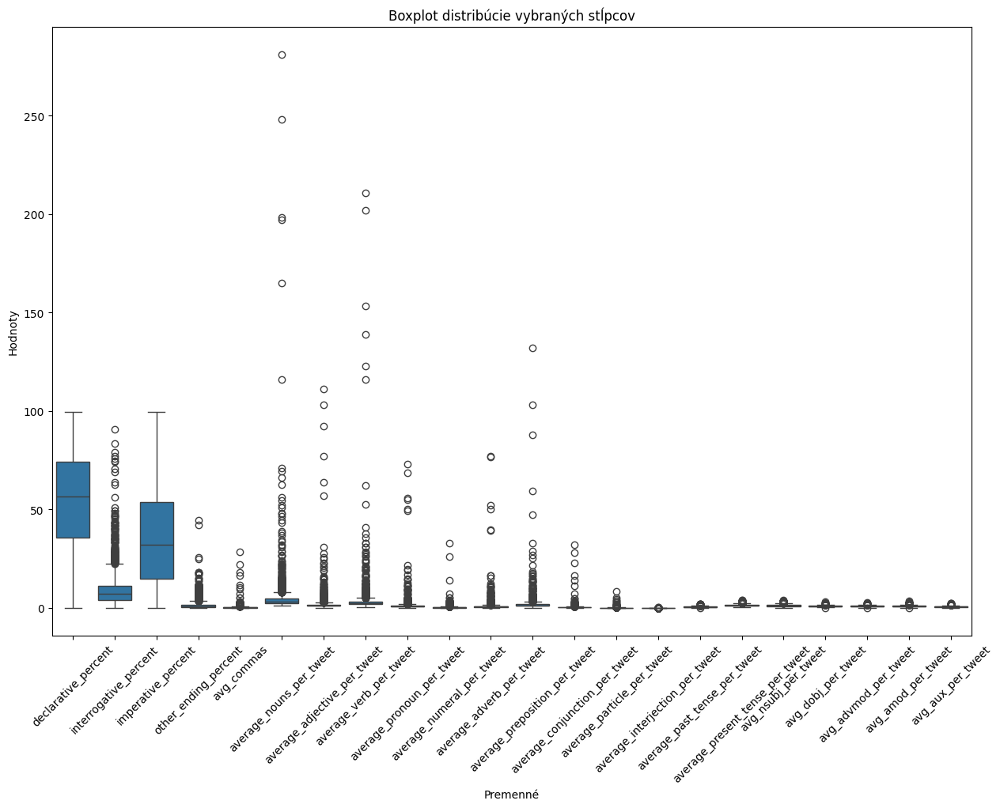

In [36]:
melted_df = pd.melt(X_train, value_vars=columns)

# Teraz použite Seaborn na zobrazenie distribúcií pomocou boxplotu
plt.figure(figsize=(15, 10))
sns.boxplot(x='variable', y='value', data=melted_df)
plt.xticks(rotation=45)
plt.title('Boxplot distribúcie vybraných stĺpcov')
plt.xlabel('Premenné')
plt.ylabel('Hodnoty')
plt.show()

In [37]:
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

Skalovala som si všetky numericke stpce a to tak, že som to fitla na trenovaci dataset a transormovala na obidvoch, aj na trenovacom aj testovacom

In [38]:
scaler = MinMaxScaler()
scaler.fit(X_train_scaled[columns])
X_train_scaled[columns] = scaler.transform(X_train_scaled[columns])
X_test_scaled[columns] = scaler.transform(X_test_scaled[columns])

Spojenie datasetu s ngramami / tfidf n-gramami / slovami / tfidf slovami

In [39]:
X_train_combined_scaled = hstack([X_train_scaled, ngram_train])
X_test_combined_scaled = hstack([X_test_scaled, ngram_test])
X_train_combined2_scaled = hstack([X_train_scaled, ngram_train_tfidf])
X_test_combined2_scaled = hstack([X_test_scaled, ngram_test_tfidf])
X_train_combined3_scaled = hstack([X_train_scaled, wfreq_train])
X_test_combined3_scaled = hstack([X_test_scaled, wfreq_test])
X_train_combined4_scaled = hstack([X_train_scaled, wfreq_train_tfidf])
X_test_combined4_scaled = hstack([X_test_scaled, wfreq_test_tfidf])

Zobrazili sme si zoskalovane data a vidíme, že sú v rovnakom rozmedzí, však nachádza sa tam množstvo outlierov

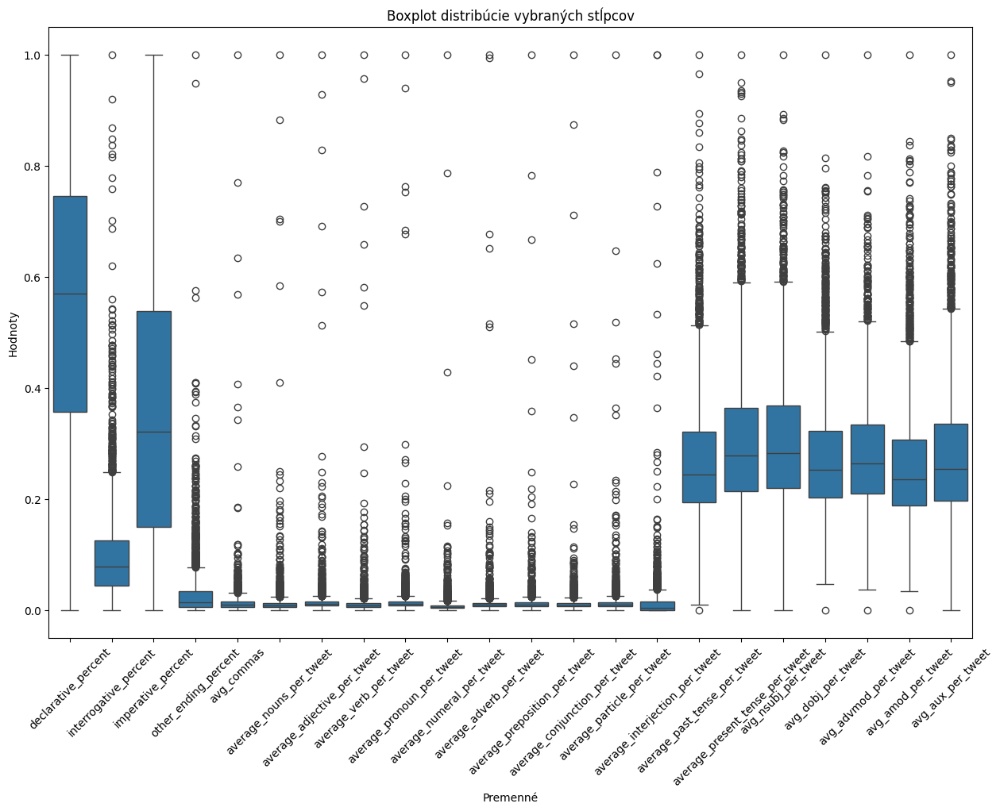

In [40]:
melted_df = pd.melt(X_train_scaled, value_vars=columns)

# Teraz použite Seaborn na zobrazenie distribúcií pomocou boxplotu
plt.figure(figsize=(15, 10))
sns.boxplot(x='variable', y='value', data=melted_df)
plt.xticks(rotation=45)
plt.title('Boxplot distribúcie vybraných stĺpcov')
plt.xlabel('Premenné')
plt.ylabel('Hodnoty')
plt.show()

S ošetrenými outliermi aj aplikovaným škálovaním

In [41]:
X_train_scal_out = X_train_out.copy()
X_test_scal_out = X_test_out.copy()

Zoškálujem si dataset s ošetrenými outliermi

In [42]:
scaler = MinMaxScaler()
scaler.fit(X_train_scaled[columns])
X_train_scal_out[columns] = scaler.transform(X_train_scal_out[columns])
X_test_scal_out[columns] = scaler.transform(X_test_scal_out[columns])

Spojím si dataset s ngramami / tfidf ngramami / slovami / tfidf slovami

In [43]:
X_train_combined_scal_out = hstack([X_train_scal_out, ngram_train])
X_test_combined_scal_out = hstack([X_test_scal_out, ngram_test])
X_train_combined2_scal_out = hstack([X_train_scal_out, ngram_train_tfidf])
X_test_combined2_scal_out = hstack([X_test_scal_out, ngram_test_tfidf])
X_train_combined3_scal_out = hstack([X_train_scal_out, wfreq_train])
X_test_combined3_scal_out = hstack([X_test_scal_out, wfreq_test])
X_train_combined4_scal_out = hstack([X_train_scal_out, wfreq_train_tfidf])
X_test_combined4_scal_out = hstack([X_test_scal_out, wfreq_test_tfidf])

TRENOVANIE 1

Prvé trenovanie som vykonala so všetkými premennými (bez výberu črt) aby som videla aké výsledky môžem dostať. Vykonala som testovanie na 3 modeloch: Random Forest, GBM a SVC. Taktiež na každom modeli som skúsila rôzne varianty datasetu aby som videla s ktorým viem dosiahnúť najlepšie výsledky: bez ošetrenia outlierov a bez škálovania, bez ošetrenia outlierov a bez škálovania a s ngramami, bez ošetrenia outlierov a bez škálovania a s tfidf ngramami, s ošetrením outlierov, s ošetrením outlierov a s ngrami, s ošetrením outlierov a s tfidf ngramami, so škálovaním, so škálovaním a s ngramami, so škálovaním a s tfidf ngramami, s ošetrením outlierov a so škálovaním, s ošetrením outlierov a so škálovaním a s ngramami, s ošetrením outlierov a so škálovaním a s tfidf ngramami.

In [44]:
results_list1_svc=[]#na ukladanie testovacej a trenovacej accuracy

SVC - bez ošetrenia outlierov a skalovania

Trenovanie modelu

In [45]:
svc_model = SVC()
svc_model.fit(X_train, y_train)

SVC()

Predikovanie na trenovacich datach

In [46]:
y_pred_train = svc_model.predict(X_train)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))


Presnosť: 0.6979823455233292
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

Predikovanie na testovacich datach

In [47]:
y_pred = svc_model.predict(X_test)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

Uloženie trenovacej a testovacej accuracy do poľa s výsledkami z prveho testovania pre svc

In [48]:
results_list1_svc.append({
    'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
    ,
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),  
    'precision_test': precision_score(y_test, y_pred, average='binary'), 
    'recall_train': recall_score(y_train, y_pred_train, average='binary'), 
    'recall_test': recall_score(y_test, y_pred, average='binary'),  
    'f1_train': f1_score(y_train, y_pred_train, average='binary'), 
    'f1_test': f1_score(y_test, y_pred, average='binary') 
})


In [49]:
results_list1_svc

[{'accuracy_train': 0.6979823455233292,
  'accuracy_test': 0.7183823529411765,
  'precision_train': 0.6979823455233292,
  'precision_test': 0.7183823529411765,
  'recall_train': 1.0,
  'recall_test': 1.0,
  'f1_train': 0.8221314519123654,
  'f1_test': 0.8361146769362431}]

Zobrazenie metrik

In [50]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary') 
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.3f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))


Accuracy: 0.718
Recall: 1.00
Precision: 0.72
F1 Score: 0.84


Vizualizácia výkonnosti modelu

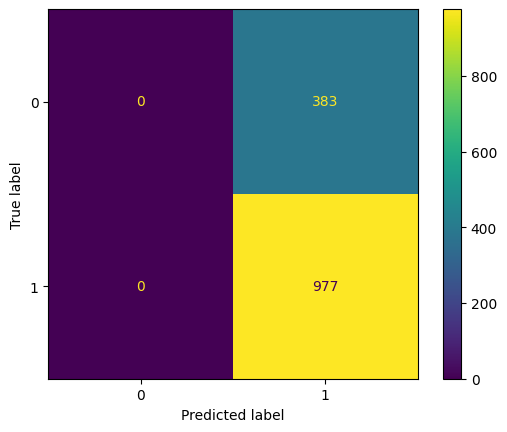

In [51]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - bez ošetrenia outlierov a skalovania a ngram

In [52]:
svc_model = SVC()
svc_model.fit(X_train_combined, y_train)

SVC()

In [53]:
y_pred_train = svc_model.predict(X_train_combined)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7632408575031526
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.26      0.39       958
           1       0.75      0.98      0.85      2214

    accuracy                           0.76      3172
   macro avg       0.81      0.62      0.62      3172
weighted avg       0.79      0.76      0.71      3172



In [54]:
y_pred = svc_model.predict(X_test_combined)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.84      0.26      0.40       383
           1       0.77      0.98      0.86       977

    accuracy                           0.78      1360
   macro avg       0.81      0.62      0.63      1360
weighted avg       0.79      0.78      0.73      1360



In [55]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [56]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.78
Recall: 0.98
Precision: 0.77
F1 Score: 0.86


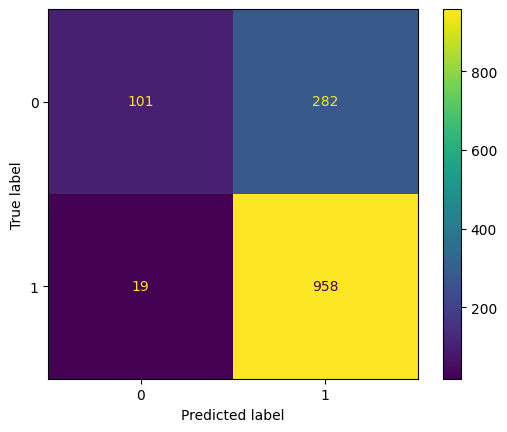

In [57]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - bez ošetrenia outlierov a skalovania a tfidf ngram

In [58]:
svc_model = SVC()
svc_model.fit(X_train_combined2, y_train)

SVC()

In [59]:
y_pred_train = svc_model.predict(X_train_combined2)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6979823455233292
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [60]:
y_pred = svc_model.predict(X_test_combined2)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [61]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })


In [62]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))


Accuracy: 0.72
Recall: 1.00
Precision: 0.72
F1 Score: 0.84


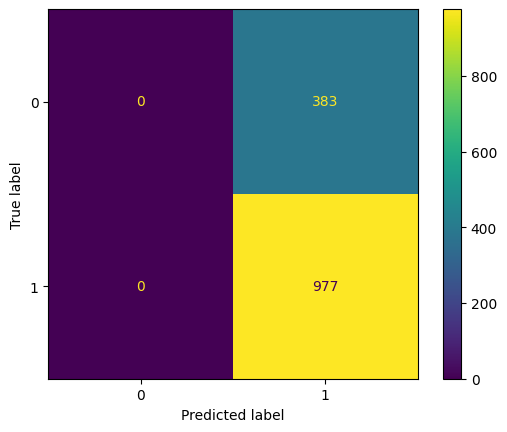

In [63]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - bez ošetrenia outlierov a skalovania a word frequency

In [64]:
svc_model = SVC()
svc_model.fit(X_train_combined3, y_train)

SVC()

In [65]:
y_pred_train = svc_model.predict(X_train_combined3)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7550441361916772
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.22      0.36       958
           1       0.75      0.99      0.85      2214

    accuracy                           0.76      3172
   macro avg       0.81      0.60      0.60      3172
weighted avg       0.78      0.76      0.70      3172



In [66]:
y_pred = svc_model.predict(X_test_combined3)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.22      0.35       383
           1       0.76      0.99      0.86       977

    accuracy                           0.77      1360
   macro avg       0.82      0.60      0.61      1360
weighted avg       0.80      0.77      0.72      1360



In [67]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [68]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.77
Recall: 0.99
Precision: 0.76
F1 Score: 0.86


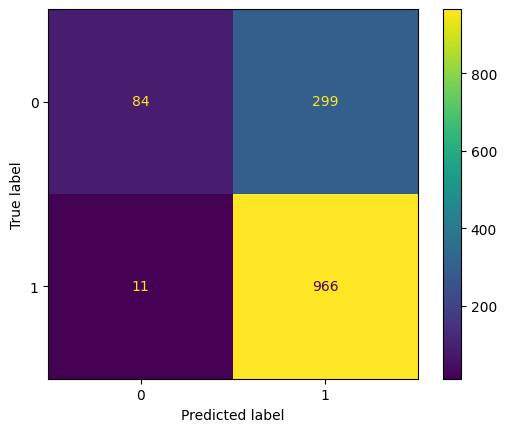

In [69]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - bez ošetrenia outlierov a skalovania a tfidf word frequency

In [70]:
svc_model = SVC()
svc_model.fit(X_train_combined4, y_train)

SVC()

In [71]:
y_pred_train = svc_model.predict(X_train_combined4)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6979823455233292
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [72]:
y_pred = svc_model.predict(X_test_combined4)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [73]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [74]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))

Accuracy: 0.72
Recall: 1.00
Precision: 0.72


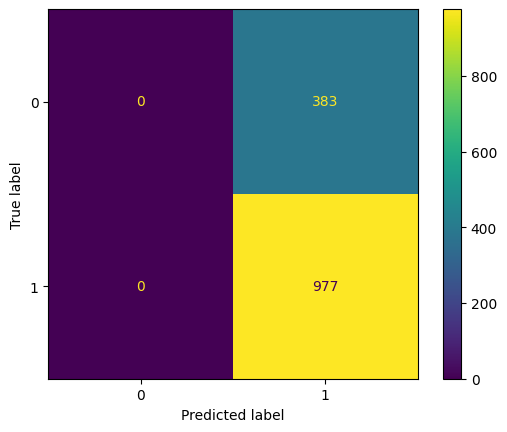

In [75]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrím outlierov

In [76]:
svc_model = SVC()
svc_model.fit(X_train_out, y_train)

SVC()

In [77]:
y_pred_train = svc_model.predict(X_train_out)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [78]:
y_pred = svc_model.predict(X_test_out)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [79]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })


In [80]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.72
Recall: 1.00
Precision: 0.72
F1 Score: 0.84


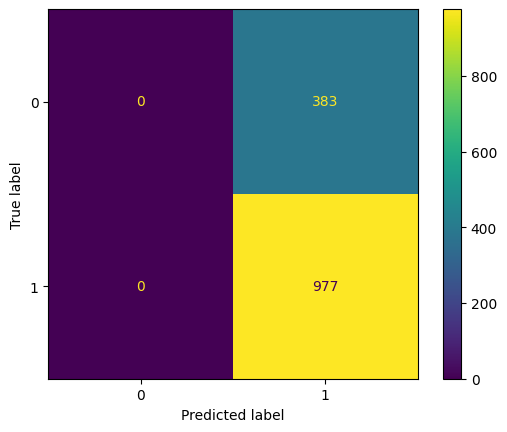

In [81]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrím outlierov a ngram

In [82]:
svc_model = SVC()
svc_model.fit(X_train_combined_out, y_train)

SVC()

In [83]:
y_pred_train = svc_model.predict(X_train_combined_out)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.29      0.43       958
           1       0.76      0.98      0.86      2214

    accuracy                           0.77      3172
   macro avg       0.82      0.64      0.65      3172
weighted avg       0.80      0.77      0.73      3172



In [84]:
y_pred = svc_model.predict(X_test_combined_out)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.27      0.41       383
           1       0.77      0.98      0.87       977

    accuracy                           0.78      1360
   macro avg       0.81      0.62      0.64      1360
weighted avg       0.79      0.78      0.74      1360



In [85]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [86]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.78
Recall: 0.98
Precision: 0.77
F1 Score: 0.87


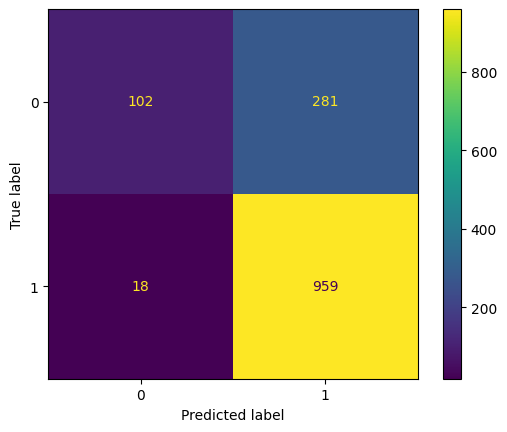

In [87]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrím outlierov a tfidf ngram

In [88]:
svc_model = SVC()
svc_model.fit(X_train_combined2_out, y_train)

SVC()

In [89]:
y_pred_train = svc_model.predict(X_train_combined2_out)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [90]:
y_pred = svc_model.predict(X_test_combined2_out)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [91]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [92]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.72
Recall: 1.00
Precision: 0.72
F1 Score: 0.84


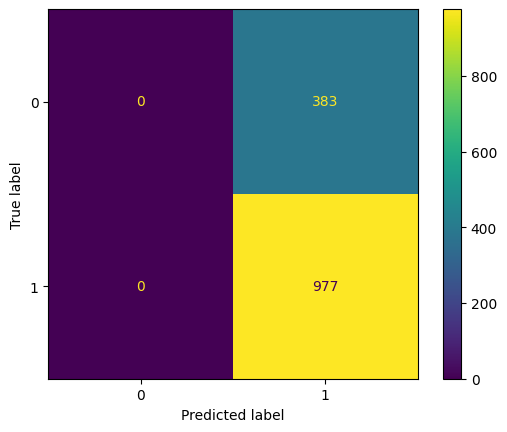

In [93]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrím outlierov a word frequency

In [94]:
svc_model = SVC()
svc_model.fit(X_train_combined3_out, y_train)

SVC()

In [95]:
y_pred_train = svc_model.predict(X_train_combined3_out)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.26      0.40       958
           1       0.76      0.98      0.85      2214

    accuracy                           0.77      3172
   macro avg       0.82      0.62      0.63      3172
weighted avg       0.79      0.77      0.72      3172



In [96]:
y_pred = svc_model.predict(X_test_combined3_out)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.23      0.37       383
           1       0.77      0.98      0.86       977

    accuracy                           0.77      1360
   macro avg       0.81      0.61      0.61      1360
weighted avg       0.79      0.77      0.72      1360



In [97]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [98]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.77
Recall: 0.98
Precision: 0.77
F1 Score: 0.86


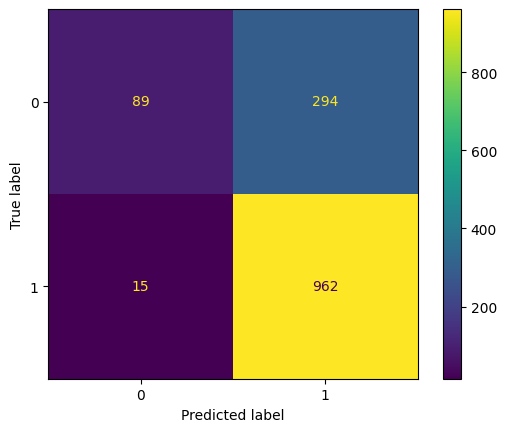

In [99]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrím outlierov a tfidf word frequency

In [100]:
svc_model = SVC()
svc_model.fit(X_train_combined4_out, y_train)

SVC()

In [101]:
y_pred_train = svc_model.predict(X_train_combined4_out)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [102]:
y_pred = svc_model.predict(X_test_combined4_out)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [103]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [104]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.72
Recall: 1.00
Precision: 0.72
F1 Score: 0.84


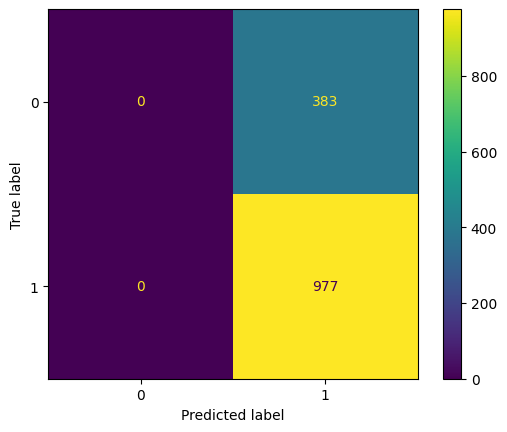

In [105]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - so skalovanim

In [106]:
svc_model = SVC()
svc_model.fit(X_train_scaled, y_train)

SVC()

In [107]:
y_pred_train = svc_model.predict(X_train_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6979823455233292
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [108]:
y_pred = svc_model.predict(X_test_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7183823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [109]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [110]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.72
Recall: 1.00
Precision: 0.72
F1 Score: 0.84


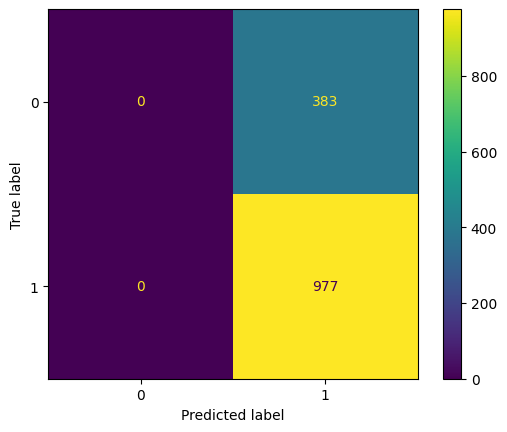

In [111]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - so skalovanim a ngram

In [112]:
svc_model = SVC()
svc_model.fit(X_train_combined_scaled, y_train)

SVC()

In [113]:
y_pred_train = svc_model.predict(X_train_combined_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7534678436317781
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.22      0.35       958
           1       0.75      0.98      0.85      2214

    accuracy                           0.75      3172
   macro avg       0.80      0.60      0.60      3172
weighted avg       0.78      0.75      0.70      3172



In [114]:
y_pred = svc_model.predict(X_test_combined_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7713235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.22      0.35       383
           1       0.76      0.99      0.86       977

    accuracy                           0.77      1360
   macro avg       0.82      0.60      0.61      1360
weighted avg       0.79      0.77      0.72      1360



In [115]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [116]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.77
Recall: 0.99
Precision: 0.76
F1 Score: 0.86


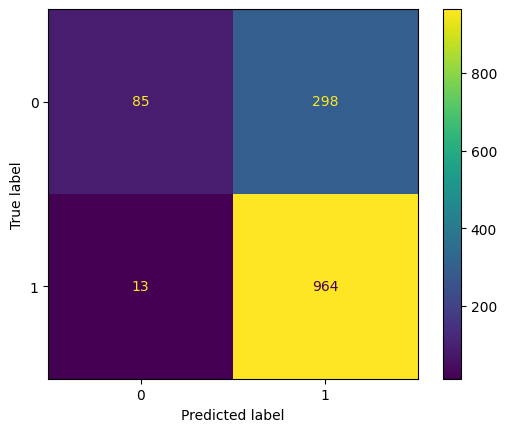

In [117]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - so skalovanim a tfidf ngram

In [118]:
svc_model = SVC()
svc_model.fit(X_train_combined2_scaled, y_train)

SVC()

In [119]:
y_pred_train = svc_model.predict(X_train_combined2_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6979823455233292
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [120]:
y_pred = svc_model.predict(X_test_combined2_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7183823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [121]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [122]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.72
Recall: 1.00
Precision: 0.72
F1 Score: 0.84


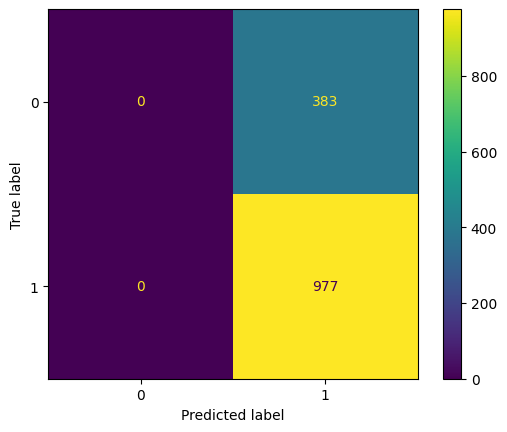

In [123]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - so skalovanim a word frequency

In [124]:
svc_model = SVC()
svc_model.fit(X_train_combined3_scaled, y_train)

SVC()

In [125]:
y_pred_train = svc_model.predict(X_train_combined3_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7395964691046658
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.17      0.28       958
           1       0.73      0.99      0.84      2214

    accuracy                           0.74      3172
   macro avg       0.79      0.58      0.56      3172
weighted avg       0.77      0.74      0.67      3172



In [126]:
y_pred = svc_model.predict(X_test_combined3_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7558823529411764
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.16      0.27       383
           1       0.75      0.99      0.85       977

    accuracy                           0.76      1360
   macro avg       0.81      0.57      0.56      1360
weighted avg       0.78      0.76      0.69      1360



In [127]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [128]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.76
Recall: 0.99
Precision: 0.75
F1 Score: 0.85


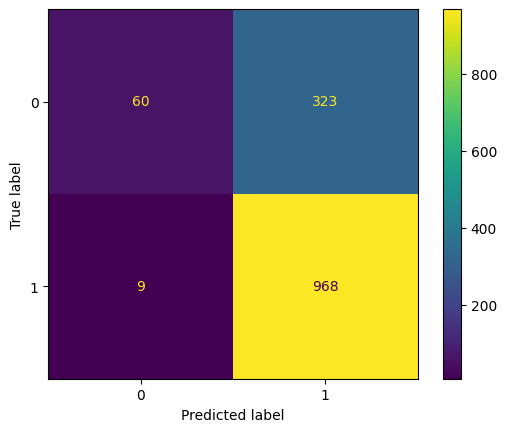

In [129]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - so skalovanim a tfidf word frequency

In [130]:
svc_model = SVC()
svc_model.fit(X_train_combined4_scaled, y_train)

SVC()

In [131]:
y_pred_train = svc_model.predict(X_train_combined4_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6979823455233292
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [132]:
y_pred = svc_model.predict(X_test_combined4_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7183823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [133]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [134]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.72
Recall: 1.00
Precision: 0.72
F1 Score: 0.84


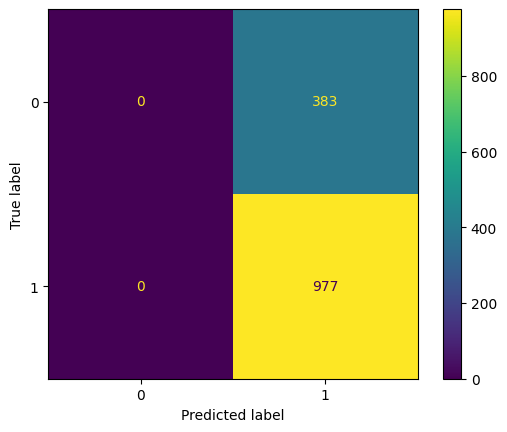

In [135]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrim outlierov a skalovanim

In [136]:
svc_model = SVC()
svc_model.fit(X_train_scal_out, y_train)

SVC()

In [137]:
y_pred_train = svc_model.predict(X_train_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6979823455233292
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [138]:
y_pred = svc_model.predict(X_test_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7183823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [139]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })


In [140]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.72
Recall: 1.00
Precision: 0.72
F1 Score: 0.84


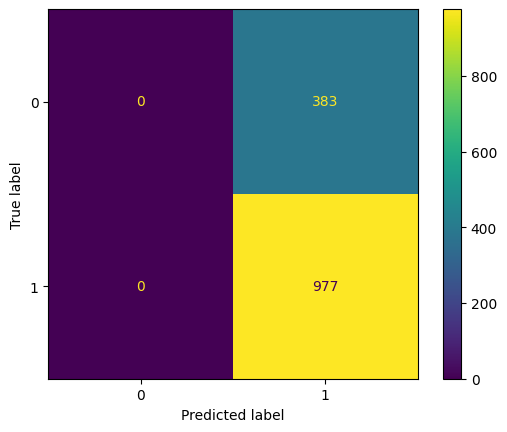

In [141]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrim outlierov a skalovanim a ngram

In [142]:
svc_model = SVC()
svc_model.fit(X_train_combined_scal_out, y_train)

SVC()

In [143]:
y_pred_train = svc_model.predict(X_train_combined_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7726986128625473
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.29      0.43       958
           1       0.76      0.98      0.86      2214

    accuracy                           0.77      3172
   macro avg       0.82      0.64      0.65      3172
weighted avg       0.80      0.77      0.73      3172



In [144]:
y_pred = svc_model.predict(X_test_combined_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7801470588235294
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.27      0.41       383
           1       0.77      0.98      0.87       977

    accuracy                           0.78      1360
   macro avg       0.81      0.62      0.64      1360
weighted avg       0.79      0.78      0.74      1360



In [145]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [146]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.78
Recall: 0.98
Precision: 0.77
F1 Score: 0.87


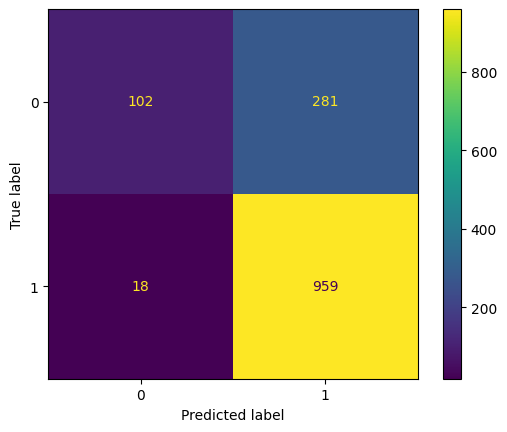

In [147]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrim outlierov a skalovanim a tfidf ngram

In [148]:
svc_model = SVC()
svc_model.fit(X_train_combined2_scal_out, y_train)

SVC()

In [149]:
y_pred_train = svc_model.predict(X_train_combined2_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6979823455233292
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [150]:
y_pred = svc_model.predict(X_test_combined2_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7183823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [151]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [152]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.72
Recall: 1.00
Precision: 0.72
F1 Score: 0.84


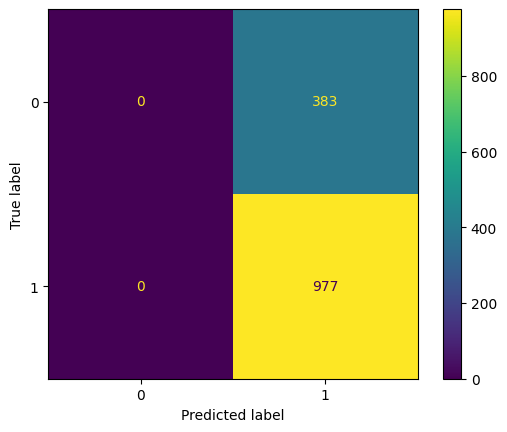

In [153]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrim outlierov a skalovanim a word frequency

In [154]:
svc_model = SVC()
svc_model.fit(X_train_combined3_scal_out, y_train)

SVC()

In [155]:
y_pred_train = svc_model.predict(X_train_combined3_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7663934426229508
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.26      0.40       958
           1       0.76      0.98      0.85      2214

    accuracy                           0.77      3172
   macro avg       0.82      0.62      0.63      3172
weighted avg       0.79      0.77      0.72      3172



In [156]:
y_pred = svc_model.predict(X_test_combined3_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7727941176470589
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.23      0.37       383
           1       0.77      0.98      0.86       977

    accuracy                           0.77      1360
   macro avg       0.81      0.61      0.61      1360
weighted avg       0.79      0.77      0.72      1360



In [157]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [158]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.77
Recall: 0.98
Precision: 0.77
F1 Score: 0.86


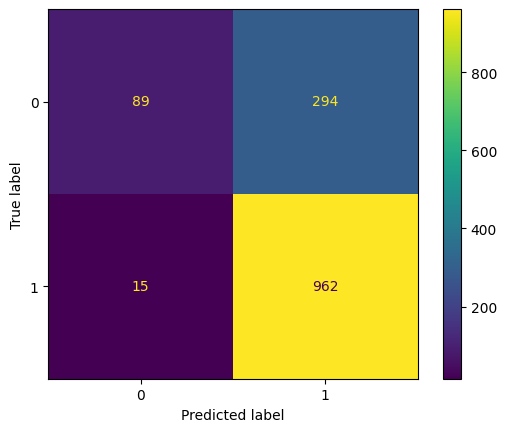

In [159]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrim outlierov a skalovanim a tfidf word frequency

In [160]:
svc_model = SVC()
svc_model.fit(X_train_combined4_scal_out, y_train)

SVC()

In [161]:
y_pred_train = svc_model.predict(X_train_combined4_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6979823455233292
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [162]:
y_pred = svc_model.predict(X_test_combined4_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7183823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [163]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [164]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.72
Recall: 1.00
Precision: 0.72
F1 Score: 0.84


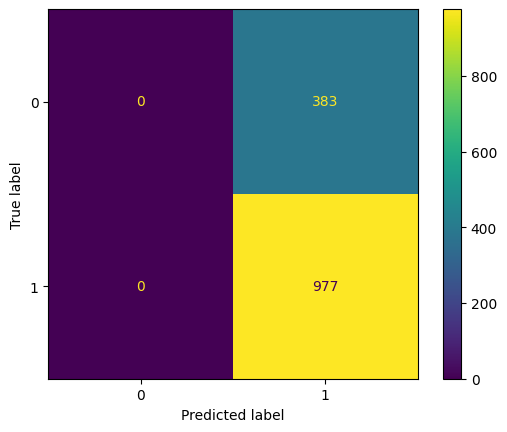

In [165]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

In [166]:
results_svc1 = pd.DataFrame(results_list1_svc)
print(results_svc1)

    accuracy_train  accuracy_test  precision_train  precision_test  \
0         0.697982       0.718382         0.697982        0.718382   
1         0.763241       0.778676         0.753202        0.772581   
2         0.697982       0.718382         0.697982        0.718382   
3         0.755044       0.772059         0.745641        0.763636   
4         0.697982       0.718382         0.697982        0.718382   
5         0.697982       0.718382         0.697982        0.718382   
6         0.772699       0.780147         0.761288        0.773387   
7         0.697982       0.718382         0.697982        0.718382   
8         0.766393       0.772794         0.755286        0.765924   
9         0.697982       0.718382         0.697982        0.718382   
10        0.697982       0.718382         0.697982        0.718382   
11        0.753468       0.771324         0.745205        0.763867   
12        0.697982       0.718382         0.697982        0.718382   
13        0.739596  

Podľa výsledkov po prvom testovani svc môžeme vidieť, že najlepší výsledok mal dataset s ošetrenými outliermi s ngram a s ošetrenými outliermi so skalovanim s ngram. Takže je zrejme, že najväčší vplyv na úspešnosť malo ošetrenie outlierov a pridanie textovej reprezentácie n-gram. Aj ked sme použili všetký dáta, tak model nevyzerá byť pretrénovaný, kedže trénovacie accuracy nie je priveľmi vysoké oproti trénovacému accuracy.

RANDOM FOREST - bez ošetrenia outlierov a skalovania

In [167]:
results_list1_rf=[]#na ukladanie trenovacej a testovacej accuracy

Trenovanie modelu na trenovacich datach

In [168]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

RandomForestClassifier()

Predikovanie na trenovacich datach

In [169]:
y_pred_train = rf_model.predict(X_train)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9996847414880202
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



Predikovanie na testovacich datach

In [170]:
y_pred = rf_model.predict(X_test)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7639705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.66      0.33      0.44       383
           1       0.78      0.93      0.85       977

    accuracy                           0.76      1360
   macro avg       0.72      0.63      0.65      1360
weighted avg       0.75      0.76      0.73      1360



In [171]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })


Zobrazenie metrik

In [172]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.76
Recall: 0.93
Precision: 0.78
F1 Score: 0.85


Vizualizácia výkonnosti modelu

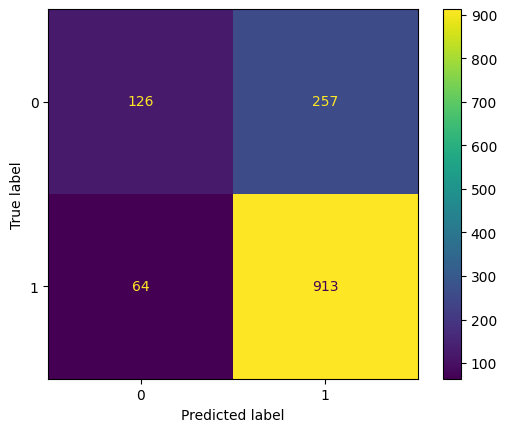

In [173]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - bez ošetrenia outlierov a skalovania a ngram

In [174]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined, y_train)

RandomForestClassifier()

In [175]:
y_pred_train = rf_model.predict(X_train_combined)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [176]:
y_pred = rf_model.predict(X_test_combined)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8514705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.56      0.68       383
           1       0.85      0.97      0.90       977

    accuracy                           0.85      1360
   macro avg       0.86      0.76      0.79      1360
weighted avg       0.85      0.85      0.84      1360



In [177]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [178]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.97
Precision: 0.85
F1 Score: 0.90


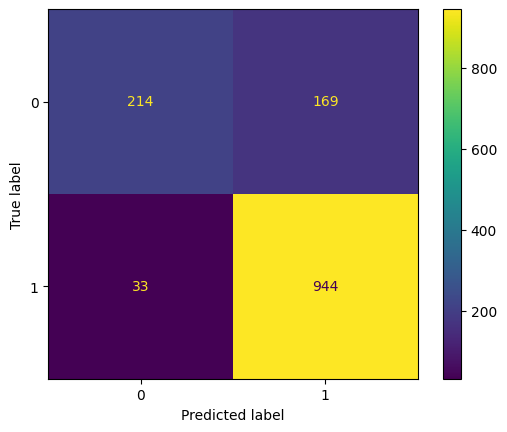

In [179]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - bez ošetrenia outlierov a skalovania a tfidf ngram

In [180]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2, y_train)

RandomForestClassifier()

In [181]:
y_pred_train = rf_model.predict(X_train_combined2)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [182]:
y_pred = rf_model.predict(X_test_combined2)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8580882352941176
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.59      0.70       383
           1       0.86      0.96      0.91       977

    accuracy                           0.86      1360
   macro avg       0.86      0.78      0.80      1360
weighted avg       0.86      0.86      0.85      1360



In [183]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [184]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.96
Precision: 0.86
F1 Score: 0.91


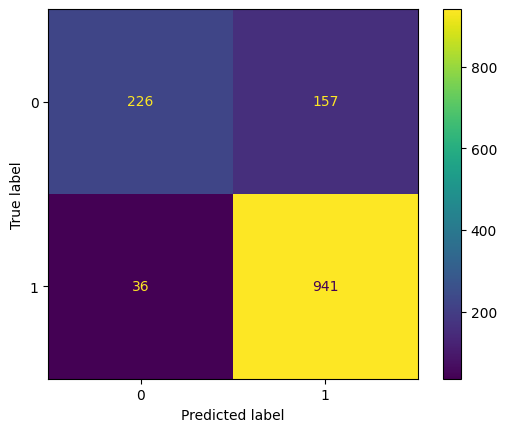

In [185]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - bez ošetrenia outlierov a skalovania a word frequency

In [186]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3, y_train)

RandomForestClassifier()

In [187]:
y_pred_train = rf_model.predict(X_train_combined3)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [188]:
y_pred = rf_model.predict(X_test_combined3)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8492647058823529
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.57      0.68       383
           1       0.85      0.96      0.90       977

    accuracy                           0.85      1360
   macro avg       0.85      0.76      0.79      1360
weighted avg       0.85      0.85      0.84      1360



In [189]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [190]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.96
Precision: 0.85
F1 Score: 0.90


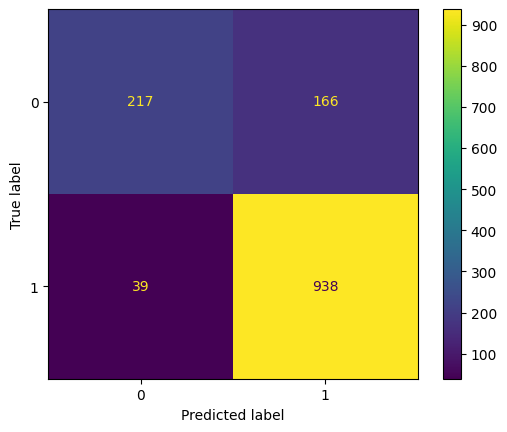

In [191]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - bez ošetrenia outlierov a skalovania a tfidf word frequency

In [192]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4, y_train)

RandomForestClassifier()

In [193]:
y_pred_train = rf_model.predict(X_train_combined4)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [194]:
y_pred = rf_model.predict(X_test_combined4)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8573529411764705
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.59      0.70       383
           1       0.86      0.96      0.91       977

    accuracy                           0.86      1360
   macro avg       0.86      0.78      0.80      1360
weighted avg       0.86      0.86      0.85      1360



In [195]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [196]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.96
Precision: 0.86
F1 Score: 0.91


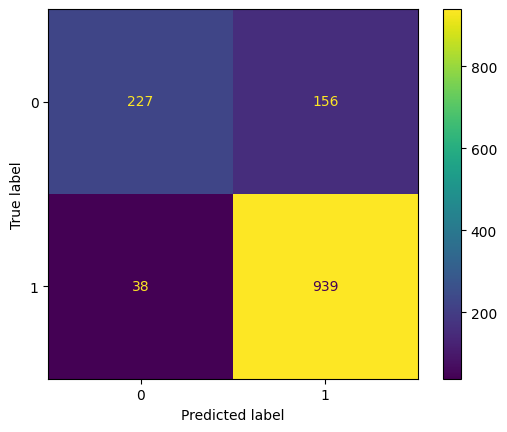

In [197]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrenim outlierov

In [198]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_out, y_train)

RandomForestClassifier()

In [199]:
y_pred_train = rf_model.predict(X_train_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [200]:
y_pred = rf_model.predict(X_test_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9139705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.76      0.83       383
           1       0.91      0.98      0.94       977

    accuracy                           0.91      1360
   macro avg       0.92      0.87      0.89      1360
weighted avg       0.91      0.91      0.91      1360



In [201]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [202]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.91
Recall: 0.98
Precision: 0.91
F1 Score: 0.94


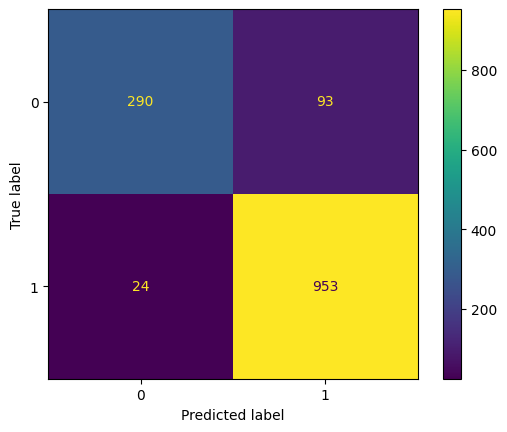

In [203]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrenim outlierov a ngram

In [204]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined_out, y_train)

RandomForestClassifier()

In [205]:
y_pred_train = rf_model.predict(X_train_combined_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [206]:
y_pred = rf_model.predict(X_test_combined_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8860294117647058
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.66      0.76       383
           1       0.88      0.98      0.92       977

    accuracy                           0.89      1360
   macro avg       0.90      0.82      0.84      1360
weighted avg       0.89      0.89      0.88      1360



In [207]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [208]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.89
Recall: 0.98
Precision: 0.88
F1 Score: 0.92


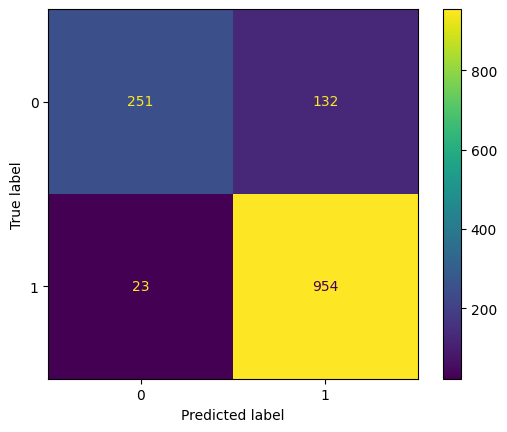

In [209]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrenim outlierov a tfidf ngram

In [210]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2_out, y_train)

RandomForestClassifier()

In [211]:
y_pred_train = rf_model.predict(X_train_combined2_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [212]:
y_pred = rf_model.predict(X_test_combined2_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8948529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.69      0.79       383
           1       0.89      0.97      0.93       977

    accuracy                           0.89      1360
   macro avg       0.90      0.83      0.86      1360
weighted avg       0.90      0.89      0.89      1360



In [213]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [214]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.89
Recall: 0.97
Precision: 0.89
F1 Score: 0.93


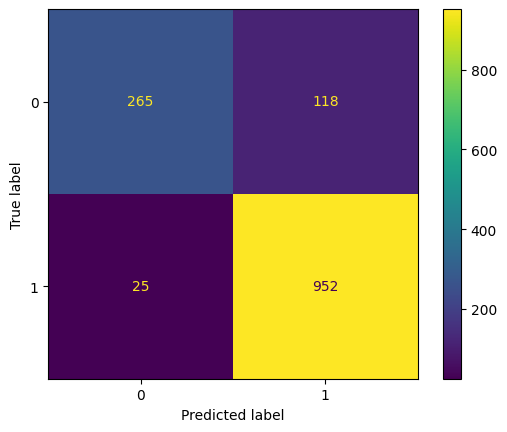

In [215]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrenim outlierov a word frequency

In [216]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3_out, y_train)

RandomForestClassifier()

In [217]:
y_pred_train = rf_model.predict(X_train_combined3_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [218]:
y_pred = rf_model.predict(X_test_combined3_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9147058823529411
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.74      0.83       383
           1       0.91      0.98      0.94       977

    accuracy                           0.91      1360
   macro avg       0.93      0.86      0.89      1360
weighted avg       0.92      0.91      0.91      1360



In [219]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [220]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.91
Recall: 0.98
Precision: 0.91
F1 Score: 0.94


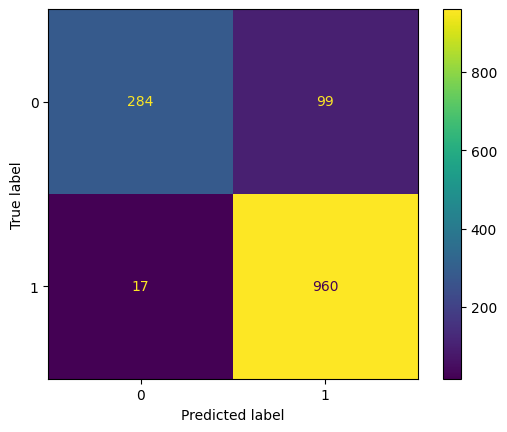

In [221]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrenim outlierov a tfidf word frequency

In [222]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4_out, y_train)

RandomForestClassifier()

In [223]:
y_pred_train = rf_model.predict(X_train_combined4_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [224]:
y_pred = rf_model.predict(X_test_combined4_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9117647058823529
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.73      0.82       383
           1       0.90      0.98      0.94       977

    accuracy                           0.91      1360
   macro avg       0.92      0.86      0.88      1360
weighted avg       0.91      0.91      0.91      1360



In [225]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [226]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.91
Recall: 0.98
Precision: 0.90
F1 Score: 0.94


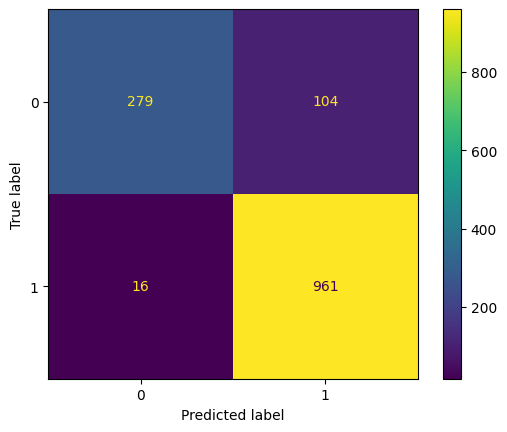

In [227]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - so skalovanim

In [228]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_scaled, y_train)

RandomForestClassifier()

In [229]:
y_pred_train = rf_model.predict(X_train_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [230]:
y_pred = rf_model.predict(X_test_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.774264705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.70      0.34      0.46       383
           1       0.79      0.94      0.86       977

    accuracy                           0.77      1360
   macro avg       0.74      0.64      0.66      1360
weighted avg       0.76      0.77      0.75      1360



In [231]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [232]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.77
Recall: 0.94
Precision: 0.79
F1 Score: 0.86


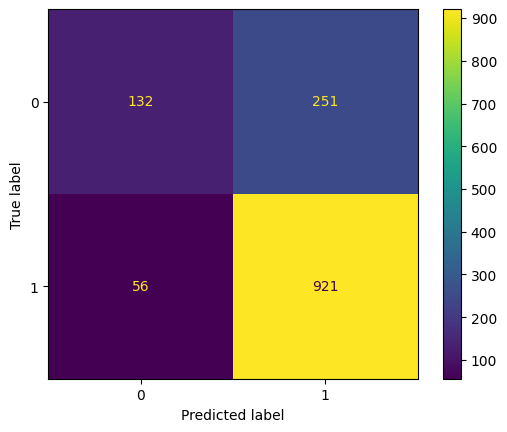

In [233]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - so skalovanim a ngram

In [234]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined_scaled, y_train)

RandomForestClassifier()

In [235]:
y_pred_train = rf_model.predict(X_train_combined_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [236]:
y_pred = rf_model.predict(X_test_combined_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8647058823529412
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.60      0.72       383
           1       0.86      0.97      0.91       977

    accuracy                           0.86      1360
   macro avg       0.87      0.79      0.81      1360
weighted avg       0.87      0.86      0.86      1360



In [237]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [238]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.97
Precision: 0.86
F1 Score: 0.91


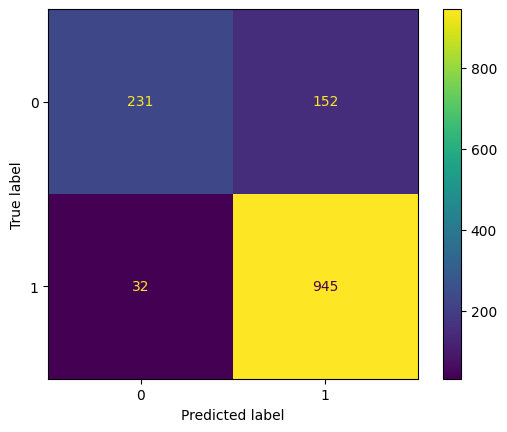

In [239]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - so skalovanim a tfidf ngram

In [240]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2_scaled, y_train)

RandomForestClassifier()

In [241]:
y_pred_train = rf_model.predict(X_train_combined2_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [242]:
y_pred = rf_model.predict(X_test_combined2_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8625
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.60      0.71       383
           1       0.86      0.97      0.91       977

    accuracy                           0.86      1360
   macro avg       0.87      0.78      0.81      1360
weighted avg       0.86      0.86      0.85      1360



In [243]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [244]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.97
Precision: 0.86
F1 Score: 0.91


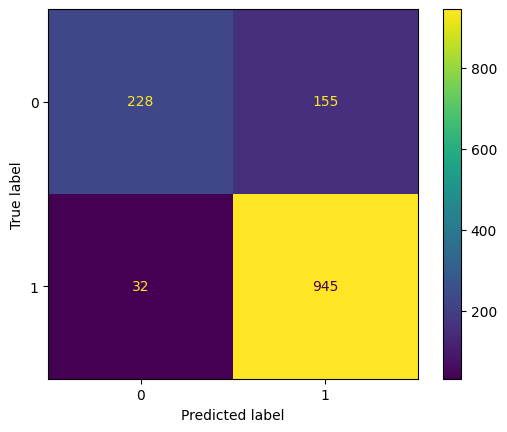

In [245]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - so skalovanim a word frequency

In [246]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3_scaled, y_train)

RandomForestClassifier()

In [247]:
y_pred_train = rf_model.predict(X_train_combined3_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [248]:
y_pred = rf_model.predict(X_test_combined3_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8485294117647059
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.56      0.68       383
           1       0.85      0.96      0.90       977

    accuracy                           0.85      1360
   macro avg       0.85      0.76      0.79      1360
weighted avg       0.85      0.85      0.84      1360



In [249]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [250]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.96
Precision: 0.85
F1 Score: 0.90


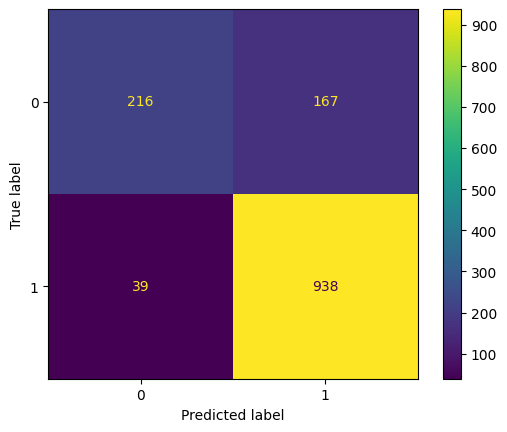

In [251]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - so skalovanim a tfidf word frequency

In [252]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4_scaled, y_train)

RandomForestClassifier()

In [253]:
y_pred_train = rf_model.predict(X_train_combined4_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [254]:
y_pred = rf_model.predict(X_test_combined4_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8639705882352942
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.59      0.71       383
           1       0.86      0.97      0.91       977

    accuracy                           0.86      1360
   macro avg       0.87      0.78      0.81      1360
weighted avg       0.87      0.86      0.85      1360



In [255]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [256]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.97
Precision: 0.86
F1 Score: 0.91


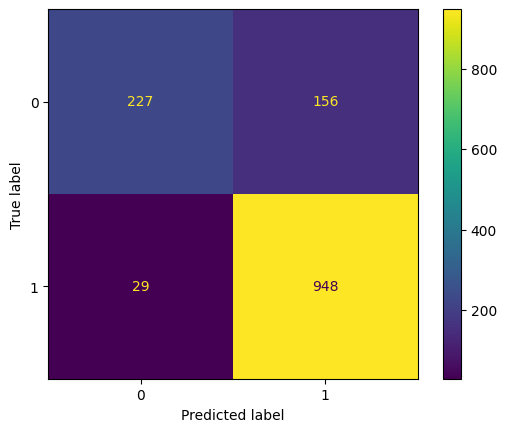

In [257]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrením outlierov a skalovanim

In [258]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_scal_out, y_train)

RandomForestClassifier()

In [259]:
y_pred_train = rf_model.predict(X_train_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [260]:
y_pred = rf_model.predict(X_test_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9102941176470588
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.76      0.83       383
           1       0.91      0.97      0.94       977

    accuracy                           0.91      1360
   macro avg       0.91      0.86      0.88      1360
weighted avg       0.91      0.91      0.91      1360



In [261]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [262]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.91
Recall: 0.97
Precision: 0.91
F1 Score: 0.94


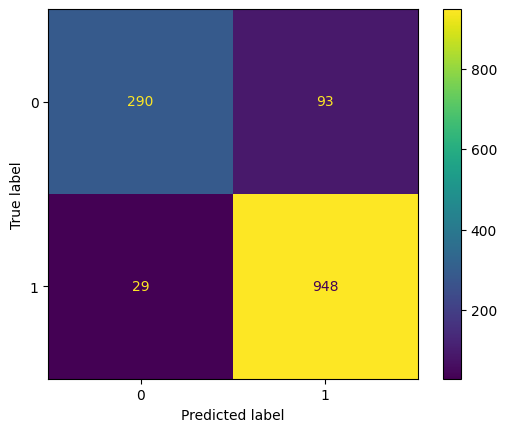

In [263]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrením outlierov a skalovanim a ngram

In [264]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined_scal_out, y_train)

RandomForestClassifier()

In [265]:
y_pred_train = rf_model.predict(X_train_combined_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [266]:
y_pred = rf_model.predict(X_test_combined_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8919117647058824
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.67      0.78       383
           1       0.88      0.98      0.93       977

    accuracy                           0.89      1360
   macro avg       0.91      0.82      0.85      1360
weighted avg       0.90      0.89      0.89      1360



In [267]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [268]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.89
Recall: 0.98
Precision: 0.88
F1 Score: 0.93


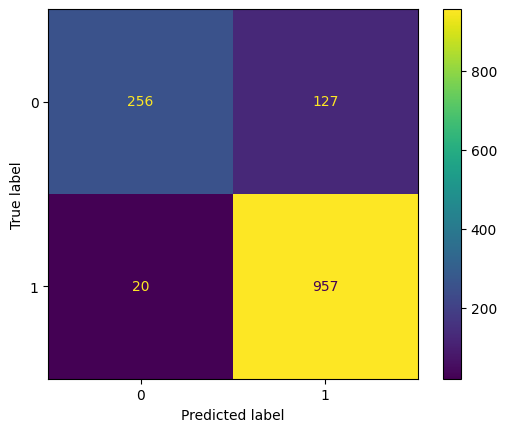

In [269]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrením outlierov a skalovanim a tfidf ngram

In [270]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2_scal_out, y_train)

RandomForestClassifier()

In [271]:
y_pred_train = rf_model.predict(X_train_combined2_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [272]:
y_pred = rf_model.predict(X_test_combined2_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9036764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.71      0.81       383
           1       0.90      0.98      0.94       977

    accuracy                           0.90      1360
   macro avg       0.91      0.85      0.87      1360
weighted avg       0.91      0.90      0.90      1360



In [273]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [274]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.98
Precision: 0.90
F1 Score: 0.94


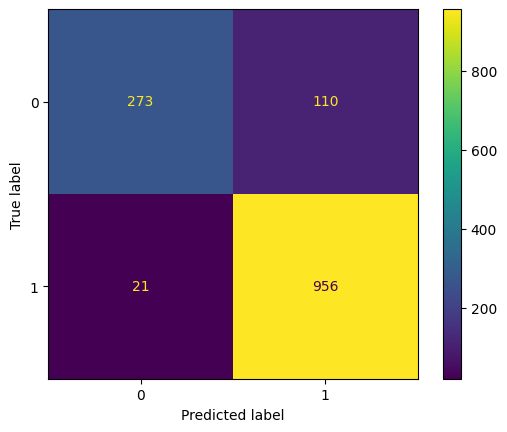

In [275]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrením outlierov a skalovanim a word frequency

In [276]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3_scal_out, y_train)

RandomForestClassifier()

In [277]:
y_pred_train = rf_model.predict(X_train_combined3_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [278]:
y_pred = rf_model.predict(X_test_combined3_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9183823529411764
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.76      0.84       383
           1       0.91      0.98      0.95       977

    accuracy                           0.92      1360
   macro avg       0.93      0.87      0.89      1360
weighted avg       0.92      0.92      0.92      1360



In [279]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [280]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.92
Recall: 0.98
Precision: 0.91
F1 Score: 0.95


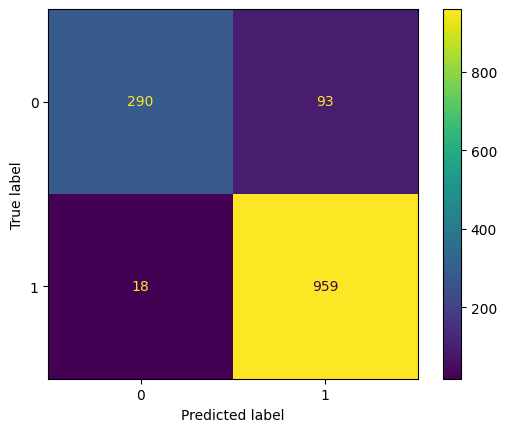

In [281]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrením outlierov a skalovanim a tfidf word frequency

In [282]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4_scal_out, y_train)

RandomForestClassifier()

In [283]:
y_pred_train = rf_model.predict(X_train_combined4_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [284]:
y_pred = rf_model.predict(X_test_combined4_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9110294117647059
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.73      0.82       383
           1       0.90      0.98      0.94       977

    accuracy                           0.91      1360
   macro avg       0.92      0.86      0.88      1360
weighted avg       0.91      0.91      0.91      1360



In [285]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [286]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.91
Recall: 0.98
Precision: 0.90
F1 Score: 0.94


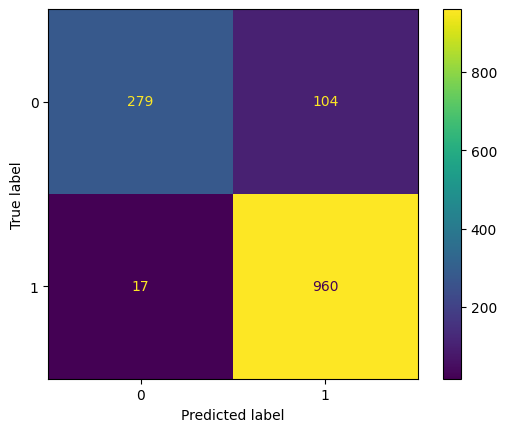

In [287]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

In [288]:
results_rf1 = pd.DataFrame(results_list1_rf)
print(results_rf1)

    accuracy_train  accuracy_test  precision_train  precision_test  \
0         0.999685       0.763971         0.999549        0.780342   
1         1.000000       0.851471         1.000000        0.848158   
2         1.000000       0.858088         1.000000        0.857013   
3         1.000000       0.849265         1.000000        0.849638   
4         1.000000       0.857353         1.000000        0.857534   
5         1.000000       0.913971         1.000000        0.911090   
6         1.000000       0.886029         1.000000        0.878453   
7         1.000000       0.894853         1.000000        0.889720   
8         1.000000       0.914706         1.000000        0.906516   
9         1.000000       0.911765         1.000000        0.902347   
10        1.000000       0.774265         1.000000        0.785836   
11        1.000000       0.864706         1.000000        0.861440   
12        1.000000       0.862500         1.000000        0.859091   
13        1.000000  

Podľa výsledkov po prvom testovani random forest môžeme vidieť, že najlepší výsledok mal dataset s ošetrenými outliermi a skalovaním s word frequency. Takže je zrejme, že najväčší vplyv na úspešnosť malo ošetrenie outlierov a pridanie textovej reprezentácie. Ked si porovnáme accuracy pri trenovacom a testovacom datasete je zrejme, že model sa pretrénoval, však toto je celkom bežné pri stromových algoritmoch a treba to ošetriť hyperparametrami. Zatiaľ tento model vykazuje vyššiu presnoť ako svc.

GRADIENT BOOSTING CLASSIFIER - bez ošetrenia outlierov a skalovania

In [289]:
results_list1_gbm=[]

Trenovanie modelu

In [290]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train, y_train)

GradientBoostingClassifier()

Predikovanie na trenovacich datach

In [291]:
y_pred_train = gbm_model.predict(X_train)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8619167717528373
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.62      0.73       958
           1       0.86      0.97      0.91      2214

    accuracy                           0.86      3172
   macro avg       0.87      0.79      0.82      3172
weighted avg       0.86      0.86      0.85      3172



Predikovanie na testovacich datach

In [292]:
y_pred = gbm_model.predict(X_test)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7764705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.66      0.43      0.52       383
           1       0.80      0.91      0.85       977

    accuracy                           0.78      1360
   macro avg       0.73      0.67      0.69      1360
weighted avg       0.76      0.78      0.76      1360



In [293]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

Zobrazenie metrik

In [294]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.78
Recall: 0.91
Precision: 0.80
F1 Score: 0.85


Vizualizácia výkonnosti modelu

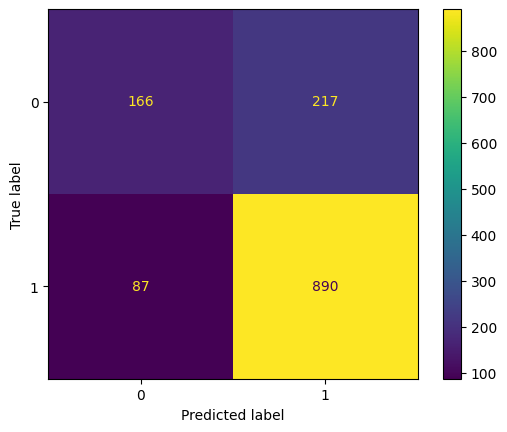

In [295]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - bez ošetrenia outlierov a skalovania a ngram

In [296]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined, y_train)

GradientBoostingClassifier()

In [297]:
y_pred_train = gbm_model.predict(X_train_combined)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.969735182849937
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.93      0.95       958
           1       0.97      0.99      0.98      2214

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [298]:
y_pred = gbm_model.predict(X_test_combined)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8985294117647059
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.78      0.81       383
           1       0.92      0.94      0.93       977

    accuracy                           0.90      1360
   macro avg       0.88      0.86      0.87      1360
weighted avg       0.90      0.90      0.90      1360



In [299]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [300]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.94
Precision: 0.92
F1 Score: 0.93


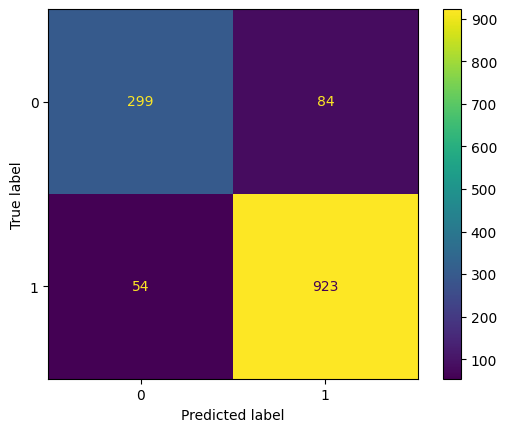

In [301]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()


GRADIENT BOOSTING CLASSIFIER - bez ošetrenia outlierov a skalovania a tfidf ngram

In [302]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2, y_train)

GradientBoostingClassifier()

In [303]:
y_pred_train = gbm_model.predict(X_train_combined2)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9656368221941992
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.92      0.94       958
           1       0.97      0.98      0.98      2214

    accuracy                           0.97      3172
   macro avg       0.96      0.95      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [304]:
y_pred = gbm_model.predict(X_test_combined2)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8926470588235295
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.84      0.77      0.80       383
           1       0.91      0.94      0.93       977

    accuracy                           0.89      1360
   macro avg       0.87      0.85      0.86      1360
weighted avg       0.89      0.89      0.89      1360



In [305]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [306]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.89
Recall: 0.94
Precision: 0.91
F1 Score: 0.93


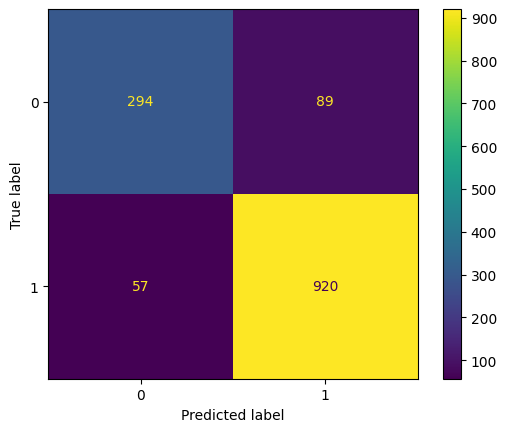

In [307]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - bez ošetrenia outlierov a skalovania a word frequency

In [308]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3, y_train)

GradientBoostingClassifier()

In [309]:
y_pred_train = gbm_model.predict(X_train_combined3)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9627994955863808
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.92      0.94       958
           1       0.96      0.98      0.97      2214

    accuracy                           0.96      3172
   macro avg       0.96      0.95      0.96      3172
weighted avg       0.96      0.96      0.96      3172



In [310]:
y_pred = gbm_model.predict(X_test_combined3)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8794117647058823
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.74      0.78       383
           1       0.90      0.93      0.92       977

    accuracy                           0.88      1360
   macro avg       0.86      0.84      0.85      1360
weighted avg       0.88      0.88      0.88      1360



In [311]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [312]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.88
Recall: 0.93
Precision: 0.90
F1 Score: 0.92


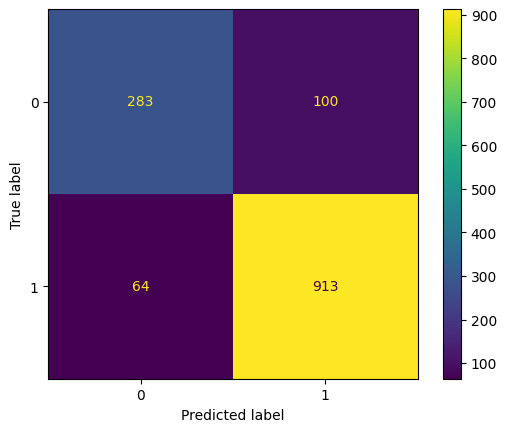

In [313]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - bez ošetrenia outlierov a skalovania a word frequency

In [314]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4, y_train)

GradientBoostingClassifier()

In [315]:
y_pred_train = gbm_model.predict(X_train_combined4)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9659520807061791
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.92      0.94       958
           1       0.97      0.99      0.98      2214

    accuracy                           0.97      3172
   macro avg       0.97      0.95      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [316]:
y_pred = gbm_model.predict(X_test_combined4)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8904411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.84      0.76      0.80       383
           1       0.91      0.94      0.93       977

    accuracy                           0.89      1360
   macro avg       0.87      0.85      0.86      1360
weighted avg       0.89      0.89      0.89      1360



In [317]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [318]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.89
Recall: 0.94
Precision: 0.91
F1 Score: 0.93


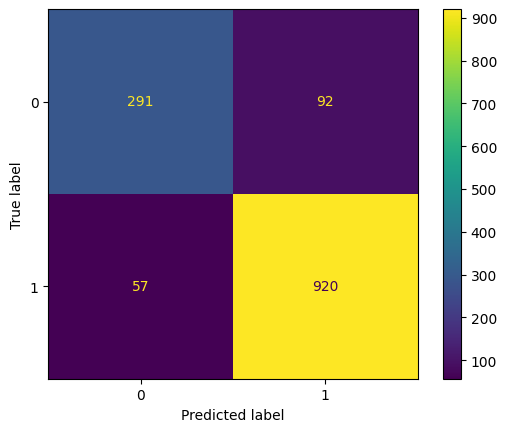

In [319]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov

In [320]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_out, y_train)

GradientBoostingClassifier()

In [321]:
y_pred_train = gbm_model.predict(X_train_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.969735182849937
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.92      0.95       958
           1       0.97      0.99      0.98      2214

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [322]:
y_pred = gbm_model.predict(X_test_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9367647058823529
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.84      0.88       383
           1       0.94      0.97      0.96       977

    accuracy                           0.94      1360
   macro avg       0.93      0.91      0.92      1360
weighted avg       0.94      0.94      0.94      1360



In [323]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [324]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.94
Recall: 0.97
Precision: 0.94
F1 Score: 0.96


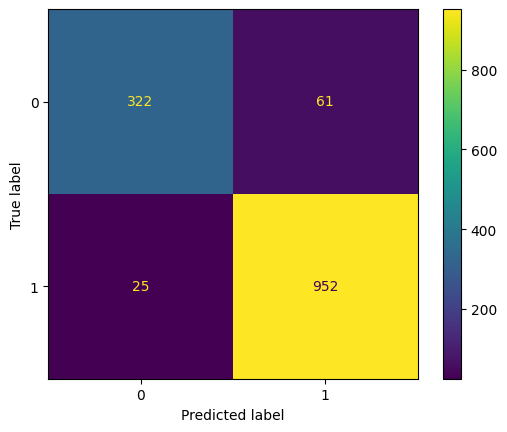

In [325]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a ngram

In [326]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined_out, y_train)

GradientBoostingClassifier()

In [327]:
y_pred_train = gbm_model.predict(X_train_combined_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9990542244640606
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [328]:
y_pred = gbm_model.predict(X_test_combined_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9625
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93       383
           1       0.96      0.99      0.97       977

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [329]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [330]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.99
Precision: 0.96
F1 Score: 0.97


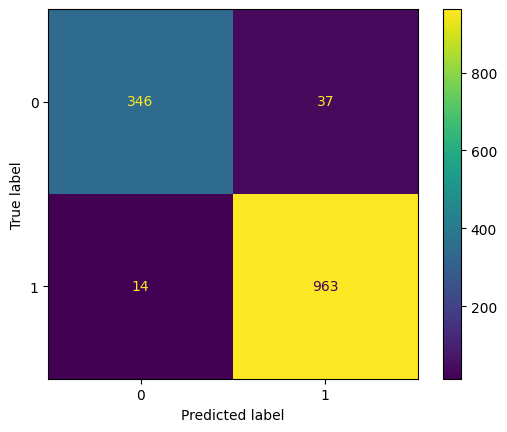

In [331]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a tfidf ngram

In [332]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2_out, y_train)

GradientBoostingClassifier()

In [333]:
y_pred_train = gbm_model.predict(X_train_combined2_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9955863808322825
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       958
           1       0.99      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      0.99      0.99      3172
weighted avg       1.00      1.00      1.00      3172



In [334]:
y_pred = gbm_model.predict(X_test_combined2_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9536764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.89      0.91       383
           1       0.96      0.98      0.97       977

    accuracy                           0.95      1360
   macro avg       0.95      0.93      0.94      1360
weighted avg       0.95      0.95      0.95      1360



In [335]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [336]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.95
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


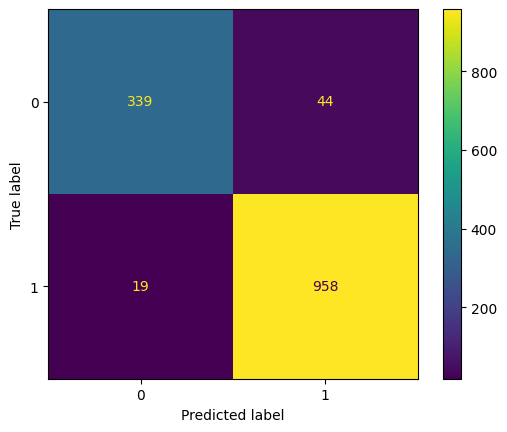

In [337]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a word frequency

In [338]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3_out, y_train)

GradientBoostingClassifier()

In [339]:
y_pred_train = gbm_model.predict(X_train_combined3_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9949558638083228
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       958
           1       0.99      1.00      1.00      2214

    accuracy                           0.99      3172
   macro avg       1.00      0.99      0.99      3172
weighted avg       0.99      0.99      0.99      3172



In [340]:
y_pred = gbm_model.predict(X_test_combined3_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9602941176470589
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.90      0.93       383
           1       0.96      0.98      0.97       977

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [341]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [342]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


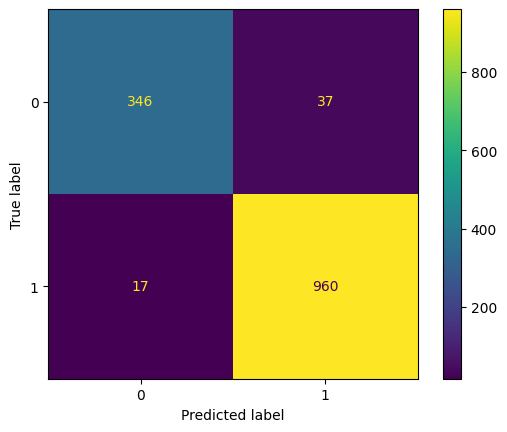

In [343]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a tfidf word frequency

In [344]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4_out, y_train)

GradientBoostingClassifier()

In [345]:
y_pred_train = gbm_model.predict(X_train_combined4_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9968474148802018
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [346]:
y_pred = gbm_model.predict(X_test_combined4_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9551470588235295
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.89      0.92       383
           1       0.96      0.98      0.97       977

    accuracy                           0.96      1360
   macro avg       0.95      0.94      0.94      1360
weighted avg       0.95      0.96      0.95      1360



In [347]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [348]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


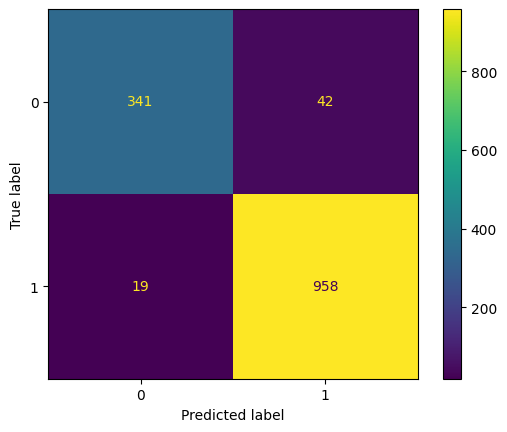

In [349]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim

In [350]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_scaled, y_train)

GradientBoostingClassifier()

In [351]:
y_pred_train = gbm_model.predict(X_train_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8619167717528373
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.62      0.73       958
           1       0.86      0.97      0.91      2214

    accuracy                           0.86      3172
   macro avg       0.87      0.79      0.82      3172
weighted avg       0.86      0.86      0.85      3172



In [352]:
y_pred = gbm_model.predict(X_test_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.774264705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.65      0.43      0.52       383
           1       0.80      0.91      0.85       977

    accuracy                           0.77      1360
   macro avg       0.73      0.67      0.69      1360
weighted avg       0.76      0.77      0.76      1360



In [353]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [354]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.77
Recall: 0.91
Precision: 0.80
F1 Score: 0.85


GRADIENT BOOSTING CLASSIFIER - so skalovanim a ngram

In [355]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined_scaled, y_train)

GradientBoostingClassifier()

In [356]:
y_pred_train = gbm_model.predict(X_train_combined_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.969735182849937
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.93      0.95       958
           1       0.97      0.99      0.98      2214

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [357]:
y_pred = gbm_model.predict(X_test_combined_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.78      0.81       383
           1       0.92      0.95      0.93       977

    accuracy                           0.90      1360
   macro avg       0.88      0.86      0.87      1360
weighted avg       0.90      0.90      0.90      1360



In [358]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [359]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.95
Precision: 0.92
F1 Score: 0.93


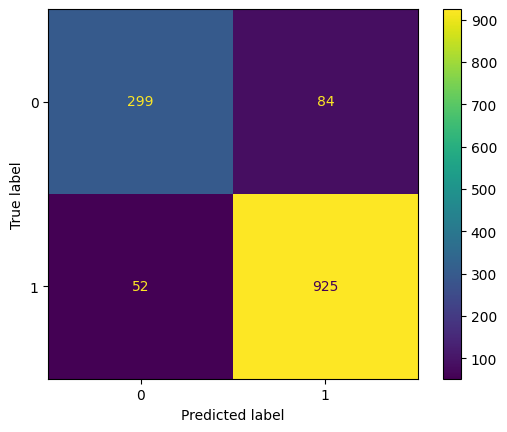

In [360]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim a tfidf ngram

In [361]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2_scaled, y_train)

GradientBoostingClassifier()

In [362]:
y_pred_train = gbm_model.predict(X_train_combined2_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9656368221941992
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.92      0.94       958
           1       0.97      0.98      0.98      2214

    accuracy                           0.97      3172
   macro avg       0.96      0.95      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [363]:
y_pred = gbm_model.predict(X_test_combined2_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8926470588235295
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.84      0.77      0.80       383
           1       0.91      0.94      0.93       977

    accuracy                           0.89      1360
   macro avg       0.87      0.85      0.86      1360
weighted avg       0.89      0.89      0.89      1360



In [364]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [365]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.89
Recall: 0.94
Precision: 0.91
F1 Score: 0.93


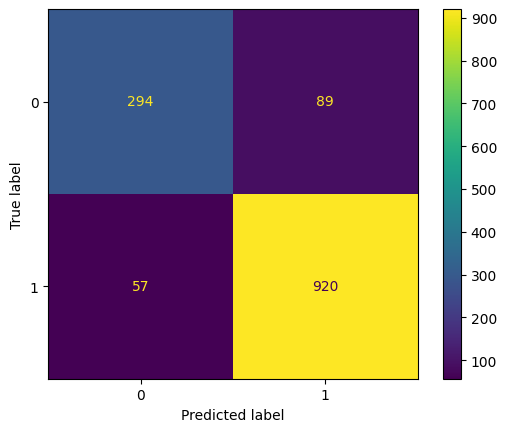

In [366]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim a word frequency

In [367]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3_scaled, y_train)

GradientBoostingClassifier()

In [368]:
y_pred_train = gbm_model.predict(X_train_combined3_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9627994955863808
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.92      0.94       958
           1       0.96      0.98      0.97      2214

    accuracy                           0.96      3172
   macro avg       0.96      0.95      0.96      3172
weighted avg       0.96      0.96      0.96      3172



In [369]:
y_pred = gbm_model.predict(X_test_combined3_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8786764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.74      0.77       383
           1       0.90      0.93      0.92       977

    accuracy                           0.88      1360
   macro avg       0.86      0.84      0.85      1360
weighted avg       0.88      0.88      0.88      1360



In [370]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [371]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.88
Recall: 0.93
Precision: 0.90
F1 Score: 0.92


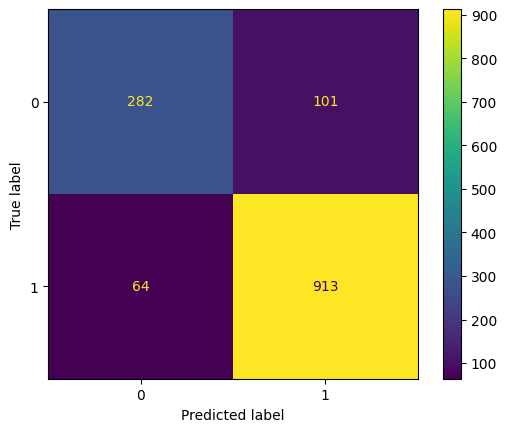

In [372]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim a tfidf word frequency

In [373]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4_scaled, y_train)

GradientBoostingClassifier()

In [374]:
y_pred_train = gbm_model.predict(X_train_combined4_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9659520807061791
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.92      0.94       958
           1       0.97      0.99      0.98      2214

    accuracy                           0.97      3172
   macro avg       0.97      0.95      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [375]:
y_pred = gbm_model.predict(X_test_combined4_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8904411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.84      0.76      0.80       383
           1       0.91      0.94      0.93       977

    accuracy                           0.89      1360
   macro avg       0.87      0.85      0.86      1360
weighted avg       0.89      0.89      0.89      1360



In [376]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [377]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.89
Recall: 0.94
Precision: 0.91
F1 Score: 0.93


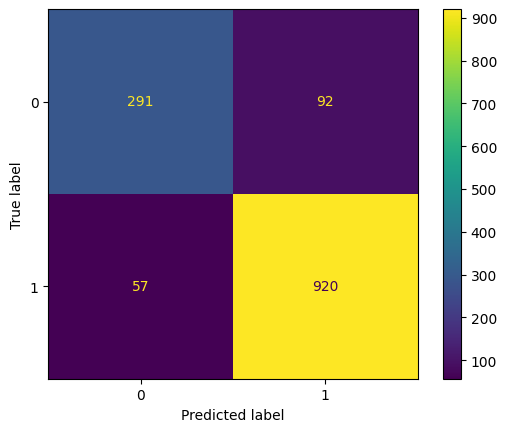

In [378]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a skalovanim

In [379]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_scal_out, y_train)

GradientBoostingClassifier()

In [380]:
y_pred_train = gbm_model.predict(X_train_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.969735182849937
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.92      0.95       958
           1       0.97      0.99      0.98      2214

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [381]:
y_pred = gbm_model.predict(X_test_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9367647058823529
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.84      0.88       383
           1       0.94      0.97      0.96       977

    accuracy                           0.94      1360
   macro avg       0.93      0.91      0.92      1360
weighted avg       0.94      0.94      0.94      1360



In [382]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [383]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.94
Recall: 0.97
Precision: 0.94
F1 Score: 0.96


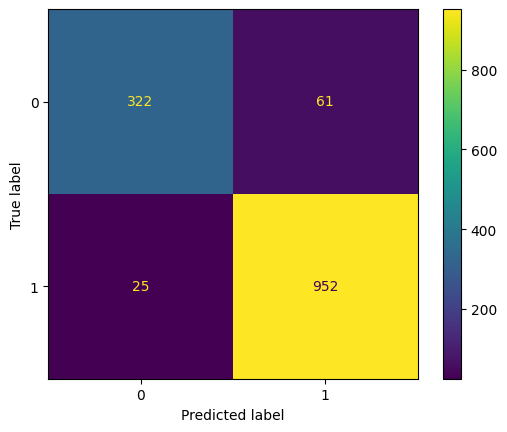

In [384]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a skalovanim a ngram

In [385]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined_scal_out, y_train)

GradientBoostingClassifier()

In [386]:
y_pred_train = gbm_model.predict(X_train_combined_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9990542244640606
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [387]:
y_pred = gbm_model.predict(X_test_combined_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9625
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93       383
           1       0.96      0.99      0.97       977

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [388]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [389]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.99
Precision: 0.96
F1 Score: 0.97


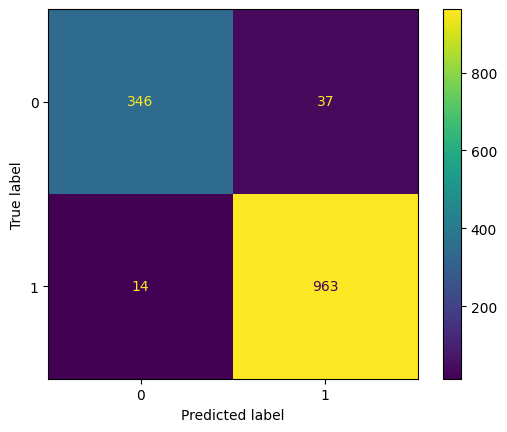

In [390]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a skalovanim a tfidf ngram

In [391]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2_scal_out, y_train)

GradientBoostingClassifier()

In [392]:
y_pred_train = gbm_model.predict(X_train_combined2_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9955863808322825
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       958
           1       0.99      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      0.99      0.99      3172
weighted avg       1.00      1.00      1.00      3172



In [393]:
y_pred = gbm_model.predict(X_test_combined2_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9536764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.89      0.91       383
           1       0.96      0.98      0.97       977

    accuracy                           0.95      1360
   macro avg       0.95      0.93      0.94      1360
weighted avg       0.95      0.95      0.95      1360



In [394]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [395]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.95
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


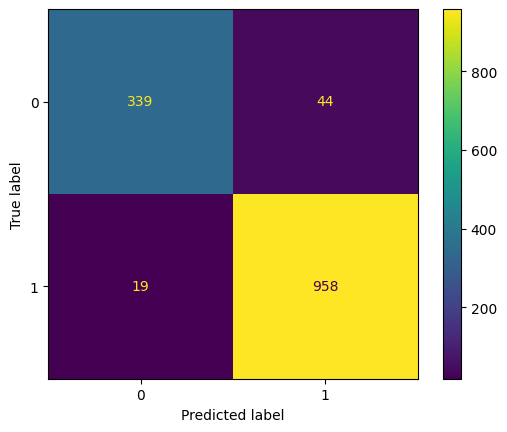

In [396]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a skalovanim a word frequency

In [397]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3_scal_out, y_train)

GradientBoostingClassifier()

In [398]:
y_pred_train = gbm_model.predict(X_train_combined3_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9949558638083228
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       958
           1       0.99      1.00      1.00      2214

    accuracy                           0.99      3172
   macro avg       1.00      0.99      0.99      3172
weighted avg       0.99      0.99      0.99      3172



In [399]:
y_pred = gbm_model.predict(X_test_combined3_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9602941176470589
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.90      0.93       383
           1       0.96      0.98      0.97       977

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [400]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [401]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


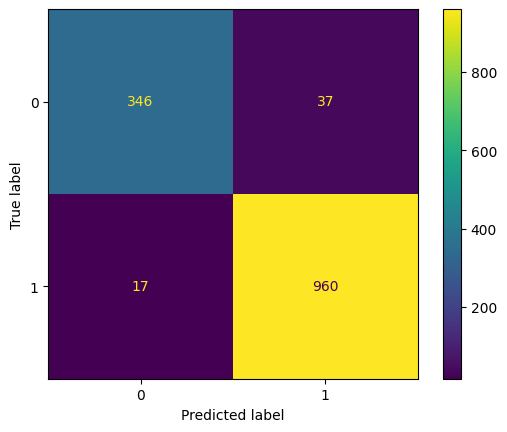

In [402]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a skalovanim a tfidf word frequency

In [403]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4_scal_out, y_train)

GradientBoostingClassifier()

In [404]:
y_pred_train = gbm_model.predict(X_train_combined4_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9968474148802018
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [405]:
y_pred = gbm_model.predict(X_test_combined4_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9551470588235295
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.89      0.92       383
           1       0.96      0.98      0.97       977

    accuracy                           0.96      1360
   macro avg       0.95      0.94      0.94      1360
weighted avg       0.95      0.96      0.95      1360



In [406]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [407]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


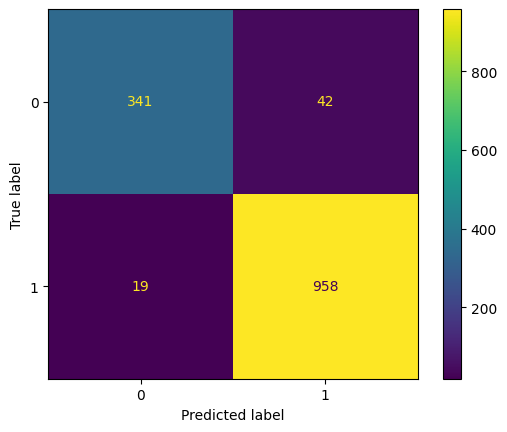

In [408]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

In [409]:
results_gbm1 = pd.DataFrame(results_list1_gbm)
print(results_gbm1)

    accuracy_train  accuracy_test  precision_train  precision_test  \
0         0.861917       0.776471         0.855484        0.803975   
1         0.969735       0.898529         0.971925        0.916584   
2         0.965637       0.892647         0.966741        0.911794   
3         0.962799       0.879412         0.964539        0.901283   
4         0.965952       0.890441         0.966755        0.909091   
5         0.969735       0.936765         0.967756        0.939783   
6         0.999054       0.962500         0.998647        0.963000   
7         0.995586       0.953676         0.994604        0.956088   
8         0.994956       0.960294         0.993711        0.962889   
9         0.996847       0.955147         0.996396        0.958000   
10        0.861917       0.774265         0.855484        0.803442   
11        0.969735       0.900000         0.971925        0.916749   
12        0.965637       0.892647         0.966741        0.911794   
13        0.962799  

Podľa výsledkov po prvom testovani GBM môžeme vidieť, že najlepší výsledok mal dataset s ošetrenými outliermi a s ngramamy a dataset s ošetrenými outliermi a skalovanim a ngarmamy. Takže je zrejme, že najväčší vplyv na úspešnosť malo ošetrenie outlierov a pridanie textovej reprezentácie. Tento model má zatiaľ najvyššiu presnosť.

VYBER CRT

In [410]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3172 entries, 4185 to 1058
Data columns (total 51 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   average_emoji                           3172 non-null   float64
 1   average_urls                            3172 non-null   float64
 2   average_mentions                        3172 non-null   float64
 3   average_hashtags                        3172 non-null   float64
 4   average_digits                          3172 non-null   float64
 5   average_uppercase                       3172 non-null   float64
 6   average_lowercase                       3172 non-null   float64
 7   average_non_alpha                       3172 non-null   float64
 8   average_quotes_per_tweet                3172 non-null   float64
 9   average_apostrophe_per_tweet            3172 non-null   float64
 10  average_punctuation_per_tweet           3172 non-null   float6

WRAPPER METHOD - Vyberajú podmnožiny črt, ktoré dávajú najlepší výkon modelu.

SVC - Recursive feature elimination (RFE)

In [414]:
model = SVC(kernel="linear")

# Vytvorí model RFE (Rekurzívna eliminácia prvkov) s použitím lineárneho modelu SVC
rfe = RFE(estimator=model)  # Inicializuj RFE s lineárnym modelom SVC a urč kroky pre každú iteráciu
selector = rfe.fit(X_train, y_train)  # Prispôsob model RFE

# Predpovedaj pomocou selektora RFE priamo na testovacích údajoch
predictions = selector.predict(X_test)  # Použi selektor na predpovedanie

# Vypočítaj skóre presnosti
accuracy = accuracy_score(y_test, predictions)

# Výstup vybraných prvkov a presnosti
print("Vybrané prvky:", X_train.columns[selector.support_])
print("Skóre presnosti:", accuracy)
X_train_svc = X_train.loc[:, selector.support_].copy()
X_test_svc = X_test.loc[:, selector.support_].copy()

Vybrané prvky: Index(['average_emoji', 'average_urls', 'average_quotes_per_tweet',
       'average_multiple_punctuation_per_tweet', 'average_word_length',
       'avg_words_per_tweet', 'average_repeats_per_tweet',
       'average_adjective_per_tweet', 'average_verb_per_tweet',
       'average_pronoun_per_tweet', 'average_numeral_per_tweet',
       'average_adverb_per_tweet', 'average_particle_per_tweet',
       'average_interjection_per_tweet', 'average_past_tense_per_tweet',
       'average_present_tense_per_tweet', 'avg_nsubj_per_tweet',
       'avg_dobj_per_tweet', 'avg_advmod_per_tweet', 'avg_amod_per_tweet',
       'avg_aux_per_tweet', 'average_negative_per_tweet',
       'average_sentiment_score', 'average_negation_per_tweet',
       'average_cognitive_word_per_tweet'],
      dtype='object')
Skóre presnosti: 0.7522058823529412


SVC - ošetrený outlieri

In [417]:
model = SVC(kernel="linear")

rfe = RFE(estimator=model) 
selector = rfe.fit(X_train_out, y_train) 

predictions = selector.predict(X_test_out) 

accuracy = accuracy_score(y_test, predictions)

print("Vybrané prvky:", X_train_out.columns[selector.support_])
print("Skóre presnosti:", accuracy)
X_train_out_svc = X_train_out.loc[:, selector.support_].copy()
X_test_out_svc = X_test_out.loc[:, selector.support_].copy()

Vybrané prvky: Index(['average_emoji', 'average_urls', 'average_apostrophe_per_tweet',
       'average_word_length', 'average_repeats_per_tweet',
       'other_ending_percent', 'avg_commas', 'average_pronoun_per_tweet',
       'average_numeral_per_tweet', 'average_adverb_per_tweet',
       'average_conjunction_per_tweet', 'average_particle_per_tweet',
       'average_interjection_per_tweet', 'average_past_tense_per_tweet',
       'average_present_tense_per_tweet', 'avg_nsubj_per_tweet',
       'avg_dobj_per_tweet', 'avg_advmod_per_tweet', 'avg_amod_per_tweet',
       'avg_aux_per_tweet', 'average_entities_per_tweet',
       'average_sentiment_score', 'average_negation_per_tweet',
       'average_cognitive_word_per_tweet', 'average_sensory_word_per_tweet'],
      dtype='object')
Skóre presnosti: 0.7786764705882353


SVC-scalovanie

In [418]:
model = SVC(kernel="linear")

rfe = RFE(estimator=model) 
selector = rfe.fit(X_train_scaled, y_train)  

predictions = selector.predict(X_test_scaled)  

accuracy = accuracy_score(y_test, predictions)

print("Vybrané prvky:", X_train_scaled.columns[selector.support_])
print("Skóre presnosti:", accuracy)
X_train_scaled_svc = X_train_scaled.loc[:, selector.support_].copy()
X_test_scaled_svc = X_test_scaled.loc[:, selector.support_].copy()

Vybrané prvky: Index(['average_emoji', 'average_urls', 'average_apostrophe_per_tweet',
       'average_word_length', 'average_repeats_per_tweet',
       'interrogative_percent', 'imperative_percent', 'other_ending_percent',
       'avg_commas', 'average_nouns_per_tweet', 'average_adjective_per_tweet',
       'average_verb_per_tweet', 'average_pronoun_per_tweet',
       'average_numeral_per_tweet', 'average_adverb_per_tweet',
       'average_preposition_per_tweet', 'average_conjunction_per_tweet',
       'average_particle_per_tweet', 'average_interjection_per_tweet',
       'average_present_tense_per_tweet', 'avg_amod_per_tweet',
       'average_entities_per_tweet', 'average_negation_per_tweet',
       'average_cognitive_word_per_tweet', 'average_sensory_word_per_tweet'],
      dtype='object')
Skóre presnosti: 0.7470588235294118


SVC -scalovanie a ošetreny outlieri

In [419]:
model = SVC(kernel="linear")

rfe = RFE(estimator=model) 
selector = rfe.fit(X_train_scal_out, y_train) 

predictions = selector.predict(X_test_scal_out) 

accuracy = accuracy_score(y_test, predictions)

print("Vybrané prvky:", X_train_scal_out.columns[selector.support_])
print("Skóre presnosti:", accuracy)
X_train_scal_out_svc = X_train_scal_out.loc[:, selector.support_].copy()
X_test_scal_out_svc = X_test_scal_out.loc[:, selector.support_].copy()

Vybrané prvky: Index(['average_emoji', 'average_urls', 'average_apostrophe_per_tweet',
       'average_word_length', 'average_repeats_per_tweet',
       'other_ending_percent', 'avg_commas', 'average_pronoun_per_tweet',
       'average_numeral_per_tweet', 'average_adverb_per_tweet',
       'average_conjunction_per_tweet', 'average_particle_per_tweet',
       'average_interjection_per_tweet', 'average_past_tense_per_tweet',
       'average_present_tense_per_tweet', 'avg_nsubj_per_tweet',
       'avg_dobj_per_tweet', 'avg_advmod_per_tweet', 'avg_amod_per_tweet',
       'avg_aux_per_tweet', 'average_entities_per_tweet',
       'average_sentiment_score', 'average_negation_per_tweet',
       'average_cognitive_word_per_tweet', 'average_sensory_word_per_tweet'],
      dtype='object')
Skóre presnosti: 0.7786764705882353


RANDOM FOREST - BEZ OšETRENIA OUTLIEROV A SKALOVANIA

In [420]:
model = RandomForestClassifier()

rfe = RFE(estimator=model) 
selector = rfe.fit(X_train, y_train)

predictions = selector.predict(X_test) 

accuracy = accuracy_score(y_test, predictions)

print("Vybrané prvky:", X_train.columns[selector.support_])
print("Skóre presnosti:", accuracy)
X_train_rf = X_train.loc[:, selector.support_].copy()
X_test_rf = X_test.loc[:, selector.support_].copy()

Vybrané prvky: Index(['average_emoji', 'average_urls', 'average_hashtags', 'average_digits',
       'average_uppercase', 'average_non_alpha',
       'average_punctuation_per_tweet',
       'average_multiple_punctuation_per_tweet', 'average_word_length',
       'average_repeats_per_tweet', 'declarative_percent',
       'imperative_percent', 'other_ending_percent',
       'average_pronoun_per_tweet', 'average_numeral_per_tweet',
       'average_conjunction_per_tweet', 'average_particle_per_tweet',
       'average_interjection_per_tweet', 'average_present_tense_per_tweet',
       'average_negative_per_tweet', 'average_entities_per_tweet',
       'average_sentiment_score', 'average_negation_per_tweet',
       'average_cognitive_word_per_tweet', 'average_sensory_word_per_tweet'],
      dtype='object')
Skóre presnosti: 0.7764705882352941


RANDOM FOREST - S OšETRENIM OUTLIEROV 

In [421]:
model = RandomForestClassifier()

rfe = RFE(estimator=model) 
selector = rfe.fit(X_train_out, y_train) 

predictions = selector.predict(X_test_out) 

accuracy = accuracy_score(y_test, predictions)

print("Vybrané prvky:", X_train_out.columns[selector.support_])
print("Skóre presnosti:", accuracy)
X_train_out_rf = X_train_out.loc[:, selector.support_].copy()
X_test_out_rf = X_test_out.loc[:, selector.support_].copy()

Vybrané prvky: Index(['average_emoji', 'average_urls', 'average_non_alpha',
       'average_word_length', 'average_repeats_per_tweet',
       'declarative_percent', 'interrogative_percent', 'imperative_percent',
       'other_ending_percent', 'avg_commas', 'average_nouns_per_tweet',
       'average_adjective_per_tweet', 'average_verb_per_tweet',
       'average_pronoun_per_tweet', 'average_numeral_per_tweet',
       'average_adverb_per_tweet', 'average_preposition_per_tweet',
       'average_particle_per_tweet', 'average_interjection_per_tweet',
       'average_past_tense_per_tweet', 'average_present_tense_per_tweet',
       'avg_nsubj_per_tweet', 'avg_dobj_per_tweet', 'avg_advmod_per_tweet',
       'avg_amod_per_tweet'],
      dtype='object')
Skóre presnosti: 0.9102941176470588


RANDOM FOREST - SKALOVANIE

In [422]:
model = RandomForestClassifier()

rfe = RFE(estimator=model)
selector = rfe.fit(X_train_scaled, y_train) 

predictions = selector.predict(X_test_scaled)

accuracy = accuracy_score(y_test, predictions)

print("Vybrané prvky:", X_train_scaled.columns[selector.support_])
print("Skóre presnosti:", accuracy)
X_train_scaled_rf = X_train_scaled.loc[:, selector.support_].copy()
X_test_scaled_rf = X_test_scaled.loc[:, selector.support_].copy()

Vybrané prvky: Index(['average_emoji', 'average_urls', 'average_mentions', 'average_hashtags',
       'average_digits', 'average_uppercase', 'average_non_alpha',
       'average_punctuation_per_tweet',
       'average_multiple_punctuation_per_tweet', 'average_word_length',
       'avg_words_per_sentence', 'average_repeats_per_tweet',
       'declarative_percent', 'imperative_percent', 'other_ending_percent',
       'average_pronoun_per_tweet', 'average_numeral_per_tweet',
       'average_particle_per_tweet', 'average_interjection_per_tweet',
       'average_present_tense_per_tweet', 'avg_advmod_per_tweet',
       'average_negative_per_tweet', 'average_entities_per_tweet',
       'average_sentiment_score', 'average_negation_per_tweet'],
      dtype='object')
Skóre presnosti: 0.7727941176470589


RANDOM FOREST - S OšETRENIM OUTLIEROV A SKALOVANIM

In [423]:
model = RandomForestClassifier()

rfe = RFE(estimator=model) 
selector = rfe.fit(X_train_scal_out, y_train)

predictions = selector.predict(X_test_scal_out) 

accuracy = accuracy_score(y_test, predictions)

print("Vybrané prvky:", X_train_scal_out.columns[selector.support_])
print("Skóre presnosti:", accuracy)
X_train_scal_out_rf = X_train_scal_out.loc[:, selector.support_].copy()
X_test_scal_out_rf = X_test_scal_out.loc[:, selector.support_].copy()

Vybrané prvky: Index(['average_emoji', 'average_urls', 'average_non_alpha',
       'average_word_length', 'average_repeats_per_tweet',
       'declarative_percent', 'interrogative_percent', 'imperative_percent',
       'other_ending_percent', 'avg_commas', 'average_nouns_per_tweet',
       'average_adjective_per_tweet', 'average_verb_per_tweet',
       'average_pronoun_per_tweet', 'average_numeral_per_tweet',
       'average_adverb_per_tweet', 'average_preposition_per_tweet',
       'average_particle_per_tweet', 'average_interjection_per_tweet',
       'average_past_tense_per_tweet', 'average_present_tense_per_tweet',
       'avg_nsubj_per_tweet', 'avg_dobj_per_tweet', 'avg_advmod_per_tweet',
       'avg_amod_per_tweet'],
      dtype='object')
Skóre presnosti: 0.9117647058823529


GRADIENT BOOSTING CLASSIFIER - BEZ OšETRENIA OUTLIEROV A SKALOVANIA

In [424]:
model = GradientBoostingClassifier()

rfe = RFE(estimator=model) 
selector = rfe.fit(X_train, y_train) 

predictions = selector.predict(X_test)

accuracy = accuracy_score(y_test, predictions)

print("Vybrané prvky:", X_train.columns[selector.support_])
print("Skóre presnosti:", accuracy)
X_train_gbm = X_train.loc[:, selector.support_].copy()
X_test_gbm = X_test.loc[:, selector.support_].copy()

Vybrané prvky: Index(['average_emoji', 'average_urls', 'average_hashtags', 'average_digits',
       'average_lowercase', 'average_non_alpha',
       'average_punctuation_per_tweet', 'average_word_length',
       'avg_words_per_sentence', 'avg_words_per_tweet',
       'average_repeats_per_tweet', 'declarative_percent',
       'interrogative_percent', 'imperative_percent', 'other_ending_percent',
       'average_pronoun_per_tweet', 'average_numeral_per_tweet',
       'average_particle_per_tweet', 'average_interjection_per_tweet',
       'average_present_tense_per_tweet', 'avg_aux_per_tweet',
       'average_negative_per_tweet', 'average_entities_per_tweet',
       'average_sentiment_score', 'average_negation_per_tweet'],
      dtype='object')
Skóre presnosti: 0.7772058823529412


GRADIENT BOOSTING CLASSIFIER - S OšETRENIM OUTLIEROV 

In [425]:
model = GradientBoostingClassifier()

rfe = RFE(estimator=model)
selector = rfe.fit(X_train_out, y_train)

predictions = selector.predict(X_test_out) 

accuracy = accuracy_score(y_test, predictions)

print("Vybrané prvky:", X_train_out.columns[selector.support_])
print("Skóre presnosti:", accuracy)
X_train_out_gbm = X_train_out.loc[:, selector.support_].copy()
X_test_out_gbm = X_test_out.loc[:, selector.support_].copy()

Vybrané prvky: Index(['average_emoji', 'average_urls', 'average_stopwords',
       'average_word_length', 'avg_chars_per_sentence',
       'average_repeats_per_tweet', 'declarative_percent',
       'interrogative_percent', 'imperative_percent', 'other_ending_percent',
       'avg_commas', 'average_nouns_per_tweet', 'average_verb_per_tweet',
       'average_pronoun_per_tweet', 'average_numeral_per_tweet',
       'average_adverb_per_tweet', 'average_conjunction_per_tweet',
       'average_particle_per_tweet', 'average_interjection_per_tweet',
       'average_past_tense_per_tweet', 'average_present_tense_per_tweet',
       'avg_nsubj_per_tweet', 'avg_dobj_per_tweet', 'avg_advmod_per_tweet',
       'avg_amod_per_tweet'],
      dtype='object')
Skóre presnosti: 0.9404411764705882


GRADIENT BOOSTING CLASSIFIER - SKALOVANIE

In [426]:
model = GradientBoostingClassifier()

rfe = RFE(estimator=model) 
selector = rfe.fit(X_train_scaled, y_train)

predictions = selector.predict(X_test_scaled) 

accuracy = accuracy_score(y_test, predictions)

print("Vybrané prvky:", X_train_scaled.columns[selector.support_])
print("Skóre presnosti:", accuracy)
X_train_scaled_gbm = X_train_scaled.loc[:, selector.support_].copy()
X_test_scaled_gbm = X_test_scaled.loc[:, selector.support_].copy()

Vybrané prvky: Index(['average_emoji', 'average_urls', 'average_hashtags', 'average_digits',
       'average_lowercase', 'average_punctuation_per_tweet',
       'average_word_length', 'avg_words_per_sentence', 'avg_words_per_tweet',
       'average_repeats_per_tweet', 'declarative_percent',
       'interrogative_percent', 'imperative_percent', 'other_ending_percent',
       'average_pronoun_per_tweet', 'average_numeral_per_tweet',
       'average_particle_per_tweet', 'average_interjection_per_tweet',
       'average_present_tense_per_tweet', 'avg_advmod_per_tweet',
       'average_negative_per_tweet', 'average_entities_per_tweet',
       'average_sentiment_score', 'average_negation_per_tweet',
       'average_sensory_word_per_tweet'],
      dtype='object')
Skóre presnosti: 0.7757352941176471


GRADIENT BOOSTING CLASSIFIER - S OšETRENIM OUTLIEROV A SKALOVANIM

In [427]:
model = GradientBoostingClassifier()

rfe = RFE(estimator=model)
selector = rfe.fit(X_train_scal_out, y_train)

predictions = selector.predict(X_test_scal_out)

accuracy = accuracy_score(y_test, predictions)

print("Vybrané prvky:", X_train_scal_out.columns[selector.support_])
print("Skóre presnosti:", accuracy)
X_train_scal_out_gbm = X_train_scal_out.loc[:, selector.support_].copy()
X_test_scal_out_gbm = X_test_scal_out.loc[:, selector.support_].copy()

Vybrané prvky: Index(['average_emoji', 'average_urls', 'average_stopwords',
       'average_word_length', 'avg_chars_per_sentence',
       'average_repeats_per_tweet', 'declarative_percent',
       'interrogative_percent', 'imperative_percent', 'other_ending_percent',
       'avg_commas', 'average_nouns_per_tweet', 'average_verb_per_tweet',
       'average_pronoun_per_tweet', 'average_numeral_per_tweet',
       'average_adverb_per_tweet', 'average_conjunction_per_tweet',
       'average_particle_per_tweet', 'average_interjection_per_tweet',
       'average_past_tense_per_tweet', 'average_present_tense_per_tweet',
       'avg_nsubj_per_tweet', 'avg_dobj_per_tweet', 'avg_advmod_per_tweet',
       'avg_amod_per_tweet'],
      dtype='object')
Skóre presnosti: 0.9404411764705882


Spájanie nových datasetov s n-grammi/slovami

In [428]:

X_train_combined_svc = hstack([X_train_svc, ngram_train])
X_test_combined_svc = hstack([X_test_svc, ngram_test])
X_train_combined2_svc = hstack([X_train_svc, ngram_train_tfidf])
X_test_combined2_svc = hstack([X_test_svc, ngram_test_tfidf])
X_train_combined3_svc = hstack([X_train_svc, wfreq_train])
X_test_combined3_svc = hstack([X_test_svc, wfreq_test])
X_train_combined4_svc = hstack([X_train_svc, wfreq_train_tfidf])
X_test_combined4_svc = hstack([X_test_svc, wfreq_test_tfidf])

X_train_combined_rf = hstack([X_train_rf, ngram_train])
X_test_combined_rf = hstack([X_test_rf, ngram_test])
X_train_combined2_rf = hstack([X_train_rf, ngram_train_tfidf])
X_test_combined2_rf = hstack([X_test_rf, ngram_test_tfidf])
X_train_combined3_rf = hstack([X_train_rf, wfreq_train])
X_test_combined3_rf = hstack([X_test_rf, wfreq_test])
X_train_combined4_rf = hstack([X_train_rf, wfreq_train_tfidf])
X_test_combined4_rf = hstack([X_test_rf, wfreq_test_tfidf])

X_train_combined_gbm = hstack([X_train_gbm, ngram_train])
X_test_combined_gbm = hstack([X_test_gbm, ngram_test])
X_train_combined2_gbm = hstack([X_train_gbm, ngram_train_tfidf])
X_test_combined2_gbm = hstack([X_test_gbm, ngram_test_tfidf])
X_train_combined3_gbm = hstack([X_train_gbm, wfreq_train])
X_test_combined3_gbm = hstack([X_test_gbm, wfreq_test])
X_train_combined4_gbm = hstack([X_train_gbm, wfreq_train_tfidf])
X_test_combined4_gbm = hstack([X_test_gbm, wfreq_test_tfidf])



X_train_combined_out_svc = hstack([X_train_out_svc, ngram_train])
X_test_combined_out_svc = hstack([X_test_out_svc, ngram_test])
X_train_combined2_out_svc = hstack([X_train_out_svc, ngram_train_tfidf])
X_test_combined2_out_svc = hstack([X_test_out_svc, ngram_test_tfidf])
X_train_combined3_out_svc = hstack([X_train_out_svc, wfreq_train])
X_test_combined3_out_svc = hstack([X_test_out_svc, wfreq_test])
X_train_combined4_out_svc = hstack([X_train_out_svc, wfreq_train_tfidf])
X_test_combined4_out_svc = hstack([X_test_out_svc, wfreq_test_tfidf])

X_train_combined_out_rf = hstack([X_train_out_rf, ngram_train])
X_test_combined_out_rf = hstack([X_test_out_rf, ngram_test])
X_train_combined2_out_rf = hstack([X_train_out_rf, ngram_train_tfidf])
X_test_combined2_out_rf = hstack([X_test_out_rf, ngram_test_tfidf])
X_train_combined3_out_rf = hstack([X_train_out_rf, wfreq_train])
X_test_combined3_out_rf = hstack([X_test_out_rf, wfreq_test])
X_train_combined4_out_rf = hstack([X_train_out_rf, wfreq_train_tfidf])
X_test_combined4_out_rf = hstack([X_test_out_rf, wfreq_test_tfidf])

X_train_combined_out_gbm = hstack([X_train_out_gbm, ngram_train])
X_test_combined_out_gbm = hstack([X_test_out_gbm, ngram_test])
X_train_combined2_out_gbm = hstack([X_train_out_gbm, ngram_train_tfidf])
X_test_combined2_out_gbm = hstack([X_test_out_gbm, ngram_test_tfidf])
X_train_combined3_out_gbm = hstack([X_train_out_gbm, wfreq_train])
X_test_combined3_out_gbm = hstack([X_test_out_gbm, wfreq_test])
X_train_combined4_out_gbm = hstack([X_train_out_gbm, wfreq_train_tfidf])
X_test_combined4_out_gbm = hstack([X_test_out_gbm, wfreq_test_tfidf])




X_train_combined_scaled_svc = hstack([X_train_scaled_svc, ngram_train])
X_test_combined_scaled_svc = hstack([X_test_scaled_svc, ngram_test])
X_train_combined2_scaled_svc = hstack([X_train_scaled_svc, ngram_train_tfidf])
X_test_combined2_scaled_svc = hstack([X_test_scaled_svc, ngram_test_tfidf])
X_train_combined3_scaled_svc = hstack([X_train_scaled_svc, wfreq_train])
X_test_combined3_scaled_svc = hstack([X_test_scaled_svc, wfreq_test])
X_train_combined4_scaled_svc = hstack([X_train_scaled_svc, wfreq_train_tfidf])
X_test_combined4_scaled_svc = hstack([X_test_scaled_svc, wfreq_test_tfidf])

X_train_combined_scaled_rf = hstack([X_train_scaled_rf, ngram_train])
X_test_combined_scaled_rf = hstack([X_test_scaled_rf, ngram_test])
X_train_combined2_scaled_rf = hstack([X_train_scaled_rf, ngram_train_tfidf])
X_test_combined2_scaled_rf = hstack([X_test_scaled_rf, ngram_test_tfidf])
X_train_combined3_scaled_rf = hstack([X_train_scaled_rf, wfreq_train])
X_test_combined3_scaled_rf = hstack([X_test_scaled_rf, wfreq_test])
X_train_combined4_scaled_rf = hstack([X_train_scaled_rf, wfreq_train_tfidf])
X_test_combined4_scaled_rf = hstack([X_test_scaled_rf, wfreq_test_tfidf])

X_train_combined_scaled_gbm = hstack([X_train_scaled_gbm, ngram_train])
X_test_combined_scaled_gbm = hstack([X_test_scaled_gbm, ngram_test])
X_train_combined2_scaled_gbm = hstack([X_train_scaled_gbm, ngram_train_tfidf])
X_test_combined2_scaled_gbm = hstack([X_test_scaled_gbm, ngram_test_tfidf])
X_train_combined3_scaled_gbm = hstack([X_train_scaled_gbm, wfreq_train])
X_test_combined3_scaled_gbm = hstack([X_test_scaled_gbm, wfreq_test])
X_train_combined4_scaled_gbm = hstack([X_train_scaled_gbm, wfreq_train_tfidf])
X_test_combined4_scaled_gbm = hstack([X_test_scaled_gbm, wfreq_test_tfidf])




X_train_combined_scal_out_svc = hstack([X_train_scal_out_svc, ngram_train])
X_test_combined_scal_out_svc = hstack([X_test_scal_out_svc, ngram_test])
X_train_combined2_scal_out_svc = hstack([X_train_scal_out_svc, ngram_train_tfidf])
X_test_combined2_scal_out_svc = hstack([X_test_scal_out_svc, ngram_test_tfidf])
X_train_combined3_scal_out_svc = hstack([X_train_scal_out_svc, wfreq_train])
X_test_combined3_scal_out_svc = hstack([X_test_scal_out_svc, wfreq_test])
X_train_combined4_scal_out_svc = hstack([X_train_scal_out_svc, wfreq_train_tfidf])
X_test_combined4_scal_out_svc = hstack([X_test_scal_out_svc, wfreq_test_tfidf])

X_train_combined_scal_out_rf = hstack([X_train_scal_out_rf, ngram_train])
X_test_combined_scal_out_rf = hstack([X_test_scal_out_rf, ngram_test])
X_train_combined2_scal_out_rf = hstack([X_train_scal_out_rf, ngram_train_tfidf])
X_test_combined2_scal_out_rf = hstack([X_test_scal_out_rf, ngram_test_tfidf])
X_train_combined3_scal_out_rf = hstack([X_train_scal_out_rf, wfreq_train])
X_test_combined3_scal_out_rf = hstack([X_test_scal_out_rf, wfreq_test])
X_train_combined4_scal_out_rf = hstack([X_train_scal_out_rf, wfreq_train_tfidf])
X_test_combined4_scal_out_rf = hstack([X_test_scal_out_rf, wfreq_test_tfidf])

X_train_combined_scal_out_gbm = hstack([X_train_scal_out_gbm, ngram_train])
X_test_combined_scal_out_gbm = hstack([X_test_scal_out_gbm, ngram_test])
X_train_combined2_scal_out_gbm = hstack([X_train_scal_out_gbm, ngram_train_tfidf])
X_test_combined2_scal_out_gbm = hstack([X_test_scal_out_gbm, ngram_test_tfidf])
X_train_combined3_scal_out_gbm = hstack([X_train_scal_out_gbm, wfreq_train])
X_test_combined3_scal_out_gbm = hstack([X_test_scal_out_gbm, wfreq_test])
X_train_combined4_scal_out_gbm = hstack([X_train_scal_out_gbm, wfreq_train_tfidf])
X_test_combined4_scal_out_gbm = hstack([X_test_scal_out_gbm, wfreq_test_tfidf])


TRENOVANIE - s vyberom crt

Následne som urobila druhý test, pričom som pre každý model a zároveň každý typ datasetu urobila výber črt vyššie. Tie som používala na trenovanie datasetov. Výber črt som robila RFE metodou a mojím hlavným cieľom bolo týmto zvýšiť accuracy. Inak som postupovala rovnako ako pri prvom testovaní.

In [429]:
results_list2_svc=[]

SVC - Bez ošetrenia outlierov a bez skalovania

Trenovanie modelu

In [430]:
svc_model = SVC()
svc_model.fit(X_train_svc, y_train)

SVC()

Predikovanie na trenovacich datach

In [431]:
y_pred_train = svc_model.predict(X_train_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6986128625472888
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.85      0.50      0.41      3172
weighted avg       0.79      0.70      0.58      3172



Predikovanie na testovacich datach

In [432]:
y_pred = svc_model.predict(X_test_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [433]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

Zobrazenie metrik

In [434]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.3f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.718
Recall: 1.00
Precision: 0.72
F1 Score: 0.84


Vizualizácia výkonnosti modelu

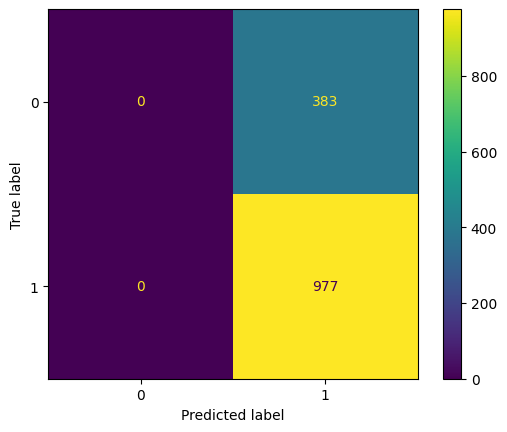

In [435]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S n-gram

In [436]:
svc_model = SVC()
svc_model.fit(X_train_combined_svc, y_train)

SVC()

In [437]:
y_pred_train = svc_model.predict(X_train_combined_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8726355611601513
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.65      0.75       958
           1       0.86      0.97      0.91      2214

    accuracy                           0.87      3172
   macro avg       0.88      0.81      0.83      3172
weighted avg       0.88      0.87      0.87      3172



In [438]:
y_pred = svc_model.predict(X_test_combined_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.84      0.59      0.69       383
           1       0.86      0.96      0.90       977

    accuracy                           0.85      1360
   macro avg       0.85      0.77      0.80      1360
weighted avg       0.85      0.85      0.84      1360



In [439]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [440]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.96
Precision: 0.86
F1 Score: 0.90


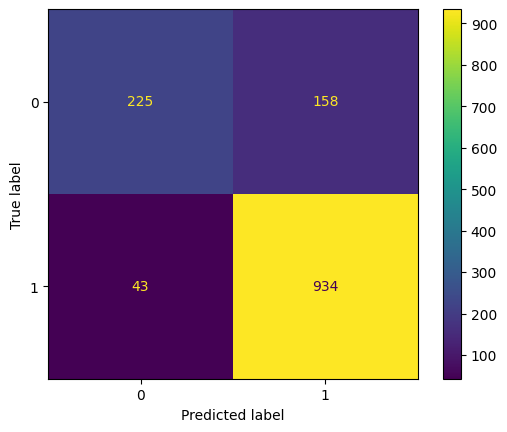

In [441]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S n-gram tfidf

In [442]:
svc_model = SVC()
svc_model.fit(X_train_combined2_svc, y_train)

SVC()

In [443]:
y_pred_train = svc_model.predict(X_train_combined2_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6982976040353089
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.60      0.00      0.01       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.65      0.50      0.41      3172
weighted avg       0.67      0.70      0.58      3172



In [444]:
y_pred = svc_model.predict(X_test_combined2_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.50      0.00      0.01       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.61      0.50      0.42      1360
weighted avg       0.66      0.72      0.60      1360



In [445]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [446]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.72
Recall: 1.00
Precision: 0.72
F1 Score: 0.84


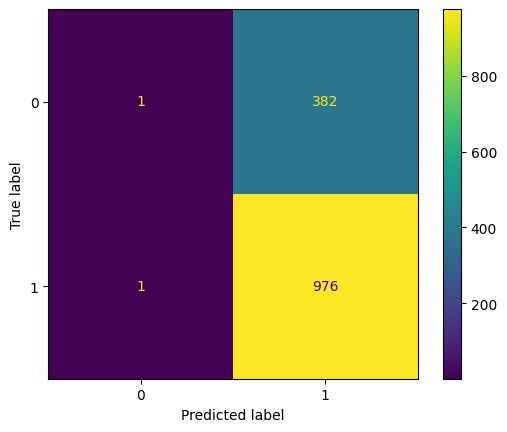

In [447]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S word frequency

In [448]:
svc_model = SVC()
svc_model.fit(X_train_combined3_svc, y_train)

SVC()

In [449]:
y_pred_train = svc_model.predict(X_train_combined3_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8546658259773013
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.60      0.71       958
           1       0.85      0.96      0.90      2214

    accuracy                           0.85      3172
   macro avg       0.86      0.78      0.81      3172
weighted avg       0.86      0.85      0.85      3172



In [450]:
y_pred = svc_model.predict(X_test_combined3_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.58      0.68       383
           1       0.85      0.95      0.90       977

    accuracy                           0.85      1360
   macro avg       0.84      0.77      0.79      1360
weighted avg       0.84      0.85      0.84      1360



In [451]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [452]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.95
Precision: 0.85
F1 Score: 0.90


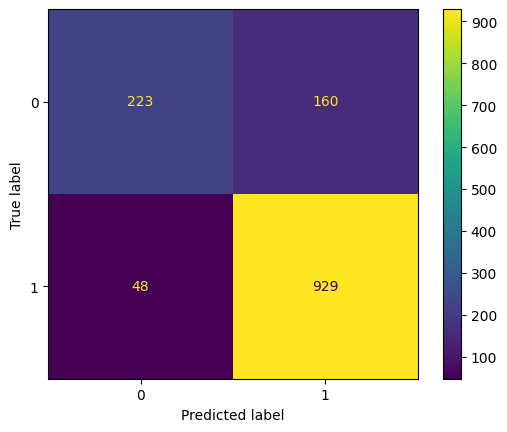

In [453]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S tfidf word frequency

In [454]:
svc_model = SVC()
svc_model.fit(X_train_combined4_svc, y_train)

SVC()

In [455]:
y_pred_train = svc_model.predict(X_train_combined4_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6982976040353089
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.60      0.00      0.01       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.65      0.50      0.41      3172
weighted avg       0.67      0.70      0.58      3172



In [456]:
y_pred = svc_model.predict(X_test_combined4_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.50      0.00      0.01       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.61      0.50      0.42      1360
weighted avg       0.66      0.72      0.60      1360



In [457]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [458]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.72
Recall: 1.00
Precision: 0.72
F1 Score: 0.84


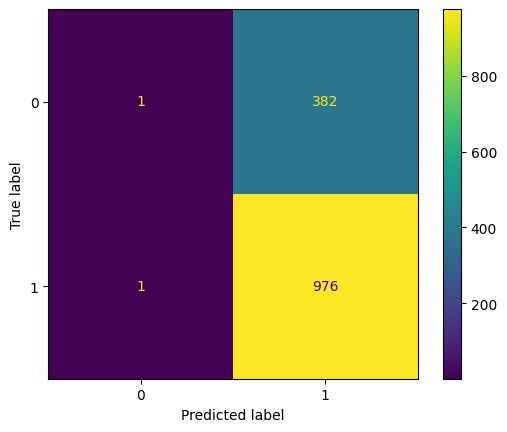

In [459]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrenim outlierov

In [460]:
svc_model = SVC()
svc_model.fit(X_train_out_svc, y_train)

SVC()

In [461]:
y_pred_train = svc_model.predict(X_train_out_svc)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.78      0.21      0.33       958
           1       0.74      0.97      0.84      2214

    accuracy                           0.74      3172
   macro avg       0.76      0.59      0.58      3172
weighted avg       0.75      0.74      0.68      3172



In [462]:
y_pred = svc_model.predict(X_test_out_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.81      0.18      0.29       383
           1       0.75      0.98      0.85       977

    accuracy                           0.76      1360
   macro avg       0.78      0.58      0.57      1360
weighted avg       0.77      0.76      0.69      1360



In [463]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [464]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.76
Recall: 0.98
Precision: 0.75
F1 Score: 0.85


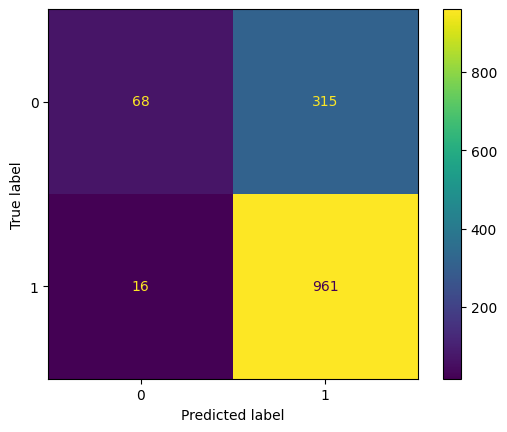

In [465]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrenim outlierov a n-gram

In [466]:
svc_model = SVC()
svc_model.fit(X_train_combined_out_svc, y_train)

SVC()

In [467]:
y_pred_train = svc_model.predict(X_train_combined_out_svc)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.65      0.76       958
           1       0.87      0.97      0.91      2214

    accuracy                           0.87      3172
   macro avg       0.88      0.81      0.84      3172
weighted avg       0.88      0.87      0.87      3172



In [468]:
y_pred = svc_model.predict(X_test_combined_out_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.84      0.58      0.69       383
           1       0.85      0.96      0.90       977

    accuracy                           0.85      1360
   macro avg       0.85      0.77      0.80      1360
weighted avg       0.85      0.85      0.84      1360



In [469]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [470]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.96
Precision: 0.85
F1 Score: 0.90


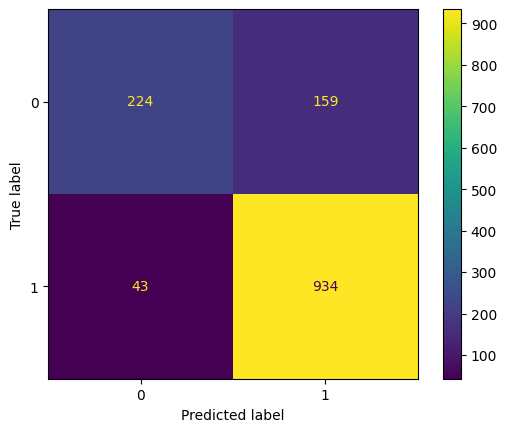

In [471]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrenim outlierov a tfidf n-gram

In [472]:
svc_model = SVC()
svc_model.fit(X_train_combined2_out_svc, y_train)

SVC()

In [473]:
y_pred_train = svc_model.predict(X_train_combined2_out_svc)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.34      0.48       958
           1       0.77      0.97      0.86      2214

    accuracy                           0.78      3172
   macro avg       0.80      0.65      0.67      3172
weighted avg       0.79      0.78      0.74      3172



In [474]:
y_pred = svc_model.predict(X_test_combined2_out_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.32      0.47       383
           1       0.79      0.98      0.87       977

    accuracy                           0.80      1360
   macro avg       0.83      0.65      0.67      1360
weighted avg       0.81      0.80      0.76      1360



In [475]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [476]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.80
Recall: 0.98
Precision: 0.79
F1 Score: 0.87


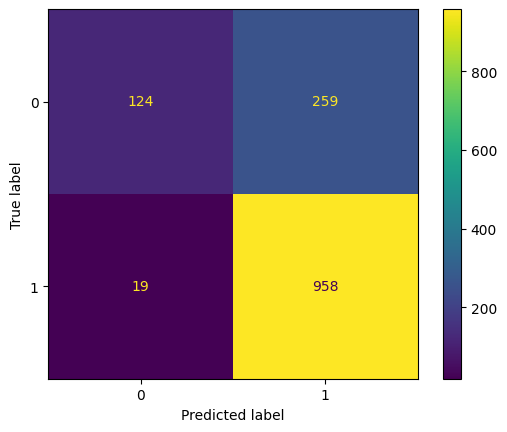

In [477]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrenim outlierov a word frequency

In [478]:
svc_model = SVC()
svc_model.fit(X_train_combined3_out_svc, y_train)

SVC()

In [479]:
y_pred_train = svc_model.predict(X_train_combined3_out_svc)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.60      0.71       958
           1       0.85      0.96      0.90      2214

    accuracy                           0.85      3172
   macro avg       0.86      0.78      0.81      3172
weighted avg       0.86      0.85      0.85      3172



In [480]:
y_pred = svc_model.predict(X_test_combined3_out_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.58      0.68       383
           1       0.85      0.95      0.90       977

    accuracy                           0.85      1360
   macro avg       0.84      0.77      0.79      1360
weighted avg       0.84      0.85      0.84      1360



In [481]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [482]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.95
Precision: 0.85
F1 Score: 0.90


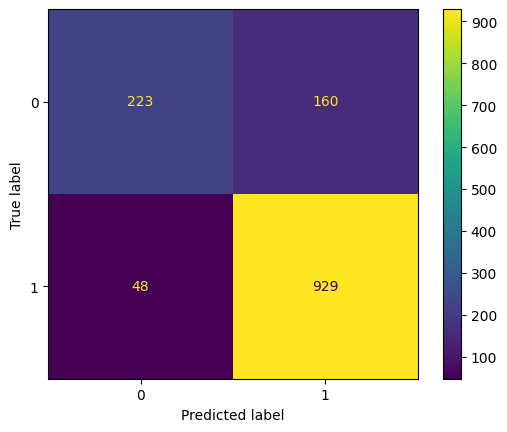

In [483]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrenim outlierov a tfidf word frequency

In [484]:
svc_model = SVC()
svc_model.fit(X_train_combined4_out_svc, y_train)

SVC()

In [485]:
y_pred_train = svc_model.predict(X_train_combined4_out_svc)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.34      0.48       958
           1       0.77      0.97      0.86      2214

    accuracy                           0.78      3172
   macro avg       0.79      0.65      0.67      3172
weighted avg       0.78      0.78      0.74      3172



In [486]:
y_pred = svc_model.predict(X_test_combined4_out_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.32      0.46       383
           1       0.79      0.98      0.87       977

    accuracy                           0.79      1360
   macro avg       0.82      0.65      0.67      1360
weighted avg       0.81      0.79      0.76      1360



In [487]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [488]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.79
Recall: 0.98
Precision: 0.79
F1 Score: 0.87


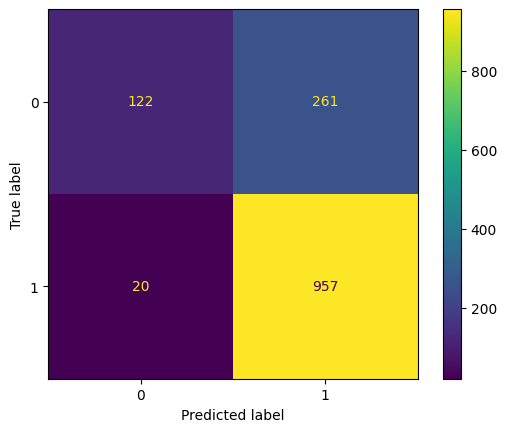

In [489]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - So škálovaním

In [490]:
svc_model = SVC()
svc_model.fit(X_train_scaled_svc, y_train)

SVC()

In [491]:
y_pred_train = svc_model.predict(X_train_scaled_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6986128625472888
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.75      0.00      0.01       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.72      0.50      0.41      3172
weighted avg       0.71      0.70      0.58      3172



In [492]:
y_pred = svc_model.predict(X_test_scaled_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7198529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.01      0.01       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.86      0.50      0.42      1360
weighted avg       0.80      0.72      0.60      1360



In [493]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [494]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.72
Recall: 1.00
Precision: 0.72
F1 Score: 0.84


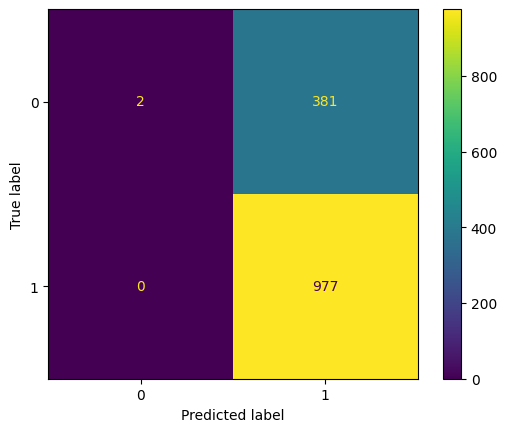

In [495]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - So škálovaním a n-grammi

In [496]:
svc_model = SVC()
svc_model.fit(X_train_combined_scaled_svc, y_train)

SVC()

In [497]:
y_pred_train = svc_model.predict(X_train_combined_scaled_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8729508196721312
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.65      0.76       958
           1       0.86      0.97      0.91      2214

    accuracy                           0.87      3172
   macro avg       0.88      0.81      0.83      3172
weighted avg       0.88      0.87      0.87      3172



In [498]:
y_pred = svc_model.predict(X_test_combined_scaled_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8514705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.84      0.58      0.69       383
           1       0.85      0.96      0.90       977

    accuracy                           0.85      1360
   macro avg       0.85      0.77      0.80      1360
weighted avg       0.85      0.85      0.84      1360



In [499]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [500]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.96
Precision: 0.85
F1 Score: 0.90


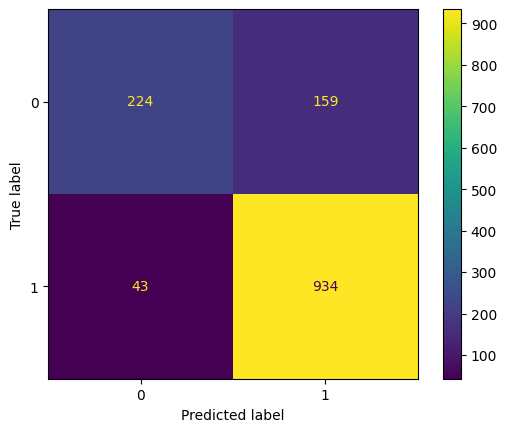

In [501]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - So škálovaním a tfidf n-gram

In [502]:
svc_model = SVC()
svc_model.fit(X_train_combined2_scaled_svc, y_train)

SVC()

In [503]:
y_pred_train = svc_model.predict(X_train_combined2_scaled_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7629255989911727
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.28      0.41       958
           1       0.76      0.97      0.85      2214

    accuracy                           0.76      3172
   macro avg       0.79      0.63      0.63      3172
weighted avg       0.77      0.76      0.72      3172



In [504]:
y_pred = svc_model.predict(X_test_combined2_scaled_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7779411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.27      0.41       383
           1       0.77      0.98      0.86       977

    accuracy                           0.78      1360
   macro avg       0.80      0.62      0.63      1360
weighted avg       0.79      0.78      0.73      1360



In [505]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [506]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.78
Recall: 0.98
Precision: 0.77
F1 Score: 0.86


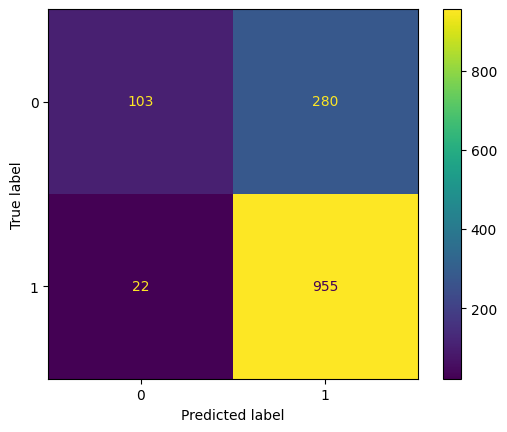

In [507]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - So škálovaním a word frequency

In [508]:
svc_model = SVC()
svc_model.fit(X_train_combined3_scaled_svc, y_train)

SVC()

In [509]:
y_pred_train = svc_model.predict(X_train_combined3_scaled_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8549810844892812
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.60      0.71       958
           1       0.85      0.96      0.90      2214

    accuracy                           0.85      3172
   macro avg       0.86      0.78      0.81      3172
weighted avg       0.86      0.85      0.85      3172



In [510]:
y_pred = svc_model.predict(X_test_combined3_scaled_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8470588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.58      0.68       383
           1       0.85      0.95      0.90       977

    accuracy                           0.85      1360
   macro avg       0.84      0.77      0.79      1360
weighted avg       0.84      0.85      0.84      1360



In [511]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [512]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.95
Precision: 0.85
F1 Score: 0.90


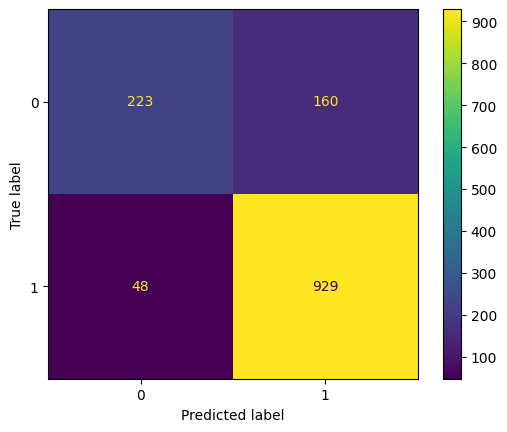

In [513]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - So škálovaním a tfidf word frequency

In [514]:
svc_model = SVC()
svc_model.fit(X_train_combined4_scaled_svc, y_train)

SVC()

In [515]:
y_pred_train = svc_model.predict(X_train_combined4_scaled_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7604035308953342
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.27      0.40       958
           1       0.75      0.97      0.85      2214

    accuracy                           0.76      3172
   macro avg       0.79      0.62      0.63      3172
weighted avg       0.77      0.76      0.71      3172



In [516]:
y_pred = svc_model.predict(X_test_combined4_scaled_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7794117647058824
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.83      0.27      0.41       383
           1       0.77      0.98      0.86       977

    accuracy                           0.78      1360
   macro avg       0.80      0.63      0.64      1360
weighted avg       0.79      0.78      0.74      1360



In [517]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [518]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.78
Recall: 0.98
Precision: 0.77
F1 Score: 0.86


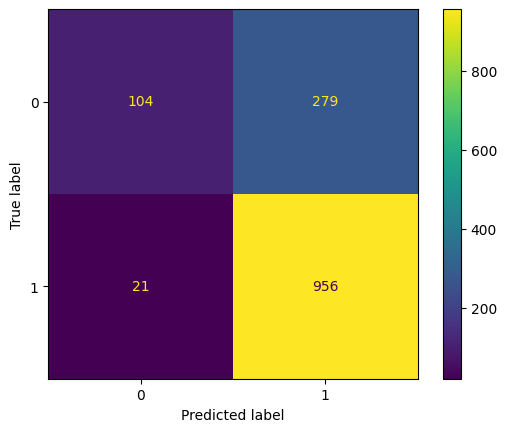

In [519]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrením outlierov a so škálovaním

In [520]:
svc_model = SVC()
svc_model.fit(X_train_scal_out_svc, y_train)

SVC()

In [521]:
y_pred_train = svc_model.predict(X_train_scal_out_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7421185372005045
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.78      0.21      0.33       958
           1       0.74      0.97      0.84      2214

    accuracy                           0.74      3172
   macro avg       0.76      0.59      0.58      3172
weighted avg       0.75      0.74      0.68      3172



In [522]:
y_pred = svc_model.predict(X_test_scal_out_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7566176470588235
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.81      0.18      0.29       383
           1       0.75      0.98      0.85       977

    accuracy                           0.76      1360
   macro avg       0.78      0.58      0.57      1360
weighted avg       0.77      0.76      0.69      1360



In [523]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [524]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.76
Recall: 0.98
Precision: 0.75
F1 Score: 0.85


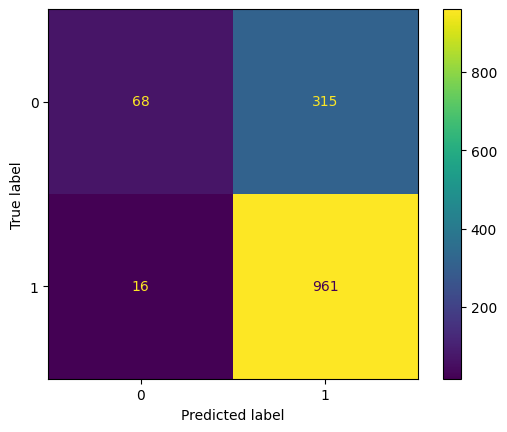

In [525]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrením outlierov a so škálovaním a s n-gram

In [526]:
svc_model = SVC()
svc_model.fit(X_train_combined_scal_out_svc, y_train)

SVC()

In [527]:
y_pred_train = svc_model.predict(X_train_combined_scal_out_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.873266078184111
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.65      0.76       958
           1       0.87      0.97      0.91      2214

    accuracy                           0.87      3172
   macro avg       0.88      0.81      0.84      3172
weighted avg       0.88      0.87      0.87      3172



In [528]:
y_pred = svc_model.predict(X_test_combined_scal_out_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8514705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.84      0.58      0.69       383
           1       0.85      0.96      0.90       977

    accuracy                           0.85      1360
   macro avg       0.85      0.77      0.80      1360
weighted avg       0.85      0.85      0.84      1360



In [529]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [530]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.96
Precision: 0.85
F1 Score: 0.90


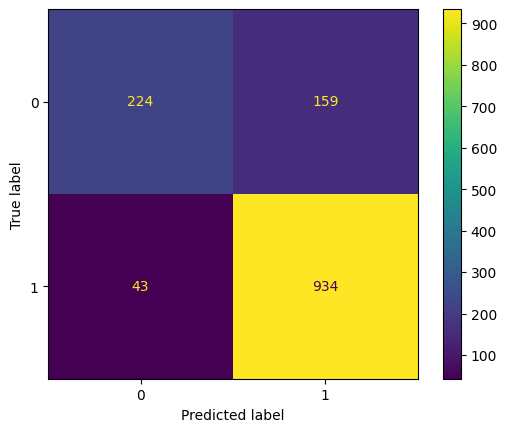

In [531]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrením outlierov a so škálovaním a s tfidf n-gram

In [532]:
svc_model = SVC()
svc_model.fit(X_train_combined2_scal_out_svc, y_train)

SVC()

In [533]:
y_pred_train = svc_model.predict(X_train_combined2_scal_out_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7771122320302648
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.34      0.48       958
           1       0.77      0.97      0.86      2214

    accuracy                           0.78      3172
   macro avg       0.80      0.65      0.67      3172
weighted avg       0.79      0.78      0.74      3172



In [534]:
y_pred = svc_model.predict(X_test_combined2_scal_out_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7955882352941176
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.32      0.47       383
           1       0.79      0.98      0.87       977

    accuracy                           0.80      1360
   macro avg       0.83      0.65      0.67      1360
weighted avg       0.81      0.80      0.76      1360



In [535]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [536]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.80
Recall: 0.98
Precision: 0.79
F1 Score: 0.87


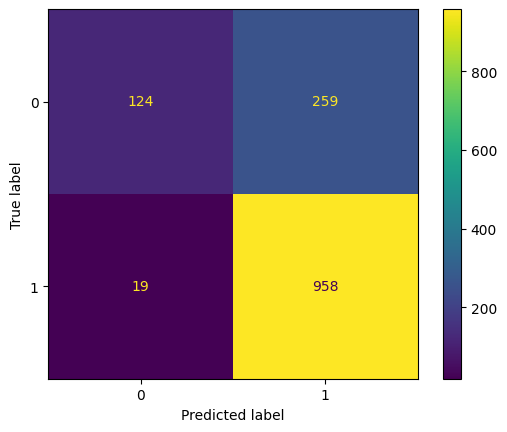

In [537]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrením outlierov a so škálovaním a s word frequency

In [538]:
svc_model = SVC()
svc_model.fit(X_train_combined3_scal_out_svc, y_train)

SVC()

In [539]:
y_pred_train = svc_model.predict(X_train_combined3_scal_out_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8549810844892812
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.60      0.71       958
           1       0.85      0.96      0.90      2214

    accuracy                           0.85      3172
   macro avg       0.86      0.78      0.81      3172
weighted avg       0.86      0.85      0.85      3172



In [540]:
y_pred = svc_model.predict(X_test_combined3_scal_out_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8470588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.58      0.68       383
           1       0.85      0.95      0.90       977

    accuracy                           0.85      1360
   macro avg       0.84      0.77      0.79      1360
weighted avg       0.84      0.85      0.84      1360



In [541]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [542]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.95
Precision: 0.85
F1 Score: 0.90


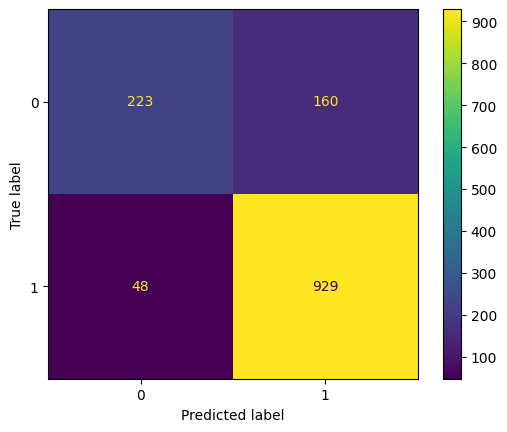

In [543]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrením outlierov a so škálovaním a s tfidf word frequency

In [544]:
svc_model = SVC()
svc_model.fit(X_train_combined4_scal_out_svc, y_train)

SVC()

In [545]:
y_pred_train = svc_model.predict(X_train_combined4_scal_out_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7764817150063051
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.34      0.48       958
           1       0.77      0.97      0.86      2214

    accuracy                           0.78      3172
   macro avg       0.79      0.65      0.67      3172
weighted avg       0.78      0.78      0.74      3172



In [546]:
y_pred = svc_model.predict(X_test_combined4_scal_out_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7933823529411764
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.32      0.46       383
           1       0.79      0.98      0.87       977

    accuracy                           0.79      1360
   macro avg       0.82      0.65      0.67      1360
weighted avg       0.81      0.79      0.76      1360



In [547]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [548]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.79
Recall: 0.98
Precision: 0.79
F1 Score: 0.87


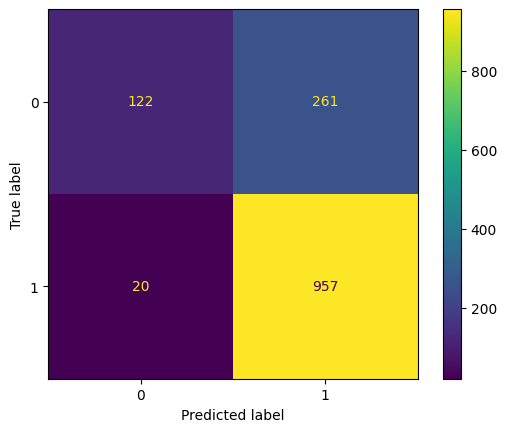

In [549]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

In [550]:
results_svc2 = pd.DataFrame(results_list2_svc)
print(results_svc2)

    accuracy_train  accuracy_test  precision_train  precision_test  \
0         0.698613       0.718382         0.698423        0.718382   
1         0.872636       0.852206         0.864625        0.855311   
2         0.698298       0.718382         0.698453        0.718704   
3         0.854666       0.847059         0.848232        0.853076   
4         0.698298       0.718382         0.698453        0.718704   
5         0.742119       0.756618         0.739205        0.753135   
6         0.873266       0.851471         0.865028        0.854529   
7         0.777112       0.795588         0.770946        0.787182   
8         0.854981       0.847059         0.848569        0.853076   
9         0.776482       0.793382         0.770781        0.785714   
10        0.698613       0.719853         0.698548        0.719440   
11        0.872951       0.851471         0.864680        0.854529   
12        0.762926       0.777941         0.756852        0.773279   
13        0.854981  

Podľa výsledkov po druhom testovani svc môžeme vidieť, že najlepší výsledok mal dataset bez osetrenia outlierov a skalovania s ngramamy. Takže je zrejme, že najväčší vplyv na úspešnosť malo pridanie textovej reprezentácie ngram alebo word frewuency. V porovnaní s prvým textom sa accuracy mierne zvýšilo.

RANDOM FOREST - Bez ošetrenia outlierov a bez skalovania

In [551]:
results_list2_rf=[]

Trenovanie modelu

In [552]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_rf, y_train)

RandomForestClassifier()

Predikovanie na trenovacich datach

In [553]:
y_pred_train = rf_model.predict(X_train_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



Predikovanie na testovacich datach

In [554]:
y_pred = rf_model.predict(X_test_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7676470588235295
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.66      0.36      0.46       383
           1       0.79      0.93      0.85       977

    accuracy                           0.77      1360
   macro avg       0.72      0.64      0.66      1360
weighted avg       0.75      0.77      0.74      1360



In [555]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

Zobrazenie metrik

In [556]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.77
Recall: 0.93
Precision: 0.79
F1 Score: 0.85


Vizualizácia výkonnosti modelu

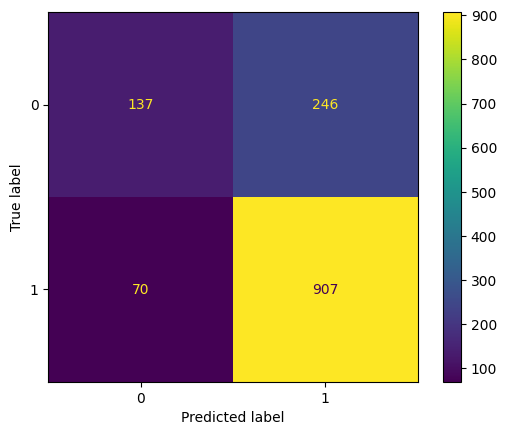

In [557]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S n-gram

In [558]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined_rf, y_train)

RandomForestClassifier()

In [559]:
y_pred_train = rf_model.predict(X_train_combined_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [560]:
y_pred = rf_model.predict(X_test_combined_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8551470588235294
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.57      0.69       383
           1       0.85      0.97      0.91       977

    accuracy                           0.86      1360
   macro avg       0.86      0.77      0.80      1360
weighted avg       0.86      0.86      0.84      1360



In [561]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [562]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.97
Precision: 0.85
F1 Score: 0.91


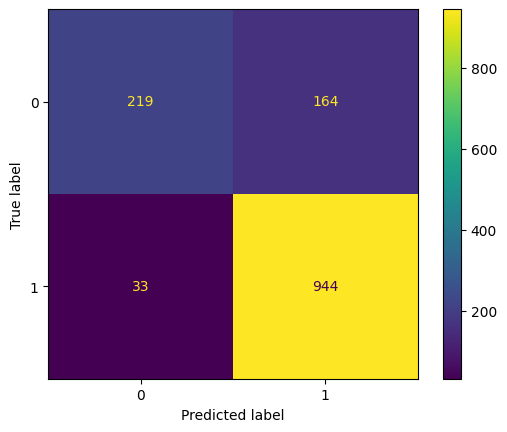

In [563]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S n-gram tfidf

In [564]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2_rf, y_train)

RandomForestClassifier()

In [565]:
y_pred_train = rf_model.predict(X_train_combined2_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [566]:
y_pred = rf_model.predict(X_test_combined2_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8632352941176471
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.61      0.72       383
           1       0.86      0.96      0.91       977

    accuracy                           0.86      1360
   macro avg       0.86      0.79      0.81      1360
weighted avg       0.86      0.86      0.86      1360



In [567]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [568]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.96
Precision: 0.86
F1 Score: 0.91


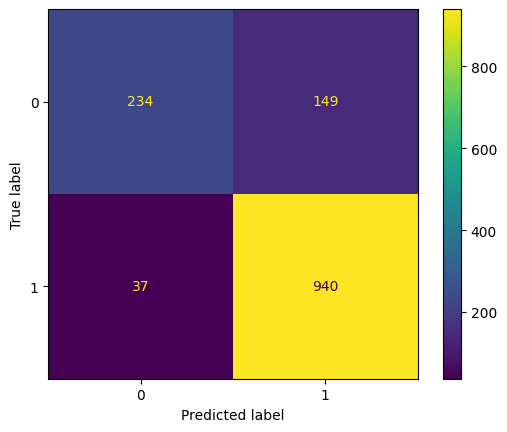

In [569]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S word frequency

In [570]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3_rf, y_train)

RandomForestClassifier()

In [571]:
y_pred_train = rf_model.predict(X_train_combined3_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [572]:
y_pred = rf_model.predict(X_test_combined3_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8595588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.59      0.70       383
           1       0.86      0.97      0.91       977

    accuracy                           0.86      1360
   macro avg       0.86      0.78      0.81      1360
weighted avg       0.86      0.86      0.85      1360



In [573]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [574]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.97
Precision: 0.86
F1 Score: 0.91


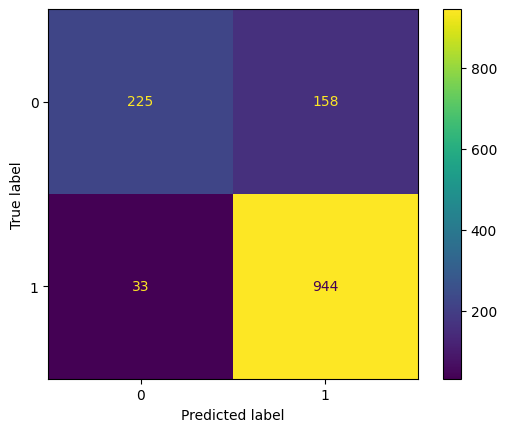

In [575]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S tfidf word frequency

In [576]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4_rf, y_train)

RandomForestClassifier()

In [577]:
y_pred_train = rf_model.predict(X_train_combined4_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [578]:
y_pred = rf_model.predict(X_test_combined4_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8602941176470589
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.60      0.71       383
           1       0.86      0.96      0.91       977

    accuracy                           0.86      1360
   macro avg       0.86      0.78      0.81      1360
weighted avg       0.86      0.86      0.85      1360



In [579]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [580]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.96
Precision: 0.86
F1 Score: 0.91


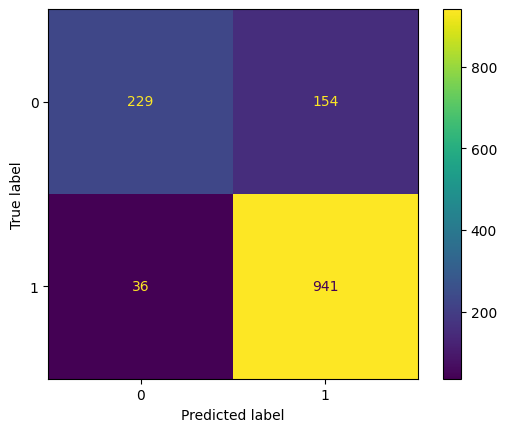

In [581]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrenim outlierov

In [582]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_out_rf, y_train)

RandomForestClassifier()

In [583]:
y_pred_train = rf_model.predict(X_train_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [584]:
y_pred = rf_model.predict(X_test_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9110294117647059
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.77      0.83       383
           1       0.91      0.97      0.94       977

    accuracy                           0.91      1360
   macro avg       0.91      0.87      0.88      1360
weighted avg       0.91      0.91      0.91      1360



In [585]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [586]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.91
Recall: 0.97
Precision: 0.91
F1 Score: 0.94


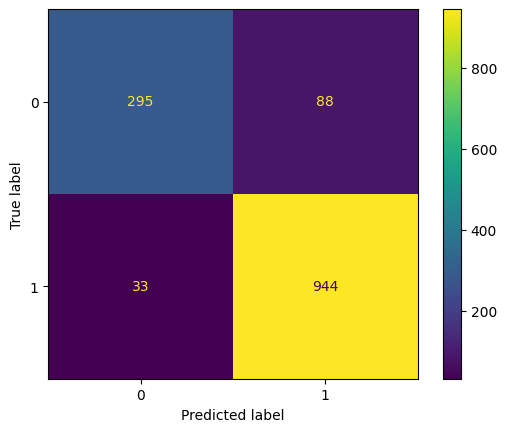

In [587]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrenim outlierov a n-gram

In [588]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined_out_rf, y_train)

RandomForestClassifier()

In [589]:
y_pred_train = rf_model.predict(X_train_combined_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [590]:
y_pred = rf_model.predict(X_test_combined_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8801470588235294
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.63      0.75       383
           1       0.87      0.98      0.92       977

    accuracy                           0.88      1360
   macro avg       0.89      0.81      0.84      1360
weighted avg       0.88      0.88      0.87      1360



In [591]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [592]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.88
Recall: 0.98
Precision: 0.87
F1 Score: 0.92


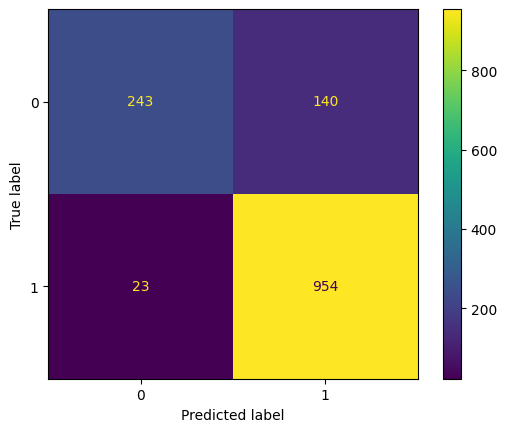

In [593]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrenim outlierov a tfidf n-gram

In [594]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2_out_rf, y_train)

RandomForestClassifier()

In [595]:
y_pred_train = rf_model.predict(X_train_combined2_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [596]:
y_pred = rf_model.predict(X_test_combined2_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8948529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.68      0.79       383
           1       0.89      0.98      0.93       977

    accuracy                           0.89      1360
   macro avg       0.91      0.83      0.86      1360
weighted avg       0.90      0.89      0.89      1360



In [597]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [598]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.89
Recall: 0.98
Precision: 0.89
F1 Score: 0.93


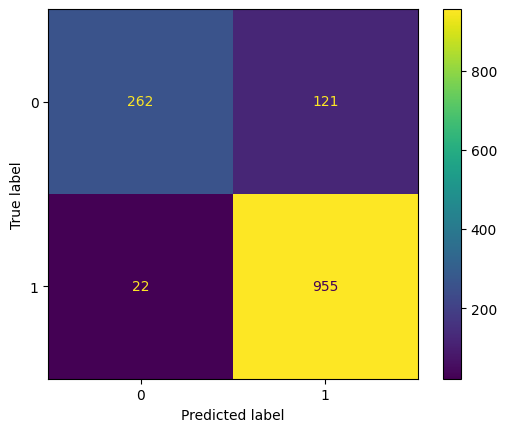

In [599]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrenim outlierov a word frequency

In [600]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3_out_rf, y_train)

RandomForestClassifier()

In [601]:
y_pred_train = rf_model.predict(X_train_combined3_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [602]:
y_pred = rf_model.predict(X_test_combined3_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9066176470588235
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.73      0.82       383
           1       0.90      0.98      0.94       977

    accuracy                           0.91      1360
   macro avg       0.91      0.85      0.88      1360
weighted avg       0.91      0.91      0.90      1360



In [603]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [604]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.91
Recall: 0.98
Precision: 0.90
F1 Score: 0.94


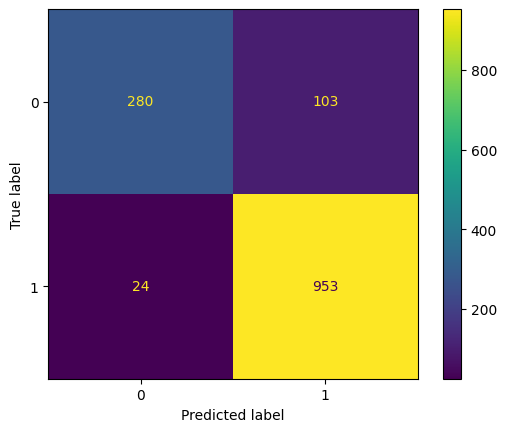

In [605]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrenim outlierov a tfidf word frequency

In [606]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4_out_rf, y_train)

RandomForestClassifier()

In [607]:
y_pred_train = rf_model.predict(X_train_combined4_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [608]:
y_pred = rf_model.predict(X_test_combined4_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.70      0.80       383
           1       0.89      0.98      0.93       977

    accuracy                           0.90      1360
   macro avg       0.91      0.84      0.87      1360
weighted avg       0.90      0.90      0.90      1360



In [609]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [610]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.98
Precision: 0.89
F1 Score: 0.93


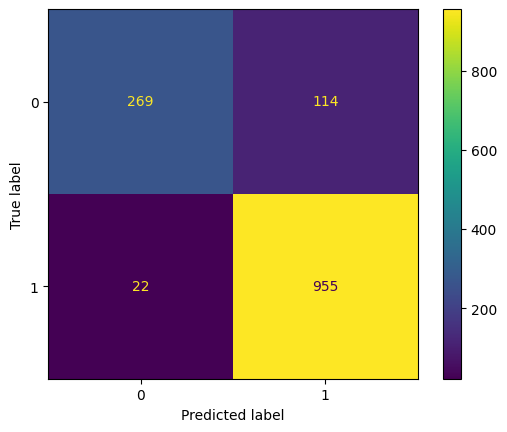

In [611]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - So škálovaním

In [612]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_scaled_rf, y_train)

RandomForestClassifier()

In [613]:
y_pred_train = rf_model.predict(X_train_scaled_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [614]:
y_pred = rf_model.predict(X_test_scaled_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7786764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.69      0.39      0.50       383
           1       0.79      0.93      0.86       977

    accuracy                           0.78      1360
   macro avg       0.74      0.66      0.68      1360
weighted avg       0.77      0.78      0.76      1360



In [615]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [616]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.78
Recall: 0.93
Precision: 0.79
F1 Score: 0.86


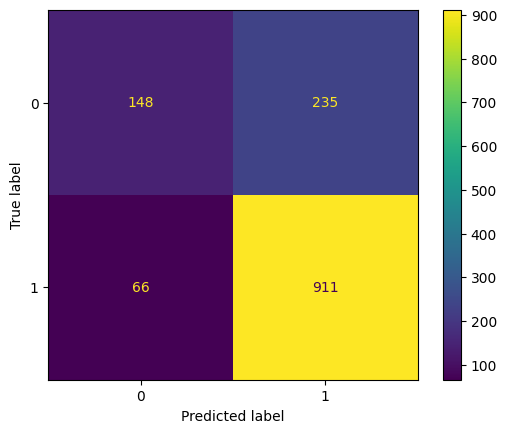

In [617]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - So škálovaním a n-gram

In [618]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined_scaled_rf, y_train)

RandomForestClassifier()

In [619]:
y_pred_train = rf_model.predict(X_train_combined_scaled_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [620]:
y_pred = rf_model.predict(X_test_combined_scaled_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8514705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.55      0.68       383
           1       0.85      0.97      0.90       977

    accuracy                           0.85      1360
   macro avg       0.86      0.76      0.79      1360
weighted avg       0.85      0.85      0.84      1360



In [621]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [622]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.97
Precision: 0.85
F1 Score: 0.90


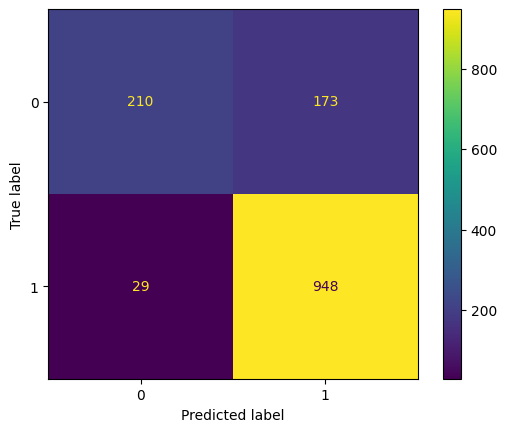

In [623]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - So škálovaním a tfidf n-gram

In [624]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2_scaled_rf, y_train)

RandomForestClassifier()

In [625]:
y_pred_train = rf_model.predict(X_train_combined2_scaled_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [626]:
y_pred = rf_model.predict(X_test_combined2_scaled_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8544117647058823
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.59      0.70       383
           1       0.86      0.96      0.90       977

    accuracy                           0.85      1360
   macro avg       0.85      0.77      0.80      1360
weighted avg       0.85      0.85      0.85      1360



In [627]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [628]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.96
Precision: 0.86
F1 Score: 0.90


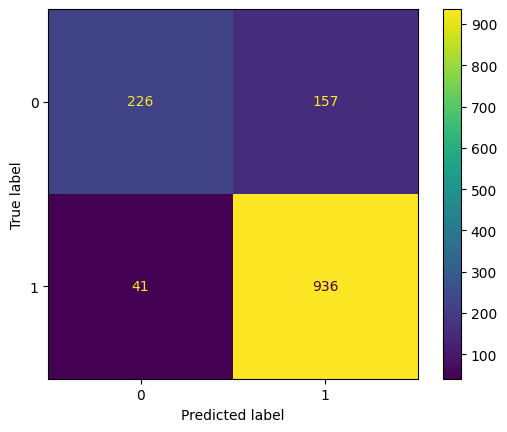

In [629]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - So škálovaním a word frequency

In [630]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3_scaled_rf, y_train)

RandomForestClassifier()

In [631]:
y_pred_train = rf_model.predict(X_train_combined3_scaled_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [632]:
y_pred = rf_model.predict(X_test_combined3_scaled_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8566176470588235
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.57      0.69       383
           1       0.85      0.97      0.91       977

    accuracy                           0.86      1360
   macro avg       0.87      0.77      0.80      1360
weighted avg       0.86      0.86      0.85      1360



In [633]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [634]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.97
Precision: 0.85
F1 Score: 0.91


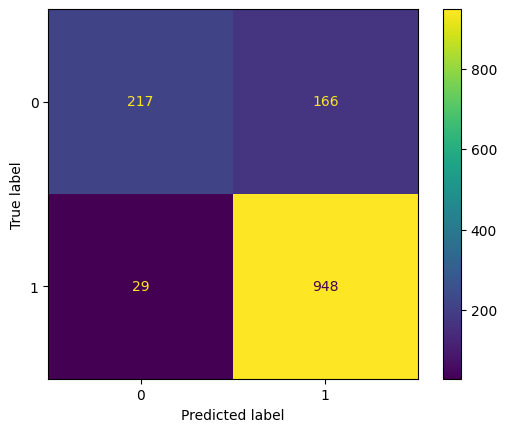

In [635]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - So škálovaním a tfidf word frequency

In [636]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4_scaled_rf, y_train)

RandomForestClassifier()

In [637]:
y_pred_train = rf_model.predict(X_train_combined4_scaled_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [638]:
y_pred = rf_model.predict(X_test_combined4_scaled_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8647058823529412
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.61      0.72       383
           1       0.86      0.97      0.91       977

    accuracy                           0.86      1360
   macro avg       0.87      0.79      0.81      1360
weighted avg       0.87      0.86      0.86      1360



In [639]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [640]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.97
Precision: 0.86
F1 Score: 0.91


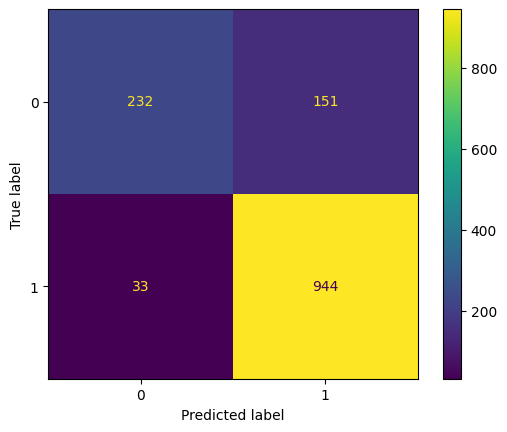

In [641]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrením outlierov a so škálovaním

In [642]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_scal_out_rf, y_train)

RandomForestClassifier()

In [643]:
y_pred_train = rf_model.predict(X_train_scal_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [644]:
y_pred = rf_model.predict(X_test_scal_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9154411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.79      0.84       383
           1       0.92      0.97      0.94       977

    accuracy                           0.92      1360
   macro avg       0.91      0.88      0.89      1360
weighted avg       0.91      0.92      0.91      1360



In [645]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [646]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.92
Recall: 0.97
Precision: 0.92
F1 Score: 0.94


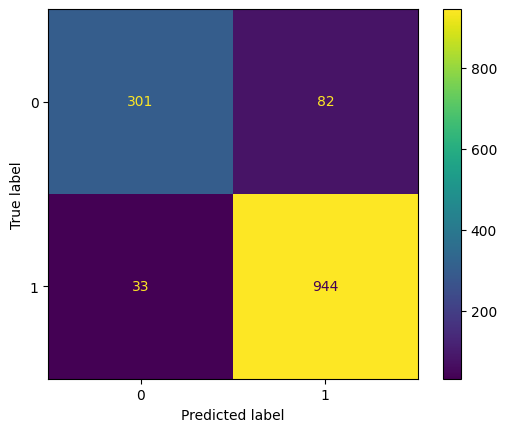

In [647]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrením outlierov a so škálovaním a s n-gram

In [648]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined_scal_out_rf, y_train)

RandomForestClassifier()

In [649]:
y_pred_train = rf_model.predict(X_train_combined_scal_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [650]:
y_pred = rf_model.predict(X_test_combined_scal_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8735294117647059
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.61      0.73       383
           1       0.87      0.98      0.92       977

    accuracy                           0.87      1360
   macro avg       0.89      0.79      0.82      1360
weighted avg       0.88      0.87      0.87      1360



In [651]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [652]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.87
Recall: 0.98
Precision: 0.87
F1 Score: 0.92


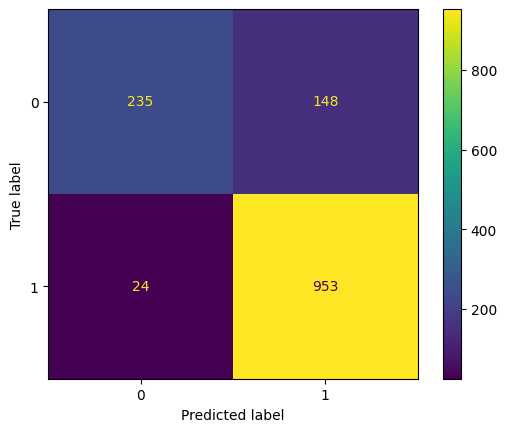

In [653]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrením outlierov a so škálovaním a s tfidf-ngram

In [654]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2_scal_out_rf, y_train)

RandomForestClassifier()

In [655]:
y_pred_train = rf_model.predict(X_train_combined2_scal_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [656]:
y_pred = rf_model.predict(X_test_combined2_scal_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8963235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.69      0.79       383
           1       0.89      0.98      0.93       977

    accuracy                           0.90      1360
   macro avg       0.90      0.83      0.86      1360
weighted avg       0.90      0.90      0.89      1360



In [657]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [658]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.98
Precision: 0.89
F1 Score: 0.93


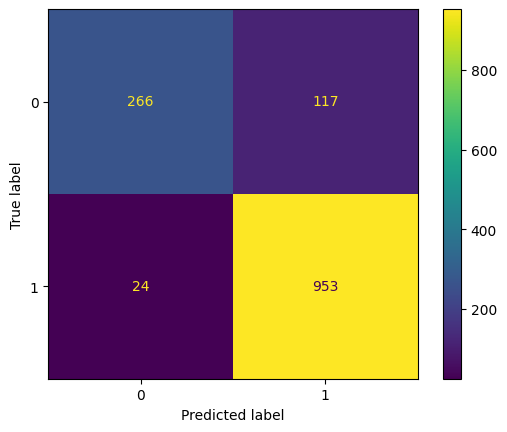

In [659]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrením outlierov a so škálovaním a s word frequency

In [660]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3_scal_out_rf, y_train)

RandomForestClassifier()

In [661]:
y_pred_train = rf_model.predict(X_train_combined3_scal_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [662]:
y_pred = rf_model.predict(X_test_combined3_scal_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9169117647058823
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.75      0.84       383
           1       0.91      0.98      0.94       977

    accuracy                           0.92      1360
   macro avg       0.93      0.87      0.89      1360
weighted avg       0.92      0.92      0.91      1360



In [663]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })


In [664]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.92
Recall: 0.98
Precision: 0.91
F1 Score: 0.94


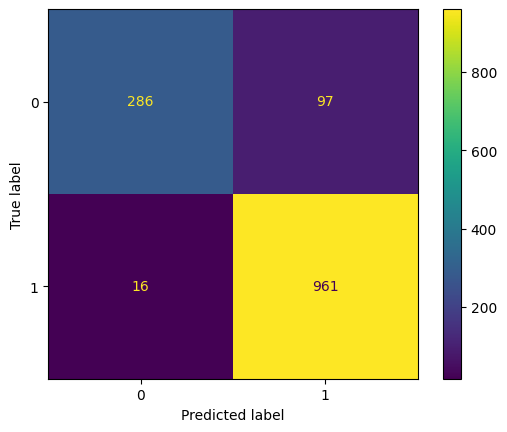

In [665]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrením outlierov a so škálovaním a s tfidf word frequency

In [666]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4_scal_out_rf, y_train)

RandomForestClassifier()

In [667]:
y_pred_train = rf_model.predict(X_train_combined4_scal_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [668]:
y_pred = rf_model.predict(X_test_combined4_scal_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9154411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.74      0.83       383
           1       0.91      0.98      0.94       977

    accuracy                           0.92      1360
   macro avg       0.93      0.86      0.89      1360
weighted avg       0.92      0.92      0.91      1360



In [669]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [670]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.92
Recall: 0.98
Precision: 0.91
F1 Score: 0.94


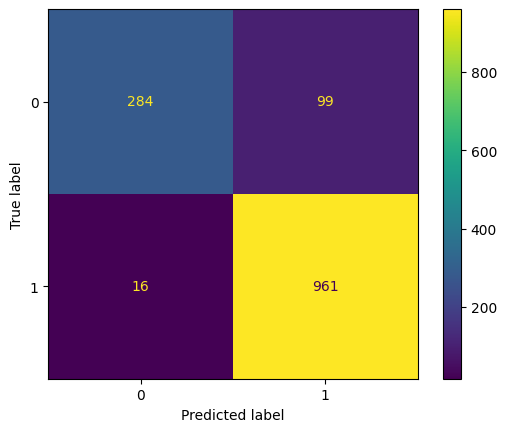

In [671]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

In [672]:
results_rf2 = pd.DataFrame(results_list2_rf)
print(results_rf2)

    accuracy_train  accuracy_test  precision_train  precision_test  \
0              1.0       0.767647              1.0        0.786644   
1              1.0       0.855147              1.0        0.851986   
2              1.0       0.863235              1.0        0.863177   
3              1.0       0.859559              1.0        0.856624   
4              1.0       0.860294              1.0        0.859361   
5              1.0       0.911029              1.0        0.914729   
6              1.0       0.880147              1.0        0.872029   
7              1.0       0.894853              1.0        0.887546   
8              1.0       0.906618              1.0        0.902462   
9              1.0       0.900000              1.0        0.893358   
10             1.0       0.778676              1.0        0.794939   
11             1.0       0.851471              1.0        0.845674   
12             1.0       0.854412              1.0        0.856359   
13             1.0  

Podľa výsledkov po druhom testovani random forest môžeme vidieť, že najlepší výsledok mal dataset s ošetrenými outliermi so skalovanim s word frequency. Takže je zrejme, že najväčší vplyv na úspešnosť malo ošetrenie outlierov. V porovnaní s prvým testom sa accuracy mierne zvýšilo. Aj ked sme zníšili počet črt, tak model je stále pretrénovaný.

GRADIENT BOOSTING CLASSIFIER - Bez ošetrenia outlierov a bez skalovania

In [673]:
results_list2_gbm=[]

Trenovanie modelu

In [674]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_gbm, y_train)

GradientBoostingClassifier()

Predikovanie na trenovacich datach

In [675]:
y_pred_train = gbm_model.predict(X_train_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8546658259773013
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.61      0.72       958
           1       0.85      0.96      0.90      2214

    accuracy                           0.85      3172
   macro avg       0.86      0.79      0.81      3172
weighted avg       0.86      0.85      0.85      3172



Predikovanie na testovacich datach

In [676]:
y_pred = gbm_model.predict(X_test_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7779411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.66      0.44      0.53       383
           1       0.81      0.91      0.85       977

    accuracy                           0.78      1360
   macro avg       0.73      0.68      0.69      1360
weighted avg       0.76      0.78      0.76      1360



In [677]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

Zobrazenie metrik

In [678]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.78
Recall: 0.91
Precision: 0.81
F1 Score: 0.85


Vizualizácia výkonnosti modelu

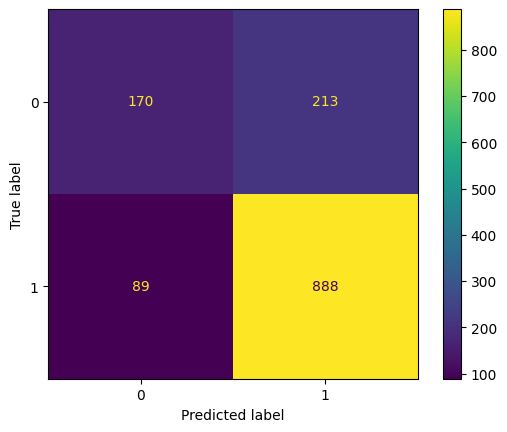

In [679]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S n-gram

In [680]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined_gbm, y_train)

GradientBoostingClassifier()

In [681]:
y_pred_train = gbm_model.predict(X_train_combined_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9687894073139974
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95       958
           1       0.97      0.99      0.98      2214

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [682]:
y_pred = gbm_model.predict(X_test_combined_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.899264705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.78      0.81       383
           1       0.92      0.94      0.93       977

    accuracy                           0.90      1360
   macro avg       0.88      0.86      0.87      1360
weighted avg       0.90      0.90      0.90      1360



In [683]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [684]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.94
Precision: 0.92
F1 Score: 0.93


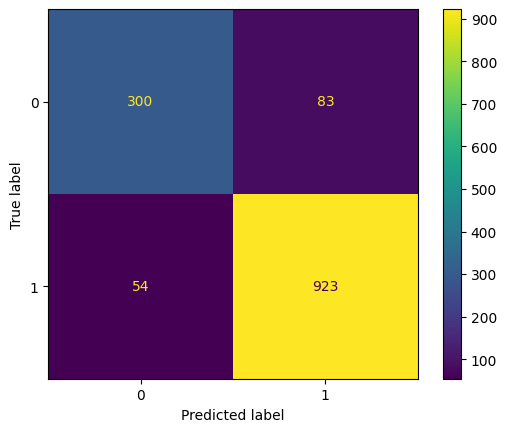

In [685]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S n-gram tfidf

In [686]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2_gbm, y_train)

GradientBoostingClassifier()

In [687]:
y_pred_train = gbm_model.predict(X_train_combined2_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9637452711223203
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.92      0.94       958
           1       0.97      0.98      0.97      2214

    accuracy                           0.96      3172
   macro avg       0.96      0.95      0.96      3172
weighted avg       0.96      0.96      0.96      3172



In [688]:
y_pred = gbm_model.predict(X_test_combined2_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8904411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.83      0.77      0.80       383
           1       0.91      0.94      0.92       977

    accuracy                           0.89      1360
   macro avg       0.87      0.85      0.86      1360
weighted avg       0.89      0.89      0.89      1360



In [689]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [690]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.89
Recall: 0.94
Precision: 0.91
F1 Score: 0.92


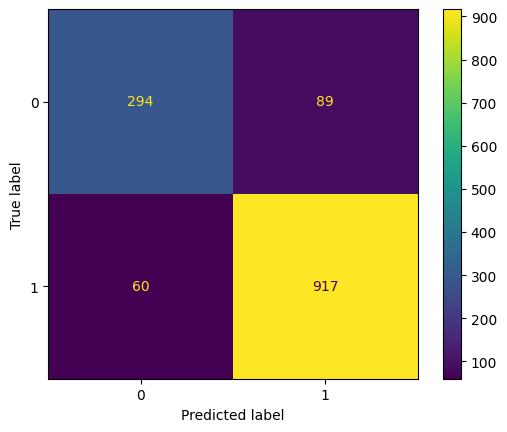

In [691]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S word frequency

In [692]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3_gbm, y_train)

GradientBoostingClassifier()

In [693]:
y_pred_train = gbm_model.predict(X_train_combined3_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9593316519546028
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.91      0.93       958
           1       0.96      0.98      0.97      2214

    accuracy                           0.96      3172
   macro avg       0.96      0.94      0.95      3172
weighted avg       0.96      0.96      0.96      3172



In [694]:
y_pred = gbm_model.predict(X_test_combined3_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8830882352941176
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.83      0.74      0.78       383
           1       0.90      0.94      0.92       977

    accuracy                           0.88      1360
   macro avg       0.87      0.84      0.85      1360
weighted avg       0.88      0.88      0.88      1360



In [695]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [696]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.88
Recall: 0.94
Precision: 0.90
F1 Score: 0.92


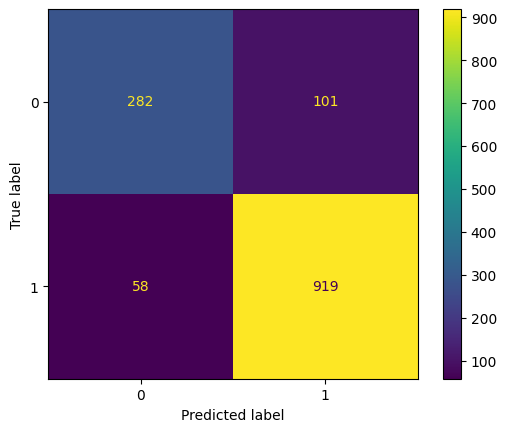

In [697]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S tfidf word frequency

In [698]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4_gbm, y_train)

GradientBoostingClassifier()

In [699]:
y_pred_train = gbm_model.predict(X_train_combined4_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9646910466582598
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.92      0.94       958
           1       0.97      0.98      0.97      2214

    accuracy                           0.96      3172
   macro avg       0.96      0.95      0.96      3172
weighted avg       0.96      0.96      0.96      3172



In [700]:
y_pred = gbm_model.predict(X_test_combined4_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.888235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.83      0.76      0.79       383
           1       0.91      0.94      0.92       977

    accuracy                           0.89      1360
   macro avg       0.87      0.85      0.86      1360
weighted avg       0.89      0.89      0.89      1360



In [701]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [702]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.89
Recall: 0.94
Precision: 0.91
F1 Score: 0.92


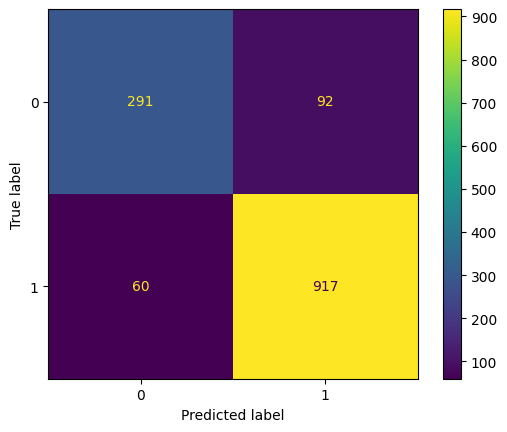

In [703]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrenim outlierov

In [704]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_out_gbm, y_train)

GradientBoostingClassifier()

In [705]:
y_pred_train = gbm_model.predict(X_train_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9691046658259773
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.98      0.92      0.95       958
           1       0.97      0.99      0.98      2214

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [706]:
y_pred = gbm_model.predict(X_test_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9404411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.85      0.89       383
           1       0.94      0.98      0.96       977

    accuracy                           0.94      1360
   macro avg       0.94      0.91      0.92      1360
weighted avg       0.94      0.94      0.94      1360



In [707]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [708]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.94
Recall: 0.98
Precision: 0.94
F1 Score: 0.96


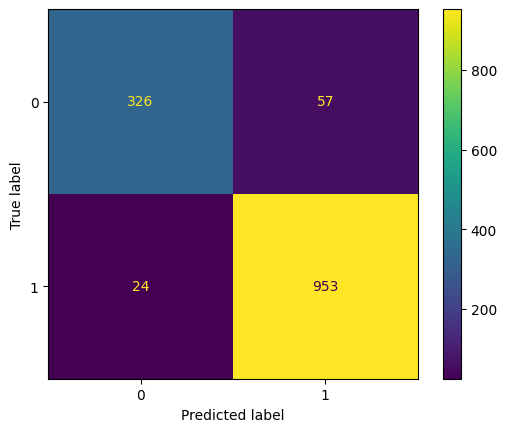

In [709]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrenim outlierov a n-gram

In [710]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined_out_gbm, y_train)

GradientBoostingClassifier()

In [711]:
y_pred_train = gbm_model.predict(X_train_combined_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.998108448928121
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [712]:
y_pred = gbm_model.predict(X_test_combined_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9602941176470589
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.89      0.93       383
           1       0.96      0.99      0.97       977

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [713]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [714]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.99
Precision: 0.96
F1 Score: 0.97


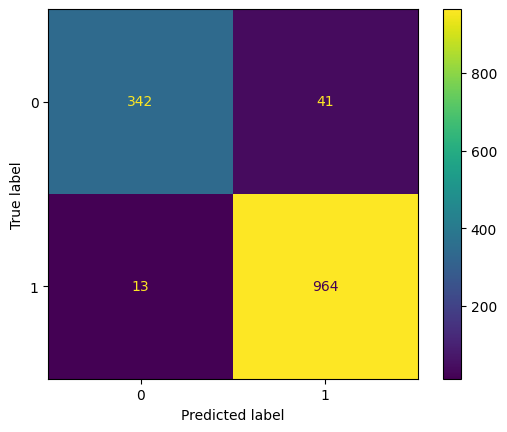

In [715]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrenim outlierov a tfidf n-gram

In [716]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2_out_gbm, y_train)

GradientBoostingClassifier()

In [717]:
y_pred_train = gbm_model.predict(X_train_combined2_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9952711223203027
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       958
           1       0.99      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      0.99      0.99      3172
weighted avg       1.00      1.00      1.00      3172



In [718]:
y_pred = gbm_model.predict(X_test_combined2_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9566176470588236
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.89      0.92       383
           1       0.96      0.98      0.97       977

    accuracy                           0.96      1360
   macro avg       0.95      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [719]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [720]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


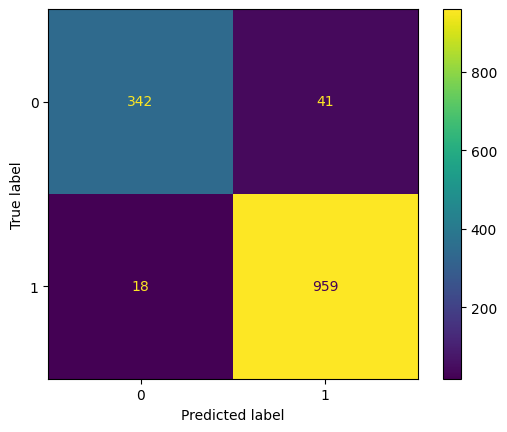

In [721]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrenim outlierov a word frequency

In [722]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3_out_gbm, y_train)

GradientBoostingClassifier()

In [723]:
y_pred_train = gbm_model.predict(X_train_combined3_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9940100882723834
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.98      0.99       958
           1       0.99      1.00      1.00      2214

    accuracy                           0.99      3172
   macro avg       0.99      0.99      0.99      3172
weighted avg       0.99      0.99      0.99      3172



In [724]:
y_pred = gbm_model.predict(X_test_combined3_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9625
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93       383
           1       0.96      0.99      0.97       977

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [725]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [726]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.99
Precision: 0.96
F1 Score: 0.97


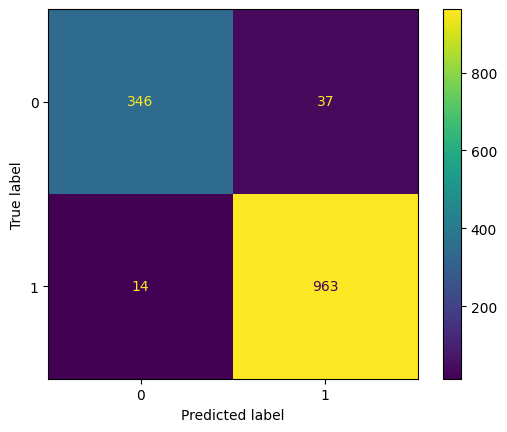

In [727]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrenim outlierov a tfidf word frequency

In [728]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4_out_gbm, y_train)

GradientBoostingClassifier()

In [729]:
y_pred_train = gbm_model.predict(X_train_combined4_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.994640605296343
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       958
           1       0.99      1.00      1.00      2214

    accuracy                           0.99      3172
   macro avg       0.99      0.99      0.99      3172
weighted avg       0.99      0.99      0.99      3172



In [730]:
y_pred = gbm_model.predict(X_test_combined4_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9566176470588236
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.89      0.92       383
           1       0.96      0.98      0.97       977

    accuracy                           0.96      1360
   macro avg       0.95      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [731]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [732]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


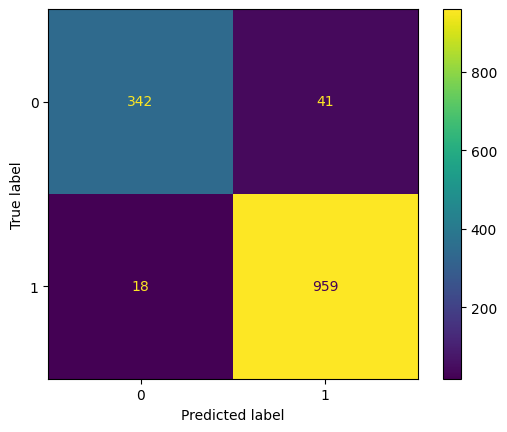

In [733]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - So škálovaním

In [734]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_scaled_gbm, y_train)

GradientBoostingClassifier()

In [735]:
y_pred_train = gbm_model.predict(X_train_scaled_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8549810844892812
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.61      0.72       958
           1       0.85      0.96      0.90      2214

    accuracy                           0.85      3172
   macro avg       0.86      0.79      0.81      3172
weighted avg       0.86      0.85      0.85      3172



In [736]:
y_pred = gbm_model.predict(X_test_scaled_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7757352941176471
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.66      0.42      0.52       383
           1       0.80      0.91      0.85       977

    accuracy                           0.78      1360
   macro avg       0.73      0.67      0.68      1360
weighted avg       0.76      0.78      0.76      1360



In [737]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [738]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.78
Recall: 0.91
Precision: 0.80
F1 Score: 0.85


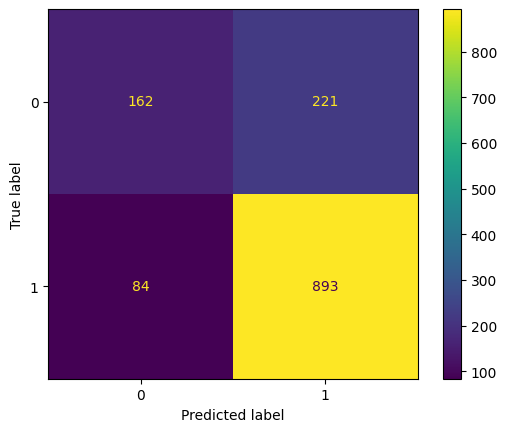

In [739]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - So škálovaním a n-gram

In [740]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined_scaled_gbm, y_train)

GradientBoostingClassifier()

In [741]:
y_pred_train = gbm_model.predict(X_train_combined_scaled_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9691046658259773
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95       958
           1       0.97      0.99      0.98      2214

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [742]:
y_pred = gbm_model.predict(X_test_combined_scaled_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.899264705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.78      0.81       383
           1       0.92      0.95      0.93       977

    accuracy                           0.90      1360
   macro avg       0.88      0.86      0.87      1360
weighted avg       0.90      0.90      0.90      1360



In [743]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [744]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.95
Precision: 0.92
F1 Score: 0.93


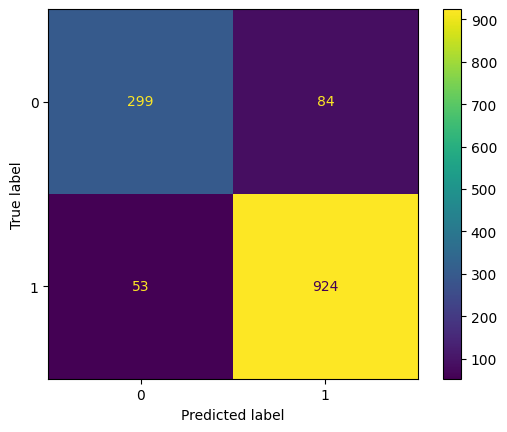

In [745]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - So škálovaním a tfidf n-gram

In [746]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2_scaled_gbm, y_train)

GradientBoostingClassifier()

In [747]:
y_pred_train = gbm_model.predict(X_train_combined2_scaled_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9650063051702396
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.92      0.94       958
           1       0.97      0.98      0.98      2214

    accuracy                           0.97      3172
   macro avg       0.96      0.95      0.96      3172
weighted avg       0.96      0.97      0.96      3172



In [748]:
y_pred = gbm_model.predict(X_test_combined2_scaled_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8963235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.84      0.78      0.81       383
           1       0.92      0.94      0.93       977

    accuracy                           0.90      1360
   macro avg       0.88      0.86      0.87      1360
weighted avg       0.89      0.90      0.90      1360



In [749]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [750]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.94
Precision: 0.92
F1 Score: 0.93


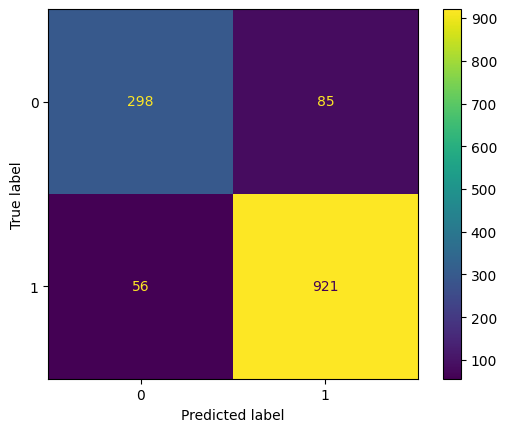

In [751]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - So škálovaním a word frequency

In [752]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3_scaled_gbm, y_train)

GradientBoostingClassifier()

In [753]:
y_pred_train = gbm_model.predict(X_train_combined3_scaled_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9590163934426229
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93       958
           1       0.96      0.98      0.97      2214

    accuracy                           0.96      3172
   macro avg       0.96      0.94      0.95      3172
weighted avg       0.96      0.96      0.96      3172



In [754]:
y_pred = gbm_model.predict(X_test_combined3_scaled_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8801470588235294
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.74      0.78       383
           1       0.90      0.94      0.92       977

    accuracy                           0.88      1360
   macro avg       0.86      0.84      0.85      1360
weighted avg       0.88      0.88      0.88      1360



In [755]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [756]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.88
Recall: 0.94
Precision: 0.90
F1 Score: 0.92


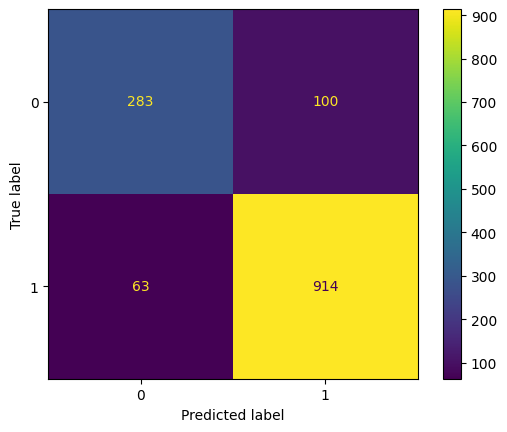

In [757]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - So škálovaním a tfidf word frequency

In [758]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4_scaled_gbm, y_train)

GradientBoostingClassifier()

In [759]:
y_pred_train = gbm_model.predict(X_train_combined4_scaled_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9631147540983607
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.92      0.94       958
           1       0.97      0.98      0.97      2214

    accuracy                           0.96      3172
   macro avg       0.96      0.95      0.96      3172
weighted avg       0.96      0.96      0.96      3172



In [760]:
y_pred = gbm_model.predict(X_test_combined4_scaled_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8875
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.76      0.79       383
           1       0.91      0.94      0.92       977

    accuracy                           0.89      1360
   macro avg       0.87      0.85      0.86      1360
weighted avg       0.89      0.89      0.89      1360



In [761]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [762]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.89
Recall: 0.94
Precision: 0.91
F1 Score: 0.92


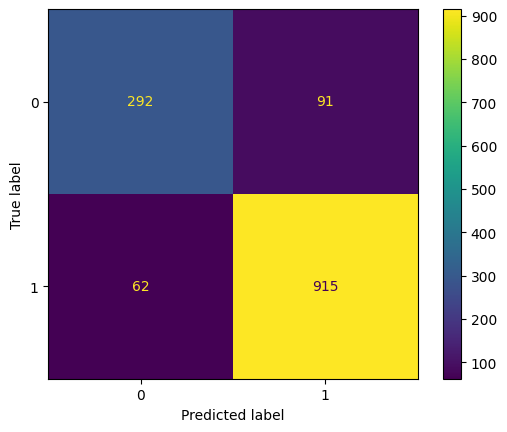

In [763]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrením outlierov a so škálovaním

In [764]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_scal_out_gbm, y_train)

GradientBoostingClassifier()

In [765]:
y_pred_train = gbm_model.predict(X_train_scal_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9691046658259773
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.98      0.92      0.95       958
           1       0.97      0.99      0.98      2214

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [766]:
y_pred = gbm_model.predict(X_test_scal_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9404411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.85      0.89       383
           1       0.94      0.98      0.96       977

    accuracy                           0.94      1360
   macro avg       0.94      0.91      0.92      1360
weighted avg       0.94      0.94      0.94      1360



In [767]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [768]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.94
Recall: 0.98
Precision: 0.94
F1 Score: 0.96


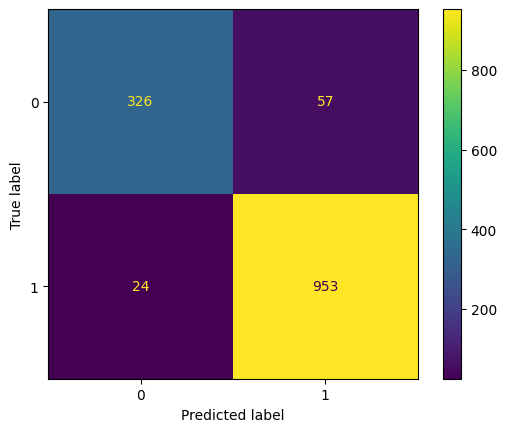

In [769]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrením outlierov a so škálovaním a n-gram

In [770]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined_scal_out_gbm, y_train)

GradientBoostingClassifier()

In [771]:
y_pred_train = gbm_model.predict(X_train_combined_scal_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.998108448928121
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [772]:
y_pred = gbm_model.predict(X_test_combined_scal_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9602941176470589
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.89      0.93       383
           1       0.96      0.99      0.97       977

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [773]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [774]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.99
Precision: 0.96
F1 Score: 0.97


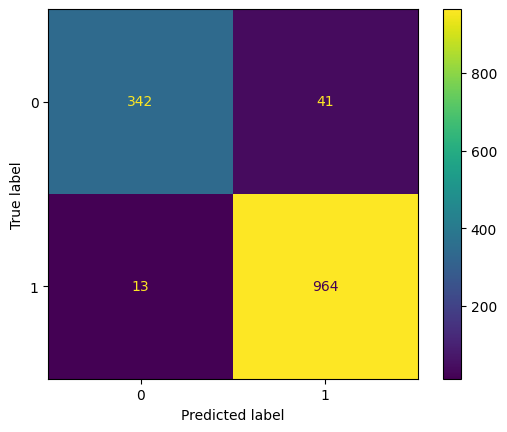

In [775]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrením outlierov a so škálovaním a tfidf n-gram

In [776]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2_scal_out_gbm, y_train)

GradientBoostingClassifier()

In [777]:
y_pred_train = gbm_model.predict(X_train_combined2_scal_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9952711223203027
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       958
           1       0.99      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      0.99      0.99      3172
weighted avg       1.00      1.00      1.00      3172



In [778]:
y_pred = gbm_model.predict(X_test_combined2_scal_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9566176470588236
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.89      0.92       383
           1       0.96      0.98      0.97       977

    accuracy                           0.96      1360
   macro avg       0.95      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [779]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [780]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


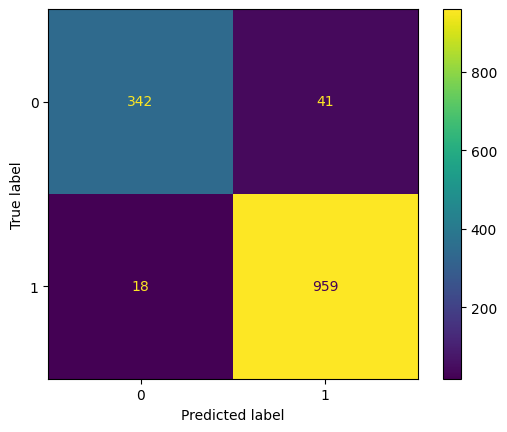

In [781]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrením outlierov a so škálovaním a word frequency

In [782]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3_scal_out_gbm, y_train)

GradientBoostingClassifier()

In [783]:
y_pred_train = gbm_model.predict(X_train_combined3_scal_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9940100882723834
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.98      0.99       958
           1       0.99      1.00      1.00      2214

    accuracy                           0.99      3172
   macro avg       0.99      0.99      0.99      3172
weighted avg       0.99      0.99      0.99      3172



In [784]:
y_pred = gbm_model.predict(X_test_combined3_scal_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9625
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93       383
           1       0.96      0.99      0.97       977

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [785]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [786]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.99
Precision: 0.96
F1 Score: 0.97


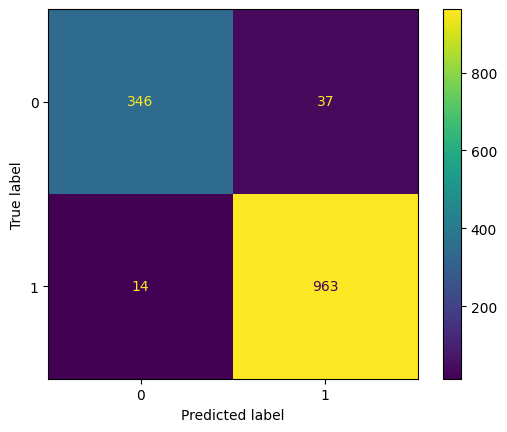

In [787]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrením outlierov a so škálovaním a tfidf word frequency

In [788]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4_scal_out_gbm, y_train)

GradientBoostingClassifier()

In [789]:
y_pred_train = gbm_model.predict(X_train_combined4_scal_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.994640605296343
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       958
           1       0.99      1.00      1.00      2214

    accuracy                           0.99      3172
   macro avg       0.99      0.99      0.99      3172
weighted avg       0.99      0.99      0.99      3172



In [790]:
y_pred = gbm_model.predict(X_test_combined4_scal_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9566176470588236
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.89      0.92       383
           1       0.96      0.98      0.97       977

    accuracy                           0.96      1360
   macro avg       0.95      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [791]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [792]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


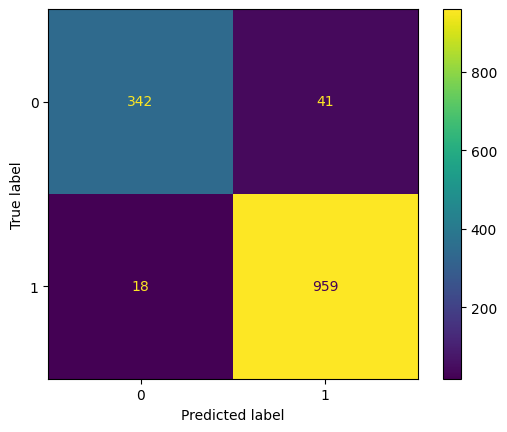

In [793]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

In [794]:
results_gbm2 = pd.DataFrame(results_list2_gbm)
print(results_gbm2)

    accuracy_train  accuracy_test  precision_train  precision_test  \
0         0.854666       0.777941         0.850460        0.806540   
1         0.968789       0.899265         0.969791        0.917495   
2         0.963745       0.890441         0.965823        0.911531   
3         0.959332       0.883088         0.960265        0.900980   
4         0.964691       0.888235         0.967943        0.908821   
5         0.969105       0.940441         0.966490        0.943564   
6         0.998108       0.960294         0.998195        0.959204   
7         0.995271       0.956618         0.994602        0.959000   
8         0.994010       0.962500         0.993258        0.963000   
9         0.994641       0.956618         0.994152        0.959000   
10        0.854981       0.775735         0.851081        0.801616   
11        0.969105       0.899265         0.970641        0.916667   
12        0.965006       0.896324         0.967541        0.915507   
13        0.959016  

Podľa výsledkov po druhom testovani random forest môžeme vidieť, že najlepší výsledok mal dataset s ošetrenými outliermi a word frequency a s datasetom s ošetrenými outliermi a škálovaním a word frequency.Takže je zrejme, že najväčší vplyv na úspešnosť malo ošetrenie outlierov a pridávanie textovej reprezentácie. V porovnaní s prvým testom sa accuracy mierne zvýšilo.

HYPERPARAMETRE

Teraz vykonáme testovanie 3, pričom použijeme datasety s výberom črt. Preddefinujeme si hyperparametre, ktoré bude gridsearch skúšať a bude hľadať tú najlepšiu kombináciu aby dosiahol čím najvýšie accuracy. Potom s týmito parametrami si spustíme predikciu na trenovacej aj testovacej sade.

SVC - bez osetrenia outlierov a skalovania

In [795]:
results_list3_svc=[]

Určenie hyperparametrov, ktore budeme v grid search skúšať

In [796]:
param_grid = {
    'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'gamma': ['scale', 'auto'],
    'coef0': [0.0, 0.5, 1.0, 1.5],
}

Grid search - vyskúša každú kombináciu hyperparametrov a vypíše tu najlepšiu pre accuracy

In [797]:
model = SVC()
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train_svc, y_train)
print("Najlepšie parametre:", grid_search.best_params_)
print("Najlepšie skóre:", grid_search.best_score_)

Najlepšie parametre: {'C': 10, 'coef0': 1.5, 'gamma': 'auto', 'kernel': 'poly'}
Najlepšie skóre: 0.7711150301795873


Predikovanie na trenovacich datach

In [798]:
best_model = grid_search.best_estimator_
y_pred_train = best_model.predict(X_train_svc)

In [799]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8039092055485498
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.80      0.47      0.59       958
           1       0.81      0.95      0.87      2214

    accuracy                           0.80      3172
   macro avg       0.80      0.71      0.73      3172
weighted avg       0.80      0.80      0.79      3172



Predikovanie na testovacich datach

In [800]:
y_pred = best_model.predict(X_test_svc)

In [801]:
results_list3_svc.append({
        'best_score': grid_search.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [802]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7764705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.66      0.42      0.51       383
           1       0.80      0.92      0.85       977

    accuracy                           0.78      1360
   macro avg       0.73      0.67      0.68      1360
weighted avg       0.76      0.78      0.76      1360



Vizualizácia výkonnosti modelu

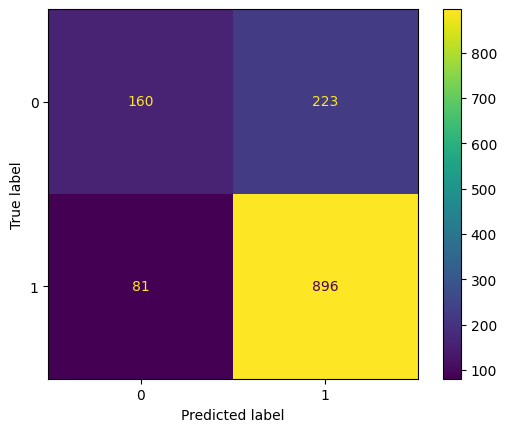

In [803]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - bez osetrenia outlierov a skalovania a ngram

In [804]:
model = SVC(**grid_search.best_params_)
print(grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
model.fit(X_train_combined_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

{'C': 10, 'coef0': 1.5, 'gamma': 'auto', 'kernel': 'poly'}


SVC(C=10, coef0=1.5, gamma='auto', kernel='poly')

In [805]:
#best_model = grid_search.best_estimator_
y_pred_train = model.predict(X_train_combined_svc)

In [806]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [807]:
y_pred = model.predict(X_test_combined_svc)

In [808]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [809]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8676470588235294
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.77      0.75      0.76       383
           1       0.90      0.91      0.91       977

    accuracy                           0.87      1360
   macro avg       0.84      0.83      0.83      1360
weighted avg       0.87      0.87      0.87      1360



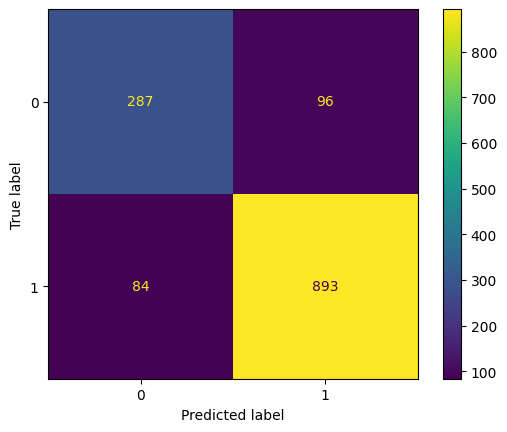

In [810]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - bez osetrenia outlierov a skalovania a tfidf ngram

In [811]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
model.fit(X_train_combined2_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=10, coef0=1.5, gamma='auto', kernel='poly')

In [812]:
y_pred_train = model.predict(X_train_combined2_svc)

In [813]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8026481715006305
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.83      0.43      0.57       958
           1       0.80      0.96      0.87      2214

    accuracy                           0.80      3172
   macro avg       0.82      0.70      0.72      3172
weighted avg       0.81      0.80      0.78      3172



In [814]:
y_pred = model.predict(X_test_combined2_svc)

In [815]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [816]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8110294117647059
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.42      0.56       383
           1       0.81      0.96      0.88       977

    accuracy                           0.81      1360
   macro avg       0.81      0.69      0.72      1360
weighted avg       0.81      0.81      0.79      1360



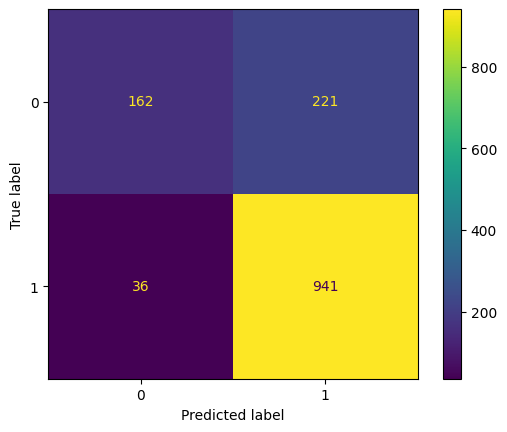

In [817]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - bez osetrenia outlierov a skalovania a word frequency

In [818]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=10, coef0=1.5, gamma='auto', kernel='poly')

In [819]:

y_pred_train = model.predict(X_train_combined3_svc)

In [820]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [821]:
y_pred = model.predict(X_test_combined3_svc)

In [822]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })


In [823]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8382352941176471
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.71      0.73      0.72       383
           1       0.89      0.88      0.89       977

    accuracy                           0.84      1360
   macro avg       0.80      0.80      0.80      1360
weighted avg       0.84      0.84      0.84      1360



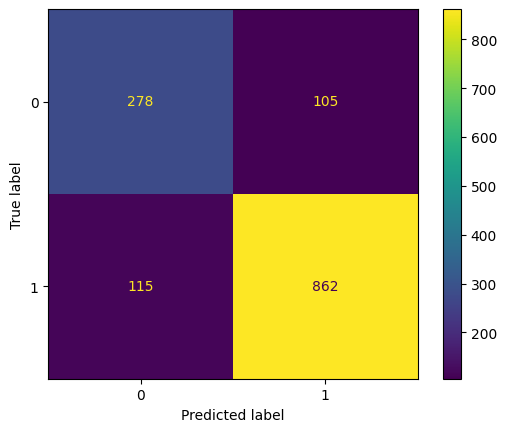

In [824]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - bez osetrenia outlierov a skalovania a tfidf word frequency

In [825]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=10, coef0=1.5, gamma='auto', kernel='poly')

In [826]:
y_pred_train = model.predict(X_train_combined4_svc)

In [827]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8017023959646911
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.84      0.43      0.57       958
           1       0.80      0.96      0.87      2214

    accuracy                           0.80      3172
   macro avg       0.82      0.70      0.72      3172
weighted avg       0.81      0.80      0.78      3172



In [828]:
y_pred = model.predict(X_test_combined4_svc)

In [829]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [830]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8095588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.83      0.41      0.55       383
           1       0.81      0.97      0.88       977

    accuracy                           0.81      1360
   macro avg       0.82      0.69      0.71      1360
weighted avg       0.81      0.81      0.79      1360



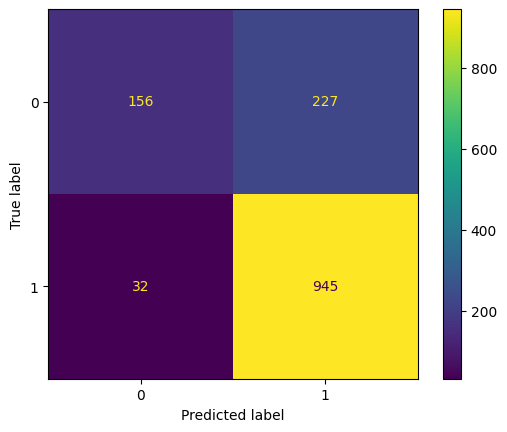

In [831]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov

In [832]:
model = SVC()
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train_out_svc, y_train)
parameters=grid_search.best_params_
print("Najlepšie parametre:", grid_search.best_params_)
print("Najlepšie skóre:", grid_search.best_score_)

Najlepšie parametre: {'C': 100, 'coef0': 0.0, 'gamma': 'auto', 'kernel': 'poly'}
Najlepšie skóre: 0.7972920340793362


In [833]:
best_model = grid_search.best_estimator_
y_pred_train = best_model.predict(X_train_out_svc)

In [834]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8244010088272383
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.79      0.57      0.66       958
           1       0.84      0.93      0.88      2214

    accuracy                           0.82      3172
   macro avg       0.81      0.75      0.77      3172
weighted avg       0.82      0.82      0.82      3172



In [835]:
y_pred = best_model.predict(X_test_out_svc)

In [836]:
results_list3_svc.append({
        'best_score': grid_search.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [837]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7889705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.67      0.50      0.57       383
           1       0.82      0.90      0.86       977

    accuracy                           0.79      1360
   macro avg       0.74      0.70      0.72      1360
weighted avg       0.78      0.79      0.78      1360



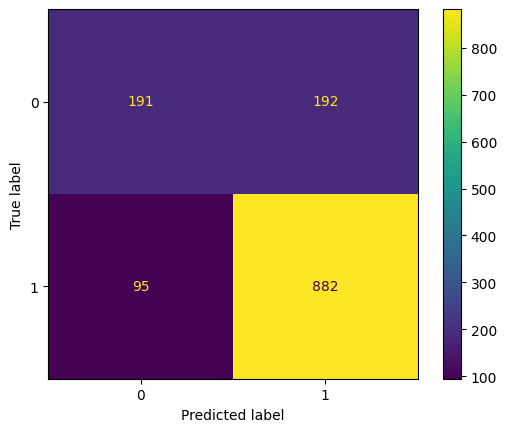

In [838]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC -  s osetrenim outlierov a ngram

In [839]:
model = SVC(C=0.1, kernel='linear')
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=0.1, kernel='linear')

In [840]:

y_pred_train = model.predict(X_train_combined_out_svc)

In [841]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [842]:
y_pred = model.predict(X_test_combined_out_svc)

In [843]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [844]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8654411764705883
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.76      0.76      0.76       383
           1       0.91      0.91      0.91       977

    accuracy                           0.87      1360
   macro avg       0.83      0.83      0.83      1360
weighted avg       0.87      0.87      0.87      1360



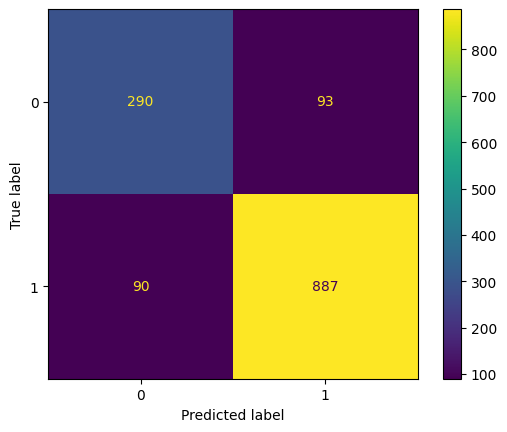

In [845]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC -  s osetrenim outlierov a tfidf ngram

In [846]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100, gamma='auto', kernel='poly')

In [847]:

y_pred_train = model.predict(X_train_combined2_out_svc)

In [848]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6979823455233292
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [849]:
y_pred = model.predict(X_test_combined2_out_svc)

In [850]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [851]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7183823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

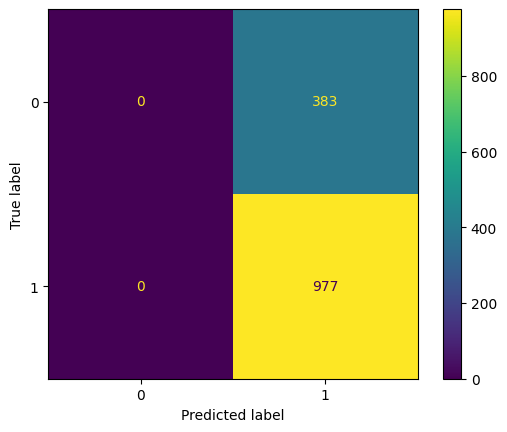

In [852]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov a word frequency

In [853]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100, gamma='auto', kernel='poly')

In [854]:

y_pred_train = model.predict(X_train_combined3_out_svc)

In [855]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [856]:
y_pred = model.predict(X_test_combined3_out_svc)

In [857]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [858]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8360294117647059
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.70      0.73      0.72       383
           1       0.89      0.88      0.88       977

    accuracy                           0.84      1360
   macro avg       0.80      0.80      0.80      1360
weighted avg       0.84      0.84      0.84      1360



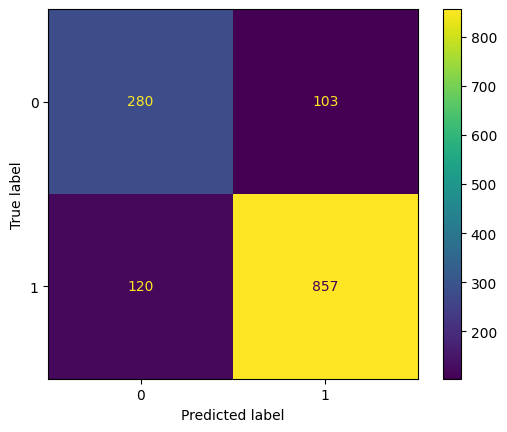

In [859]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov a tfidf word frequency

In [860]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100, gamma='auto', kernel='poly')

In [861]:

y_pred_train = model.predict(X_train_combined4_out_svc)

In [862]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6979823455233292
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [863]:
y_pred = model.predict(X_test_combined4_out_svc)

In [864]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [865]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7183823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

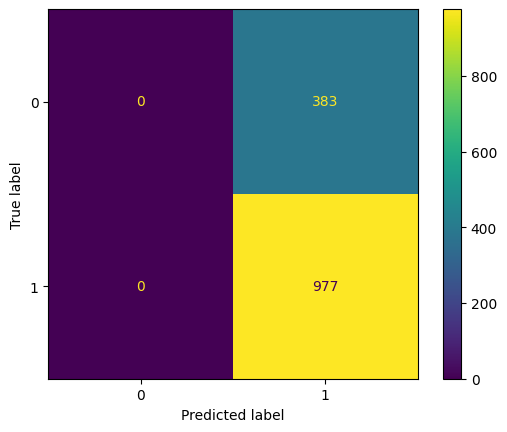

In [866]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - so skalovanim

In [867]:
model = SVC()
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train_scaled_svc, y_train)
print("Najlepšie parametre:", grid_search.best_params_)
print("Najlepšie skóre:", grid_search.best_score_)

Najlepšie parametre: {'C': 100, 'coef0': 1.0, 'gamma': 'auto', 'kernel': 'poly'}
Najlepšie skóre: 0.7629181052683872


In [868]:
best_model = grid_search.best_estimator_
y_pred_train = best_model.predict(X_train_scaled_svc)

In [869]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7717528373266078
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.75      0.37      0.49       958
           1       0.78      0.95      0.85      2214

    accuracy                           0.77      3172
   macro avg       0.76      0.66      0.67      3172
weighted avg       0.77      0.77      0.74      3172



In [870]:
y_pred = best_model.predict(X_test_scaled_svc)

In [871]:
results_list3_svc.append({
        'best_score': grid_search.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [872]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7683823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.67      0.34      0.46       383
           1       0.78      0.93      0.85       977

    accuracy                           0.77      1360
   macro avg       0.73      0.64      0.65      1360
weighted avg       0.75      0.77      0.74      1360



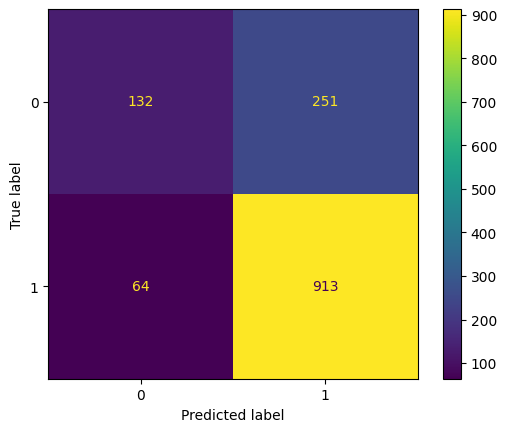

In [873]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - so skalovanim a ngram

In [874]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_scaled_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100, coef0=1.0, gamma='auto', kernel='poly')

In [875]:

y_pred_train = model.predict(X_train_combined_scaled_svc)

In [876]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [877]:
y_pred = model.predict(X_test_combined_scaled_svc)

In [878]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [879]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8639705882352942
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.77      0.74      0.75       383
           1       0.90      0.91      0.91       977

    accuracy                           0.86      1360
   macro avg       0.83      0.83      0.83      1360
weighted avg       0.86      0.86      0.86      1360



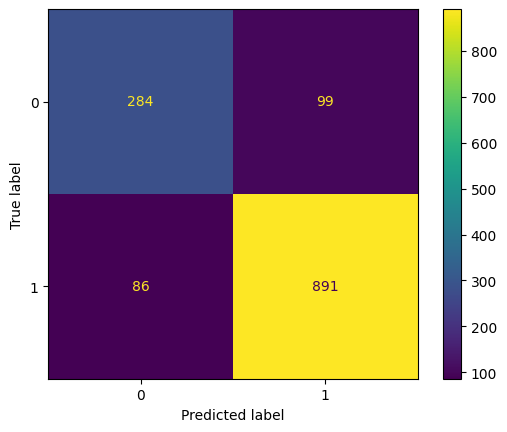

In [880]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - so skalovanim a tfidf ngram

In [881]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_scaled_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100, coef0=1.0, gamma='auto', kernel='poly')

In [882]:
y_pred_train = model.predict(X_train_combined2_scaled_svc)

In [883]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8502522068095839
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.61      0.71       958
           1       0.85      0.95      0.90      2214

    accuracy                           0.85      3172
   macro avg       0.85      0.78      0.80      3172
weighted avg       0.85      0.85      0.84      3172



In [884]:
y_pred = model.predict(X_test_combined2_scaled_svc)

In [885]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [886]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8544117647058823
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.84      0.60      0.70       383
           1       0.86      0.96      0.90       977

    accuracy                           0.85      1360
   macro avg       0.85      0.78      0.80      1360
weighted avg       0.85      0.85      0.85      1360



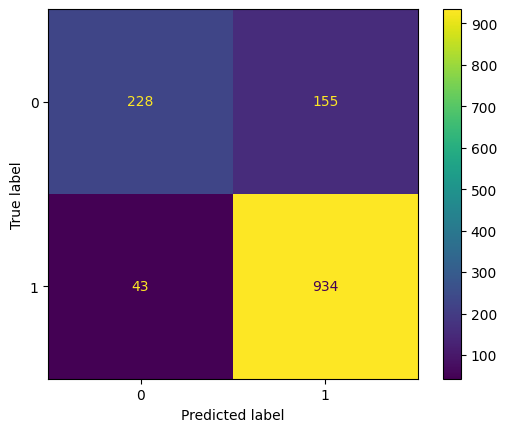

In [887]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - so skalovanim a word frequency

In [888]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_scaled_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100, coef0=1.0, gamma='auto', kernel='poly')

In [889]:

y_pred_train = model.predict(X_train_combined3_scaled_svc)

In [890]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [891]:
y_pred = model.predict(X_test_combined3_scaled_svc)

In [892]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [893]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.836764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.70      0.72      0.71       383
           1       0.89      0.88      0.89       977

    accuracy                           0.84      1360
   macro avg       0.80      0.80      0.80      1360
weighted avg       0.84      0.84      0.84      1360



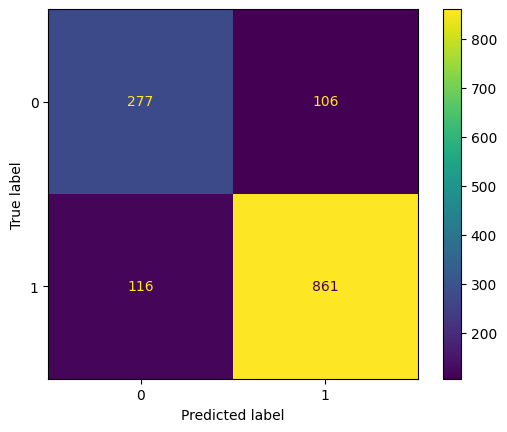

In [894]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - so skalovanim a tfidf word frequency

In [895]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_scaled_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100, coef0=1.0, gamma='auto', kernel='poly')

In [896]:
y_pred_train = model.predict(X_train_combined4_scaled_svc)

In [897]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8527742749054225
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.61      0.72       958
           1       0.85      0.96      0.90      2214

    accuracy                           0.85      3172
   macro avg       0.86      0.78      0.81      3172
weighted avg       0.85      0.85      0.84      3172



In [898]:
y_pred = model.predict(X_test_combined4_scaled_svc)

In [899]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [900]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8588235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.60      0.71       383
           1       0.86      0.96      0.91       977

    accuracy                           0.86      1360
   macro avg       0.86      0.78      0.81      1360
weighted avg       0.86      0.86      0.85      1360



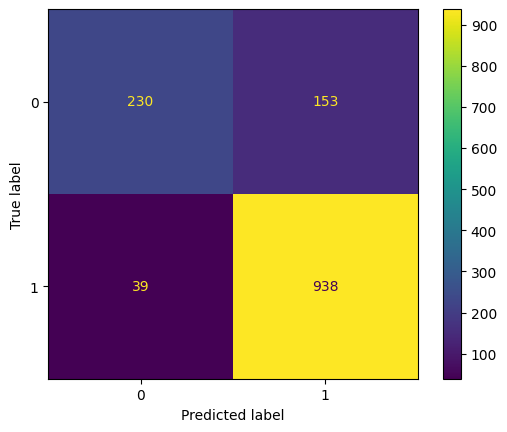

In [901]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov a so skalovanim 

In [902]:
model = SVC()
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train_scal_out_svc, y_train)
print("Najlepšie parametre:", grid_search.best_params_)
print("Najlepšie skóre:", grid_search.best_score_)

Najlepšie parametre: {'C': 100, 'coef0': 0.0, 'gamma': 'auto', 'kernel': 'poly'}
Najlepšie skóre: 0.7972920340793362


In [903]:
best_model = grid_search.best_estimator_
y_pred_train = best_model.predict(X_train_scal_out_svc)

In [904]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8244010088272383
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.79      0.57      0.66       958
           1       0.84      0.93      0.88      2214

    accuracy                           0.82      3172
   macro avg       0.81      0.75      0.77      3172
weighted avg       0.82      0.82      0.82      3172



In [905]:
y_pred = best_model.predict(X_test_scal_out_svc)

In [906]:
results_list3_svc.append({
        'best_score': grid_search.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [907]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7889705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.67      0.50      0.57       383
           1       0.82      0.90      0.86       977

    accuracy                           0.79      1360
   macro avg       0.74      0.70      0.72      1360
weighted avg       0.78      0.79      0.78      1360



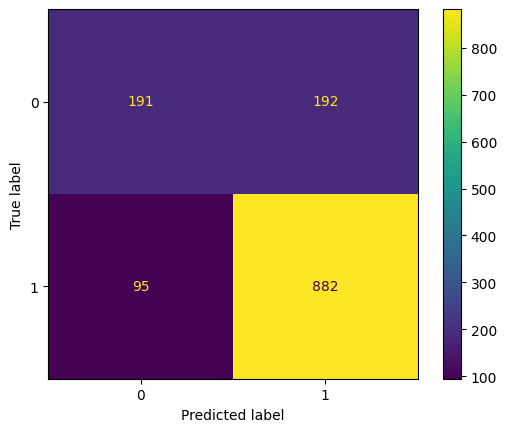

In [908]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov a so skalovanim a ngram

In [909]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_scal_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100, gamma='auto', kernel='poly')

In [910]:
y_pred_train = model.predict(X_train_combined_scal_out_svc)

In [911]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [912]:
y_pred = model.predict(X_test_combined_scal_out_svc)

In [913]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [914]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8522058823529411
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.73      0.74      0.74       383
           1       0.90      0.89      0.90       977

    accuracy                           0.85      1360
   macro avg       0.82      0.82      0.82      1360
weighted avg       0.85      0.85      0.85      1360



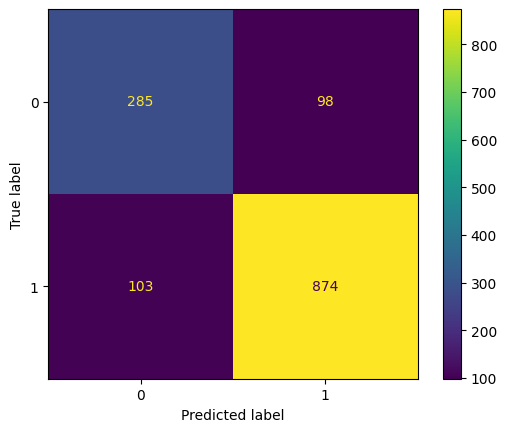

In [915]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov a so skalovanim a tfidf n-gram

In [916]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_scal_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100, gamma='auto', kernel='poly')

In [917]:
y_pred_train = model.predict(X_train_combined2_scal_out_svc)

In [918]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6979823455233292
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [919]:
y_pred = model.predict(X_test_combined2_scal_out_svc)

In [920]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [921]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7183823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

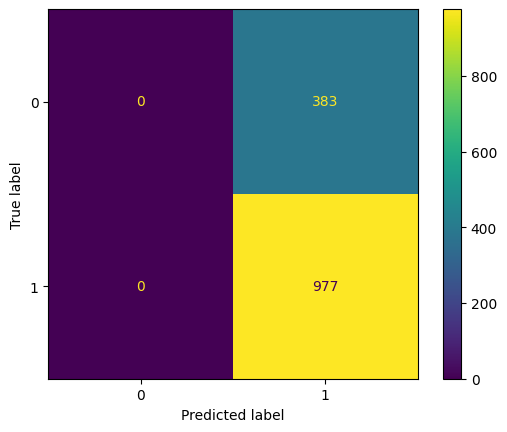

In [922]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov a so skalovanim a word frequency

In [923]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_scal_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100, gamma='auto', kernel='poly')

In [924]:
y_pred_train = model.predict(X_train_combined3_scal_out_svc)

In [925]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [926]:
y_pred = model.predict(X_test_combined3_scal_out_svc)

In [927]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [928]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8360294117647059
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.70      0.73      0.72       383
           1       0.89      0.88      0.88       977

    accuracy                           0.84      1360
   macro avg       0.80      0.80      0.80      1360
weighted avg       0.84      0.84      0.84      1360



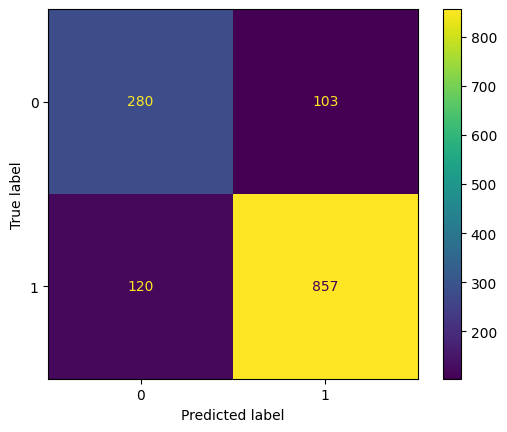

In [929]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov a so skalovanim a tfidf word frequency

In [930]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_scal_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100, gamma='auto', kernel='poly')

In [931]:
y_pred_train = model.predict(X_train_combined4_scal_out_svc)

In [932]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.6979823455233292
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       958
           1       0.70      1.00      0.82      2214

    accuracy                           0.70      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.49      0.70      0.57      3172



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [933]:
y_pred = model.predict(X_test_combined4_scal_out_svc)

In [934]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [935]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7183823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       383
           1       0.72      1.00      0.84       977

    accuracy                           0.72      1360
   macro avg       0.36      0.50      0.42      1360
weighted avg       0.52      0.72      0.60      1360



C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Martin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

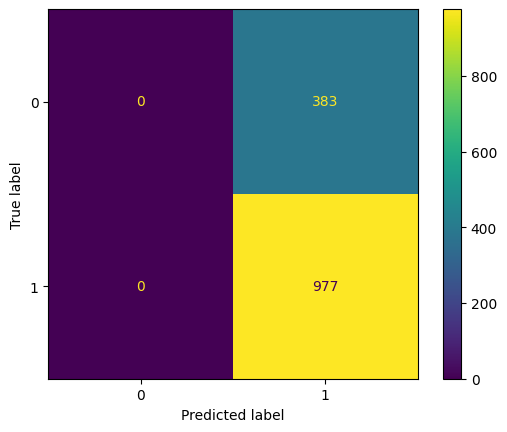

In [936]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

In [937]:
results_svc3 = pd.DataFrame(results_list3_svc)
print(results_svc3)

    best_score  accuracy_train  accuracy_test  precision_train  \
0     0.771115        0.803909       0.776471         0.805449   
1          NaN        1.000000       0.867647         1.000000   
2          NaN        0.802648       0.811029         0.796933   
3          NaN        1.000000       0.838235         1.000000   
4          NaN        0.801702       0.809559         0.795378   
5     0.797292        0.824401       0.788971         0.835018   
6          NaN        1.000000       0.865441         1.000000   
7          NaN        0.697982       0.718382         0.697982   
8          NaN        1.000000       0.836029         1.000000   
9          NaN        0.697982       0.718382         0.697982   
10    0.762918        0.771753       0.768382         0.775926   
11         NaN        1.000000       0.863971         1.000000   
12         NaN        0.850252       0.854412         0.849337   
13         NaN        1.000000       0.836765         1.000000   
14        

Najlepšie výsledky nám priniesli datasety s ošetrenými outliermi a s ošetrenými outliermi a škálovaním. Niektoré presnosti sa znížili, lebo sme na nich nevykonali gridsearch a použili sme na nich neefektívne hyperparametre.

RANDOM FOREST - bez osetrenia outlierov a skalovania

In [938]:
results_list3_rf=[]

Určenie hyperparametrov, ktore budeme v grid search skúšať

In [939]:
param_grid = {
    'n_estimators': [10, 50, 100, 200],  # Počet stromov v lese
    'max_depth': [None, 10, 20, 30, 40],  # Maximálna hĺbka stromu
    'min_samples_split': [2, 5, 10],  # Minimálny počet vzoriek potrebný na rozdelenie uzla
    'min_samples_leaf': [1, 2, 4]  # Minimálny počet vzoriek potrebný v listovom uzle
}

Grid search - bude skúšať všetky kombinácie hyperparametrov a vyberie tie najlepšie pre accuracy

In [940]:
model = RandomForestClassifier()
grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=-1)
grid_search_rf.fit(X_train_rf, y_train)
print("Najlepší hyperparametre:", grid_search_rf.best_params_)
print("Najlepší skóre:", grid_search_rf.best_score_)

Najlepší hyperparametre: {'max_depth': 40, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}
Najlepší skóre: 0.7771082242479943


Predikovanie na trenovacich datach

In [941]:
best_rf_model = grid_search_rf.best_estimator_
y_pred_train_rf = best_rf_model.predict(X_train_rf)

In [942]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9965321563682219
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      0.99      1.00      3172
weighted avg       1.00      1.00      1.00      3172



Predikovanie na testovacich datach

In [943]:
y_pred_rf = best_rf_model.predict(X_test_rf)

In [944]:
results_list3_rf.append({
        'best_score': grid_search_rf.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [945]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.7713235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.69      0.34      0.46       383
           1       0.78      0.94      0.86       977

    accuracy                           0.77      1360
   macro avg       0.74      0.64      0.66      1360
weighted avg       0.76      0.77      0.74      1360



Vizualizácia výkonnosti modelu

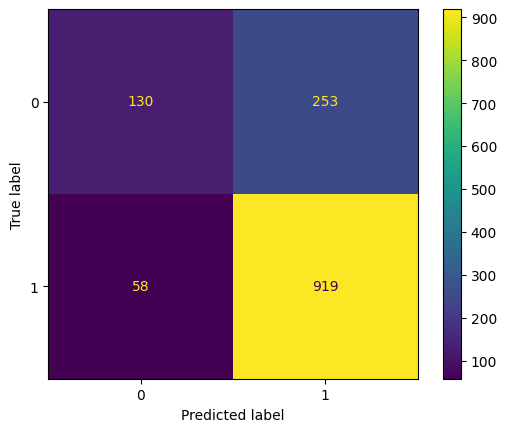

In [946]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - bez osetrenia outlierov a skalovania s ngram

In [947]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=40, min_samples_leaf=2, min_samples_split=5,
                       n_estimators=200)

In [948]:
y_pred_train_rf = model.predict(X_train_combined_rf)

In [949]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9996847414880202
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [950]:
y_pred_rf = model.predict(X_test_combined_rf)

In [951]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [952]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8514705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.55      0.67       383
           1       0.85      0.97      0.90       977

    accuracy                           0.85      1360
   macro avg       0.86      0.76      0.79      1360
weighted avg       0.86      0.85      0.84      1360



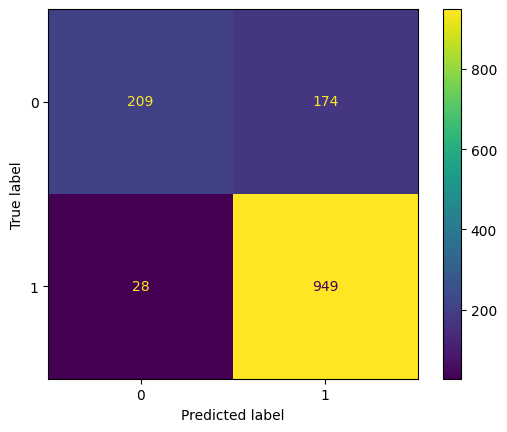

In [953]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - bez osetrenia outlierov a skalovania a tfidf gram

In [954]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=40, min_samples_leaf=2, min_samples_split=5,
                       n_estimators=200)

In [955]:
y_pred_train_rf = model.predict(X_train_combined2_rf)

In [956]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9996847414880202
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [957]:
y_pred_rf = model.predict(X_test_combined2_rf)

In [958]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [959]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8566176470588235
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.58      0.69       383
           1       0.85      0.97      0.91       977

    accuracy                           0.86      1360
   macro avg       0.86      0.77      0.80      1360
weighted avg       0.86      0.86      0.85      1360



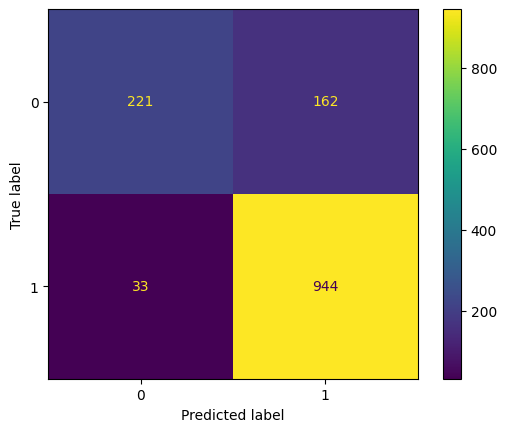

In [960]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - bez osetrenia outlierov a skalovania a word frequency

In [961]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=40, min_samples_leaf=2, min_samples_split=5,
                       n_estimators=200)

In [962]:
y_pred_train_rf = model.predict(X_train_combined3_rf)

In [963]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9993694829760403
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [964]:
y_pred_rf = model.predict(X_test_combined3_rf)

In [965]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [966]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8558823529411764
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.56      0.69       383
           1       0.85      0.97      0.91       977

    accuracy                           0.86      1360
   macro avg       0.87      0.77      0.80      1360
weighted avg       0.86      0.86      0.84      1360



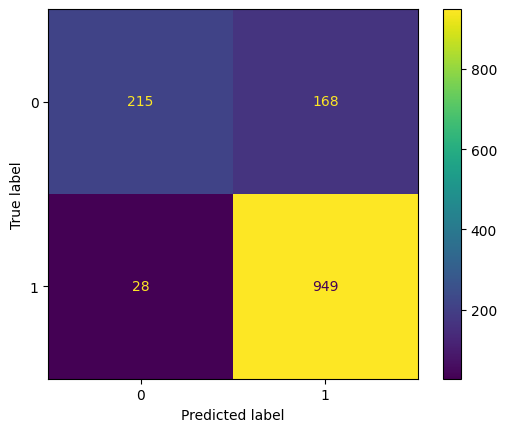

In [967]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - bez osetrenia outlierov a skalovania a tfidf word frequency

In [968]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=40, min_samples_leaf=2, min_samples_split=5,
                       n_estimators=200)

In [969]:
y_pred_train_rf = model.predict(X_train_combined4_rf)

In [970]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9990542244640606
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [971]:
y_pred_rf = model.predict(X_test_combined4_rf)

In [972]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [973]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8588235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.57      0.70       383
           1       0.85      0.97      0.91       977

    accuracy                           0.86      1360
   macro avg       0.87      0.77      0.80      1360
weighted avg       0.86      0.86      0.85      1360



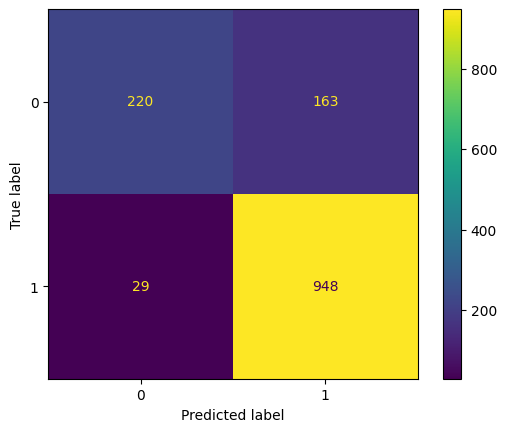

In [974]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenim outlierov

In [975]:
model = RandomForestClassifier()
grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=-1)
grid_search_rf.fit(X_train_out_rf, y_train)
print("Najlepší hyperparametre:", grid_search_rf.best_params_)
print("Najlepší skóre:", grid_search_rf.best_score_)

Najlepší hyperparametre: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Najlepší skóre: 0.9101482898233936


In [976]:
best_rf_model = grid_search_rf.best_estimator_
y_pred_train_rf = best_rf_model.predict(X_train_out_rf)

In [977]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [978]:
y_pred_rf = best_rf_model.predict(X_test_out_rf)

In [979]:
results_list3_rf.append({
        'best_score': grid_search_rf.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [980]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.9161764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.78      0.84       383
           1       0.92      0.97      0.94       977

    accuracy                           0.92      1360
   macro avg       0.92      0.87      0.89      1360
weighted avg       0.92      0.92      0.91      1360



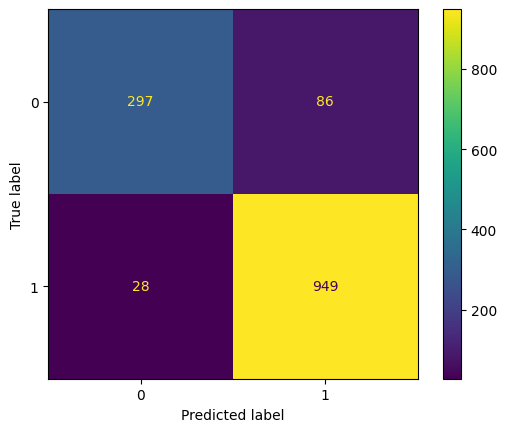

In [981]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenim outlierov a ngram

In [982]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=30, n_estimators=200)

In [983]:
y_pred_train_rf = model.predict(X_train_combined_out_rf)

In [984]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [985]:
y_pred_rf = model.predict(X_test_combined_out_rf)

In [986]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [987]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8794117647058823
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.62      0.74       383
           1       0.87      0.98      0.92       977

    accuracy                           0.88      1360
   macro avg       0.90      0.80      0.83      1360
weighted avg       0.88      0.88      0.87      1360



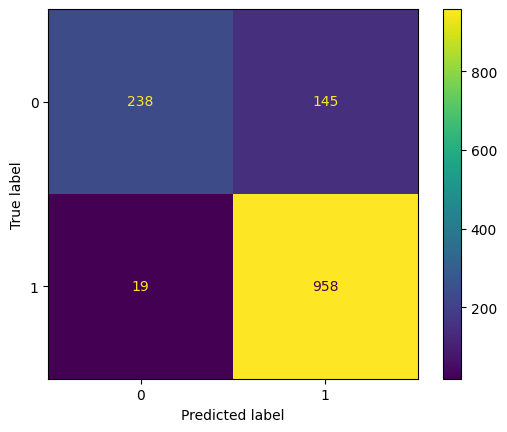

In [988]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenim outlierov a tfidf ngram

In [989]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=30, n_estimators=200)

In [990]:
y_pred_train_rf = model.predict(X_train_combined2_out_rf)

In [991]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [992]:
y_pred_rf = model.predict(X_test_combined2_out_rf)

In [993]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [994]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.9007352941176471
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.70      0.80       383
           1       0.89      0.98      0.93       977

    accuracy                           0.90      1360
   macro avg       0.91      0.84      0.87      1360
weighted avg       0.90      0.90      0.90      1360



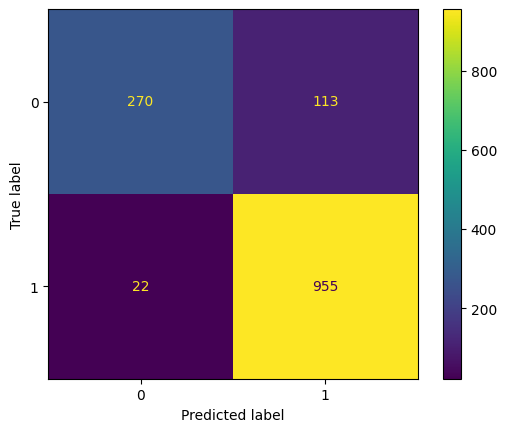

In [995]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenim outlierov a word frequency

In [996]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=30, n_estimators=200)

In [997]:
y_pred_train_rf = model.predict(X_train_combined3_out_rf)

In [998]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [999]:
y_pred_rf = model.predict(X_test_combined3_out_rf)

In [1000]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1001]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.9169117647058823
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.75      0.84       383
           1       0.91      0.98      0.94       977

    accuracy                           0.92      1360
   macro avg       0.93      0.87      0.89      1360
weighted avg       0.92      0.92      0.91      1360



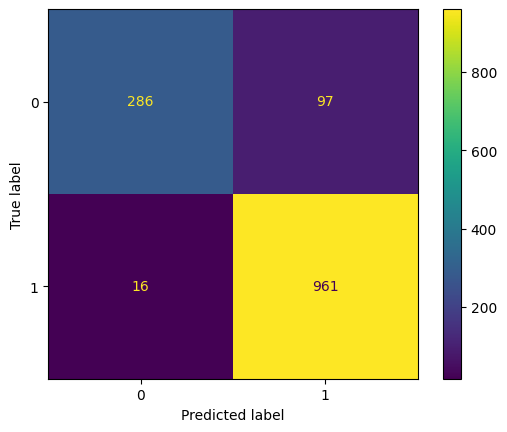

In [1002]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenim outlierov a tfidf word frequency

In [1003]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=30, n_estimators=200)

In [1004]:
y_pred_train_rf = model.predict(X_train_combined4_out_rf)

In [1005]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1006]:
y_pred_rf = model.predict(X_test_combined4_out_rf)

In [1007]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1008]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.9073529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.71      0.81       383
           1       0.90      0.99      0.94       977

    accuracy                           0.91      1360
   macro avg       0.92      0.85      0.87      1360
weighted avg       0.91      0.91      0.90      1360



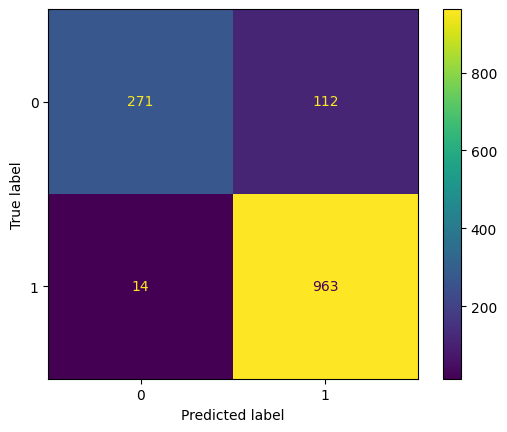

In [1009]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - so skalovanim

In [1010]:
model = RandomForestClassifier()
grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=-1)
grid_search_rf.fit(X_train_scaled_rf, y_train)
print("Najlepší hyperparametre:", grid_search_rf.best_params_)
print("Najlepší skóre:", grid_search_rf.best_score_)

Najlepší hyperparametre: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Najlepší skóre: 0.7777401326411486


In [1011]:
best_rf_model = grid_search_rf.best_estimator_
y_pred_train_rf = best_rf_model.predict(X_train_scaled_rf)

In [1012]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1013]:
y_pred_rf = best_rf_model.predict(X_test_scaled_rf)

In [1014]:
results_list3_rf.append({
        'best_score': grid_search_rf.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1015]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.7772058823529412
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.70      0.37      0.48       383
           1       0.79      0.94      0.86       977

    accuracy                           0.78      1360
   macro avg       0.74      0.65      0.67      1360
weighted avg       0.76      0.78      0.75      1360



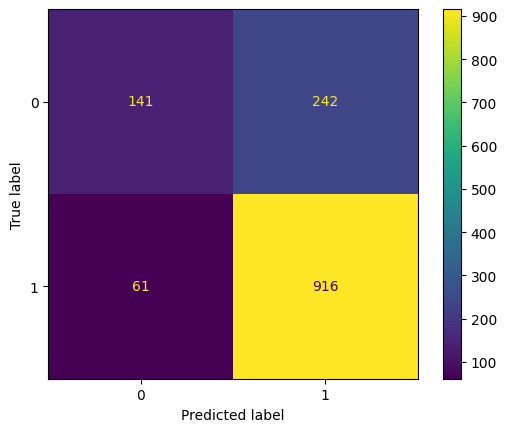

In [1016]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - so skalovanim a ngram

In [1017]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_scaled_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=20, n_estimators=200)

In [1018]:
y_pred_train_rf = model.predict(X_train_combined_scaled_rf)

In [1019]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1020]:
y_pred_rf = model.predict(X_test_combined_scaled_rf)

In [1021]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1022]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8536764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.54      0.68       383
           1       0.84      0.98      0.91       977

    accuracy                           0.85      1360
   macro avg       0.87      0.76      0.79      1360
weighted avg       0.86      0.85      0.84      1360



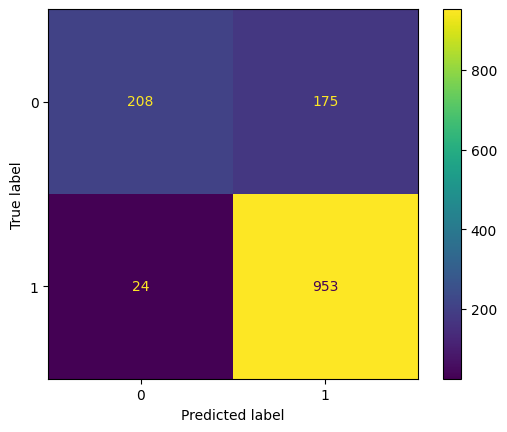

In [1023]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - so skalovanim a tfidf ngram

In [1024]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_scaled_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=20, n_estimators=200)

In [1025]:
y_pred_train_rf = model.predict(X_train_combined2_scaled_rf)

In [1026]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1027]:
y_pred_rf = model.predict(X_test_combined2_scaled_rf)

In [1028]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1029]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8573529411764705
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.59      0.70       383
           1       0.86      0.96      0.91       977

    accuracy                           0.86      1360
   macro avg       0.86      0.78      0.80      1360
weighted avg       0.86      0.86      0.85      1360



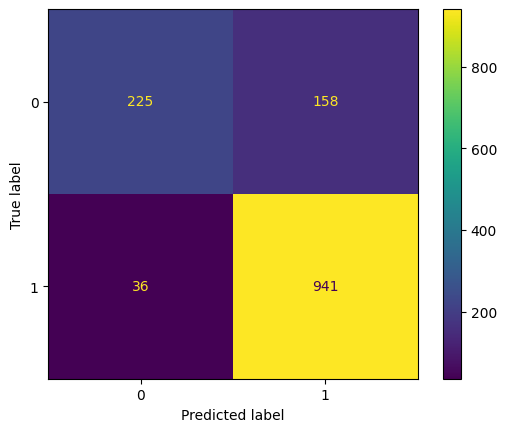

In [1030]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - so skalovanim a word frequency

In [1031]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_scaled_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=20, n_estimators=200)

In [1032]:
y_pred_train_rf = model.predict(X_train_combined3_scaled_rf)

In [1033]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1034]:
y_pred_rf = model.predict(X_test_combined3_scaled_rf)

In [1035]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })


In [1036]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8625
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.60      0.71       383
           1       0.86      0.97      0.91       977

    accuracy                           0.86      1360
   macro avg       0.87      0.78      0.81      1360
weighted avg       0.86      0.86      0.85      1360



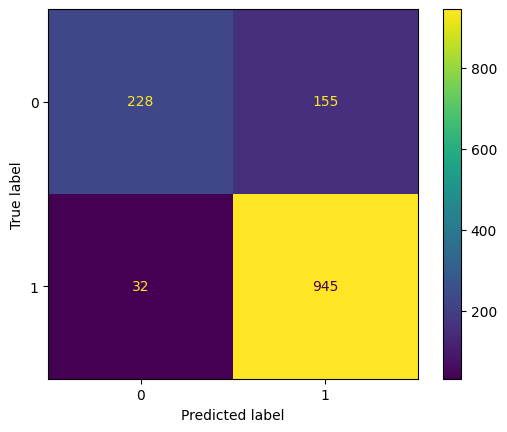

In [1037]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - so skalovanim a tfidf word frequency

In [1038]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_scaled_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=20, n_estimators=200)

In [1039]:
y_pred_train_rf = model.predict(X_train_combined4_scaled_rf)

In [1040]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1041]:
y_pred_rf = model.predict(X_test_combined4_scaled_rf)

In [1042]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })


In [1043]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8595588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.59      0.70       383
           1       0.86      0.97      0.91       977

    accuracy                           0.86      1360
   macro avg       0.86      0.78      0.81      1360
weighted avg       0.86      0.86      0.85      1360



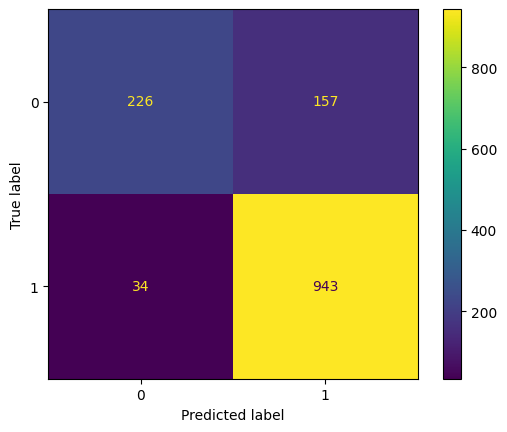

In [1044]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenymi outliermi a skalovanim

In [1045]:
model = RandomForestClassifier()
grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=-1)
grid_search_rf.fit(X_train_scal_out_rf, y_train)
print("Najlepší hyperparametre:", grid_search_rf.best_params_)
print("Najlepší skóre:", grid_search_rf.best_score_)

Najlepší hyperparametre: {'max_depth': 40, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}
Najlepší skóre: 0.9079361136640254


In [1046]:
best_rf_model = grid_search_rf.best_estimator_
y_pred_train_rf = best_rf_model.predict(X_train_scal_out_rf)

In [1047]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9996847414880202
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1048]:
y_pred_rf = best_rf_model.predict(X_test_scal_out_rf)

In [1049]:
results_list3_rf.append({
        'best_score': grid_search_rf.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1050]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.913235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.77      0.83       383
           1       0.91      0.97      0.94       977

    accuracy                           0.91      1360
   macro avg       0.91      0.87      0.89      1360
weighted avg       0.91      0.91      0.91      1360



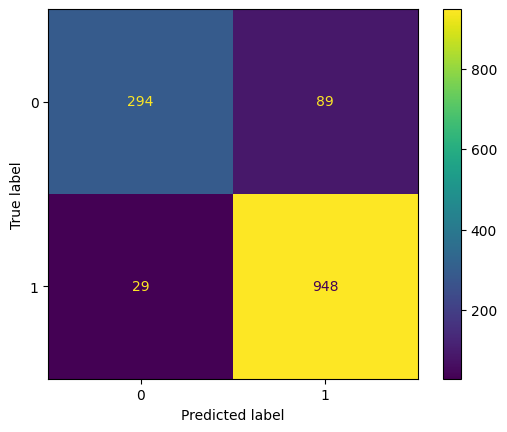

In [1051]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenymi outliermi a skalovanim a ngram

In [1052]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_scal_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=40, min_samples_split=5)

In [1053]:
y_pred_train_rf = model.predict(X_train_combined_scal_out_rf)

In [1054]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1055]:
y_pred_rf = model.predict(X_test_combined_scal_out_rf)

In [1056]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1057]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8794117647058823
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.64      0.75       383
           1       0.87      0.97      0.92       977

    accuracy                           0.88      1360
   macro avg       0.89      0.81      0.83      1360
weighted avg       0.88      0.88      0.87      1360



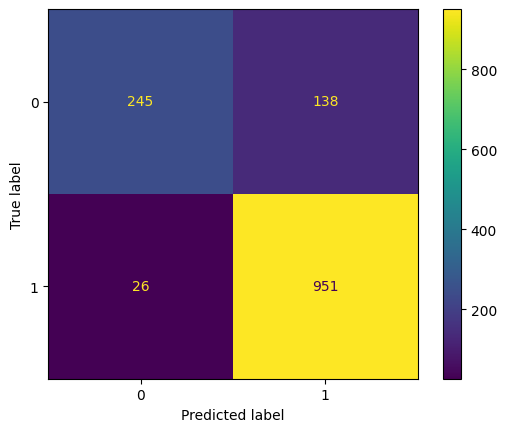

In [1058]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenymi outliermi a skalovanim a tfidf ngram

In [1059]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_scal_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=40, min_samples_split=5)

In [1060]:
y_pred_train_rf = model.predict(X_train_combined2_scal_out_rf)

In [1061]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1062]:
y_pred_rf = model.predict(X_test_combined2_scal_out_rf)

In [1063]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1064]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.9022058823529412
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.69      0.80       383
           1       0.89      0.98      0.94       977

    accuracy                           0.90      1360
   macro avg       0.92      0.84      0.87      1360
weighted avg       0.91      0.90      0.90      1360



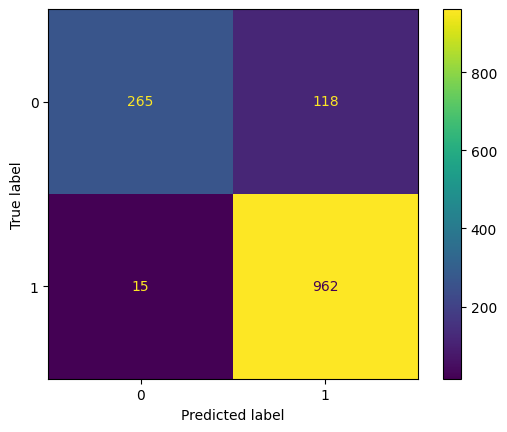

In [1065]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenymi outliermi a skalovanim a word frequency

In [1066]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_scal_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=40, min_samples_split=5)

In [1067]:
y_pred_train_rf = model.predict(X_train_combined3_scal_out_rf)

In [1068]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9996847414880202
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1069]:
y_pred_rf = model.predict(X_test_combined3_scal_out_rf)

In [1070]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1071]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.9044117647058824
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.72      0.81       383
           1       0.90      0.98      0.94       977

    accuracy                           0.90      1360
   macro avg       0.91      0.85      0.87      1360
weighted avg       0.91      0.90      0.90      1360



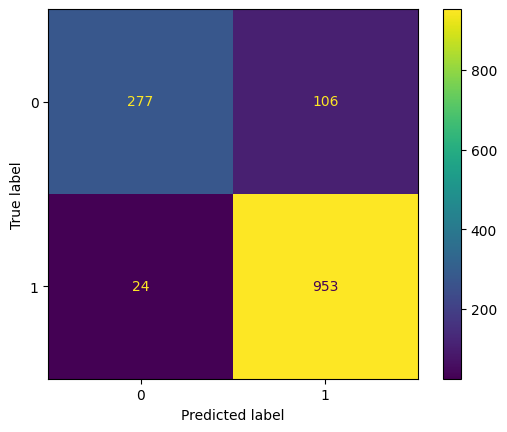

In [1072]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenymi outliermi a skalovanim a tfidf word frequency

In [1073]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_scal_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=40, min_samples_split=5)

In [1074]:
y_pred_train_rf = model.predict(X_train_combined4_scal_out_rf)

In [1075]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1076]:
y_pred_rf = model.predict(X_test_combined4_scal_out_rf)

In [1077]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })


In [1078]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.9
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.69      0.80       383
           1       0.89      0.98      0.93       977

    accuracy                           0.90      1360
   macro avg       0.91      0.84      0.87      1360
weighted avg       0.90      0.90      0.90      1360



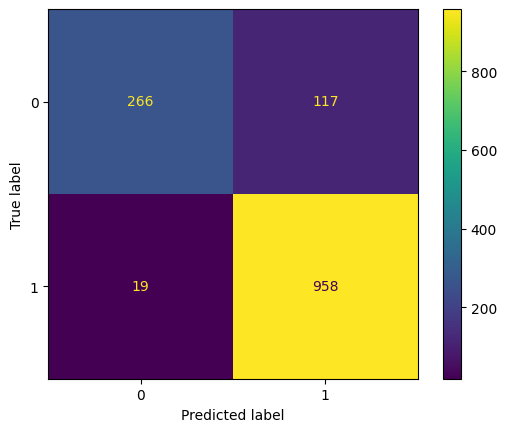

In [1079]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

In [1080]:
results_rf3 = pd.DataFrame(results_list3_rf)
print(results_rf3)

    best_score  accuracy_train  accuracy_test  precision_train  \
0     0.777108        0.996532       0.771324         0.997528   
1          NaN        0.999685       0.851471         0.999774   
2          NaN        0.999685       0.856618         0.999774   
3          NaN        0.999369       0.855882         0.999549   
4          NaN        0.999054       0.858824         0.999323   
5     0.910148        1.000000       0.916176         1.000000   
6          NaN        1.000000       0.879412         1.000000   
7          NaN        1.000000       0.900735         1.000000   
8          NaN        1.000000       0.916912         1.000000   
9          NaN        1.000000       0.907353         1.000000   
10    0.777740        1.000000       0.777206         1.000000   
11         NaN        1.000000       0.853676         1.000000   
12         NaN        1.000000       0.857353         1.000000   
13         NaN        1.000000       0.862500         1.000000   
14        

Najlepšie výsledky nám priniesli datasety s ošetrenými outliermi. Niektoré presnosti sa znížili, lebo sme na nich nevykonali gridsearch a použili sme na nich neefektívne hyperparametre.

GRADIENT BOOSTING CLASSIFIER - bez osetrenia outlierov a skalovania

In [1081]:
results_list3_gbm=[]

Určenie hyperparametrov, ktore budeme v grid search skúšať

In [1082]:
param_grid = {
    'n_estimators': [10, 50, 100, 200],  # Počet stromov v lese
    'max_depth': [None, 10, 20, 30, 40],  # Maximálna hĺbka stromu
    'min_samples_split': [2, 5, 10],  # Minimálny počet vzoriek potrebný na rozdelenie uzla
    'min_samples_leaf': [1, 2, 4]  # Minimálny počet vzoriek potrebný v listovom uzle
}

Grid search - vyskuša všetky kombinacie hyperparametrov a vyberie najlepší z nich podľa accuracy

In [1083]:
model = GradientBoostingClassifier()
grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=-1)
grid_search_gbm.fit(X_train_gbm, y_train)
print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
print("Najlepší skóre:", grid_search_gbm.best_score_)

Najlepší hyperparametre: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}
Najlepší skóre: 0.777110708164634


Predikovanie na trenovacich datach

In [1084]:
best_gbm_model = grid_search_gbm.best_estimator_
y_pred_train_gbm = best_gbm_model.predict(X_train_gbm)

In [1085]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



Predikovanie na testovacich datach

In [1086]:
y_pred_gbm = best_gbm_model.predict(X_test_gbm)

In [1087]:
results_list3_gbm.append({
        'best_score': grid_search_gbm.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1088]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.7772058823529412
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.65      0.45      0.53       383
           1       0.81      0.90      0.85       977

    accuracy                           0.78      1360
   macro avg       0.73      0.68      0.69      1360
weighted avg       0.76      0.78      0.76      1360



Vizualizácia výkonnosti modelu

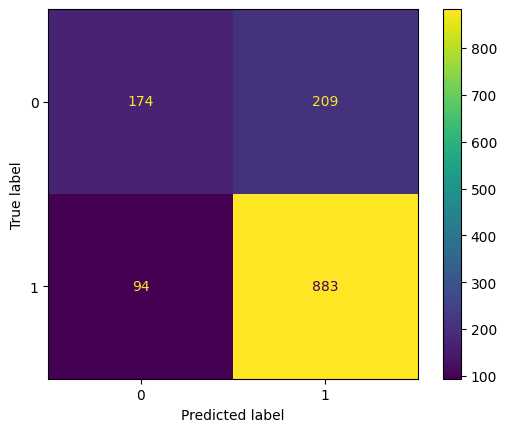

In [1089]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - bez osetrenia outlierov a skalovania a ngram

In [1090]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=2,
                           min_samples_split=10)

In [1091]:
y_pred_train_gbm = model.predict(X_train_combined_gbm)

In [1092]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1093]:
y_pred_gbm = model.predict(X_test_combined_gbm)

In [1094]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1095]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8926470588235295
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.75      0.80       383
           1       0.91      0.95      0.93       977

    accuracy                           0.89      1360
   macro avg       0.88      0.85      0.86      1360
weighted avg       0.89      0.89      0.89      1360



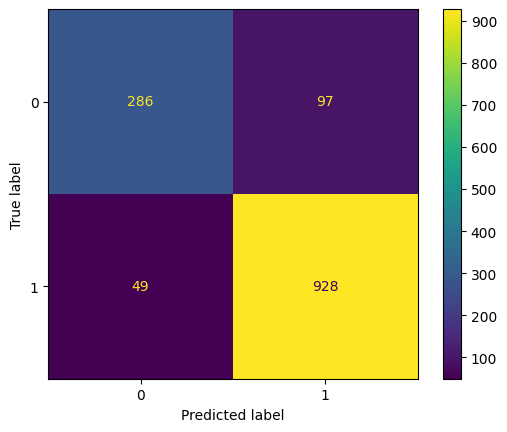

In [1096]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - bez osetrenia outlierov a skalovania a tfidf ngram

In [1097]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=2,
                           min_samples_split=10)

In [1098]:
y_pred_train_gbm = model.predict(X_train_combined2_gbm)

In [1099]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1100]:
y_pred_gbm = model.predict(X_test_combined2_gbm)

In [1101]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1102]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8779411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.73      0.77       383
           1       0.90      0.94      0.92       977

    accuracy                           0.88      1360
   macro avg       0.86      0.83      0.84      1360
weighted avg       0.88      0.88      0.88      1360



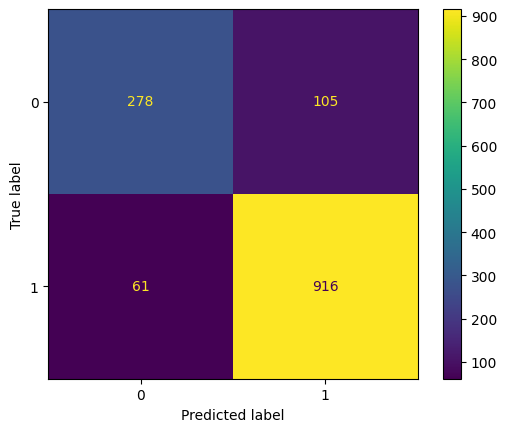

In [1103]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - bez osetrenia outlierov a skalovania a word frequency

In [1104]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=2,
                           min_samples_split=10)

In [1105]:
y_pred_train_gbm = model.predict(X_train_combined3_gbm)

In [1106]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1107]:
y_pred_gbm = model.predict(X_test_combined3_gbm)

In [1108]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1109]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8727941176470588
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.79      0.74      0.77       383
           1       0.90      0.93      0.91       977

    accuracy                           0.87      1360
   macro avg       0.85      0.83      0.84      1360
weighted avg       0.87      0.87      0.87      1360



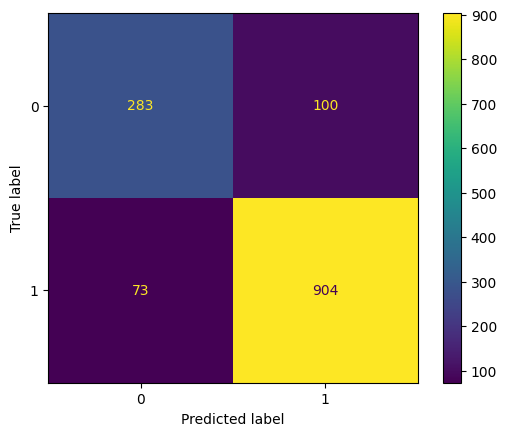

In [1110]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - bez osetrenia outlierov a skalovania a tfidf word frequency

In [1111]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=2,
                           min_samples_split=10)

In [1112]:
y_pred_train_gbm = model.predict(X_train_combined4_gbm)

In [1113]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1114]:
y_pred_gbm = model.predict(X_test_combined4_gbm)

In [1115]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1116]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8713235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.79      0.73      0.76       383
           1       0.90      0.93      0.91       977

    accuracy                           0.87      1360
   macro avg       0.85      0.83      0.84      1360
weighted avg       0.87      0.87      0.87      1360



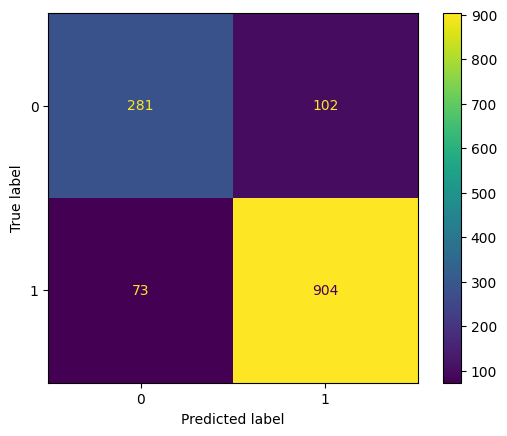

In [1117]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov

In [1118]:
model = GradientBoostingClassifier()
grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=-1)
grid_search_gbm.fit(X_train_out_gbm, y_train)
print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
print("Najlepší skóre:", grid_search_gbm.best_score_)

Najlepší hyperparametre: {'max_depth': 30, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 200}
Najlepší skóre: 0.9328493007774659


In [1119]:
best_gbm_model = grid_search_gbm.best_estimator_
y_pred_train_gbm = best_gbm_model.predict(X_train_out_gbm)

In [1120]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1121]:
y_pred_gbm = best_gbm_model.predict(X_test_out_gbm)

In [1122]:
results_list3_gbm.append({
        'best_score': grid_search_gbm.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1123]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9308823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.83      0.87       383
           1       0.93      0.97      0.95       977

    accuracy                           0.93      1360
   macro avg       0.93      0.90      0.91      1360
weighted avg       0.93      0.93      0.93      1360



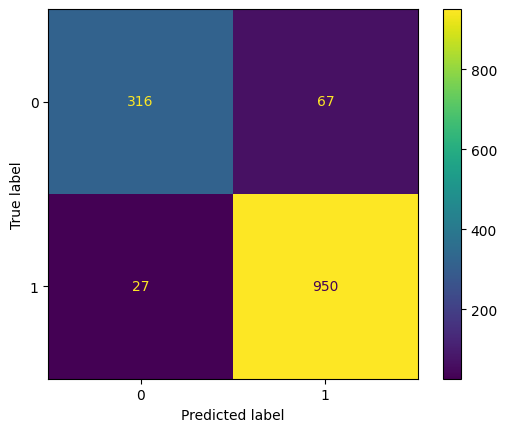

In [1124]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a ngram

In [1125]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=30, min_samples_leaf=4,
                           min_samples_split=5, n_estimators=200)

In [1126]:
y_pred_train_gbm = model.predict(X_train_combined_out_gbm)

In [1127]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1128]:
y_pred_gbm = model.predict(X_test_combined_out_gbm)

In [1129]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1130]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9404411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.84      0.89       383
           1       0.94      0.98      0.96       977

    accuracy                           0.94      1360
   macro avg       0.94      0.91      0.92      1360
weighted avg       0.94      0.94      0.94      1360



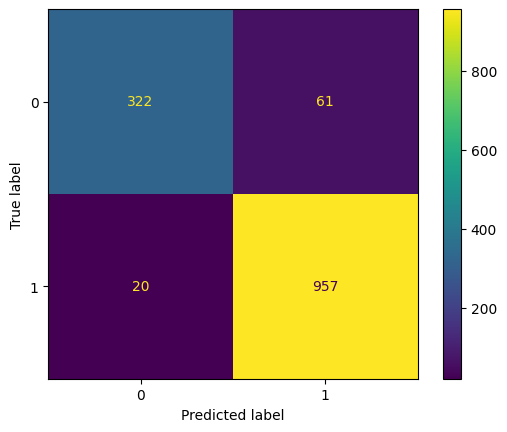

In [1131]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a tfidf ngram

In [1132]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=30, min_samples_leaf=4,
                           min_samples_split=5, n_estimators=200)

In [1133]:
y_pred_train_gbm = model.predict(X_train_combined2_out_gbm)

In [1134]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1135]:
y_pred_gbm = model.predict(X_test_combined2_out_gbm)

In [1136]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1137]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9382352941176471
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.85      0.89       383
           1       0.94      0.97      0.96       977

    accuracy                           0.94      1360
   macro avg       0.93      0.91      0.92      1360
weighted avg       0.94      0.94      0.94      1360



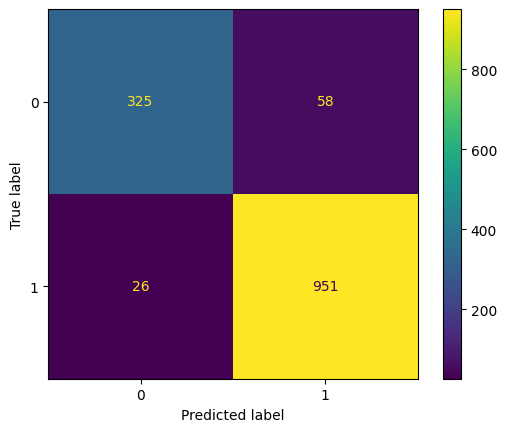

In [1138]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a word frequency

In [1139]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=30, min_samples_leaf=4,
                           min_samples_split=5, n_estimators=200)

In [1140]:
y_pred_train_gbm = model.predict(X_train_combined3_out_gbm)

In [1141]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1142]:
y_pred_gbm = model.predict(X_test_combined3_out_gbm)

In [1143]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1144]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9470588235294117
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.86      0.90       383
           1       0.95      0.98      0.96       977

    accuracy                           0.95      1360
   macro avg       0.95      0.92      0.93      1360
weighted avg       0.95      0.95      0.95      1360



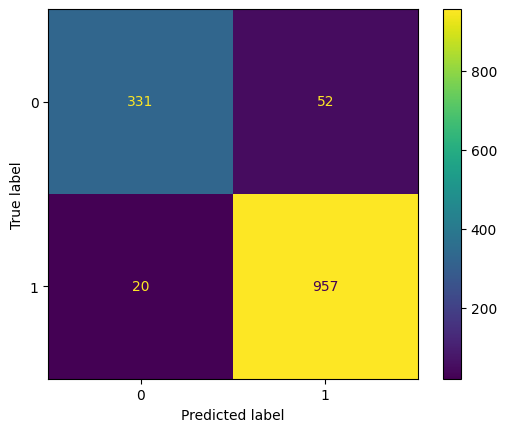

In [1145]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a tfidf word frequency

In [1146]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=30, min_samples_leaf=4,
                           min_samples_split=5, n_estimators=200)

In [1147]:
y_pred_train_gbm = model.predict(X_train_combined4_out_gbm)

In [1148]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1149]:
y_pred_gbm = model.predict(X_test_combined4_out_gbm)

In [1150]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1151]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9367647058823529
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.85      0.88       383
           1       0.94      0.97      0.96       977

    accuracy                           0.94      1360
   macro avg       0.93      0.91      0.92      1360
weighted avg       0.94      0.94      0.94      1360



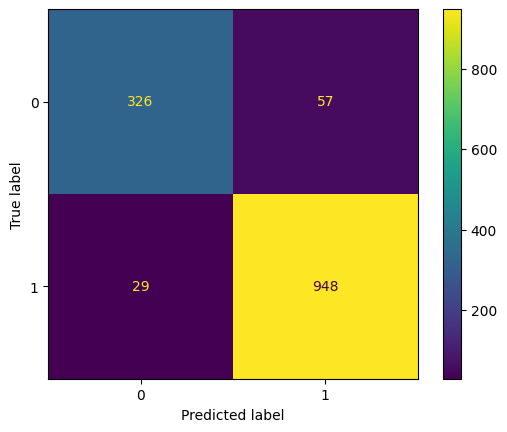

In [1152]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim

In [1153]:
model = GradientBoostingClassifier()
grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=-1)
grid_search_gbm.fit(X_train_scaled_gbm, y_train)
print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
print("Najlepší skóre:", grid_search_gbm.best_score_)

Najlepší hyperparametre: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 100}
Najlepší skóre: 0.772693310812489


In [1154]:
best_gbm_model = grid_search_gbm.best_estimator_
y_pred_train_gbm = best_gbm_model.predict(X_train_scaled_gbm)

In [1155]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1156]:
y_pred_gbm = best_gbm_model.predict(X_test_scaled_gbm)

In [1157]:
results_list3_gbm.append({
        'best_score': grid_search_gbm.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1158]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.7772058823529412
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.65      0.45      0.53       383
           1       0.81      0.91      0.85       977

    accuracy                           0.78      1360
   macro avg       0.73      0.68      0.69      1360
weighted avg       0.76      0.78      0.76      1360



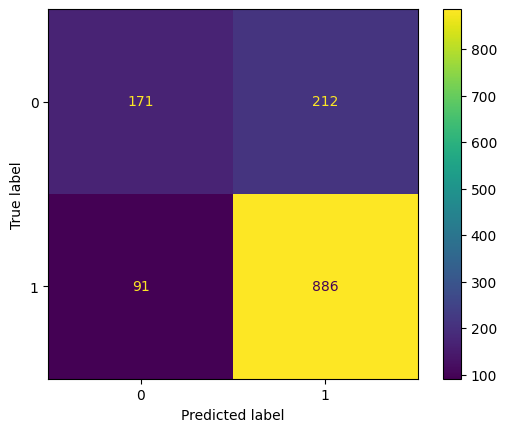

In [1159]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim a ngram

In [1160]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_scaled_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=None, min_samples_leaf=4,
                           min_samples_split=5)

In [1161]:
y_pred_train_gbm = model.predict(X_train_combined_scaled_gbm)

In [1162]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1163]:
y_pred_gbm = model.predict(X_test_combined_scaled_gbm)

In [1164]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1165]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8838235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.75      0.78       383
           1       0.90      0.94      0.92       977

    accuracy                           0.88      1360
   macro avg       0.86      0.84      0.85      1360
weighted avg       0.88      0.88      0.88      1360



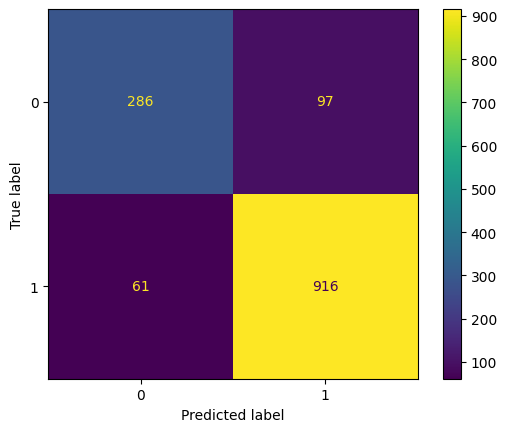

In [1166]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim a tfidf ngram

In [1167]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_scaled_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=None, min_samples_leaf=4,
                           min_samples_split=5)

In [1168]:
y_pred_train_gbm = model.predict(X_train_combined2_scaled_gbm)

In [1169]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1170]:
y_pred_gbm = model.predict(X_test_combined2_scaled_gbm)

In [1171]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1172]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8742647058823529
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.80      0.73      0.77       383
           1       0.90      0.93      0.91       977

    accuracy                           0.87      1360
   macro avg       0.85      0.83      0.84      1360
weighted avg       0.87      0.87      0.87      1360



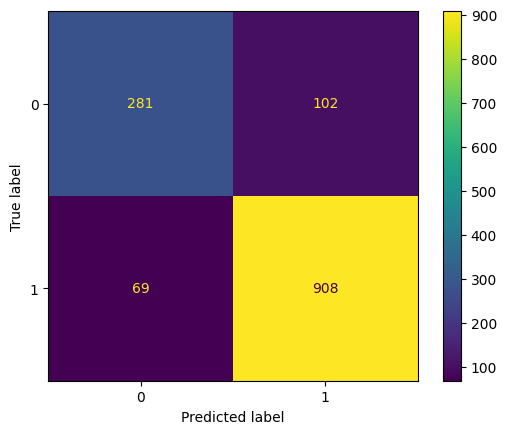

In [1173]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim a word frequency

In [1174]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_scaled_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=None, min_samples_leaf=4,
                           min_samples_split=5)

In [1175]:
y_pred_train_gbm = model.predict(X_train_combined3_scaled_gbm)

In [1176]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1177]:
y_pred_gbm = model.predict(X_test_combined3_scaled_gbm)

In [1178]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })


In [1179]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8764705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.80      0.74      0.77       383
           1       0.90      0.93      0.92       977

    accuracy                           0.88      1360
   macro avg       0.85      0.84      0.84      1360
weighted avg       0.87      0.88      0.87      1360



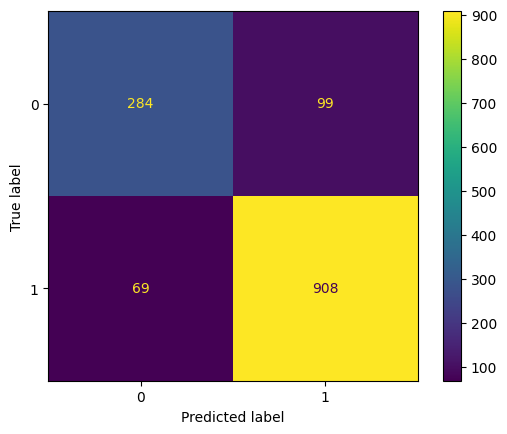

In [1180]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim a tfidf word frequency

In [1181]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_scaled_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=None, min_samples_leaf=4,
                           min_samples_split=5)

In [1182]:
y_pred_train_gbm = model.predict(X_train_combined4_scaled_gbm)

In [1183]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1184]:
y_pred_gbm = model.predict(X_test_combined4_scaled_gbm)

In [1185]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })


In [1186]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8772058823529412
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.81      0.74      0.77       383
           1       0.90      0.93      0.92       977

    accuracy                           0.88      1360
   macro avg       0.85      0.84      0.84      1360
weighted avg       0.87      0.88      0.88      1360



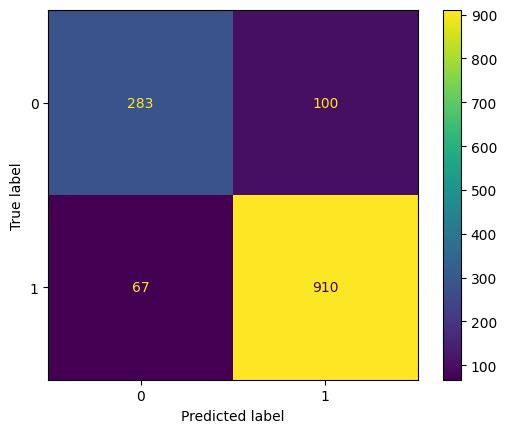

In [1187]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a skalovanim

In [1188]:
model = GradientBoostingClassifier()
grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=-1)
grid_search_gbm.fit(X_train_scal_out_gbm, y_train)
print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
print("Najlepší skóre:", grid_search_gbm.best_score_)

Najlepší hyperparametre: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 200}
Najlepší skóre: 0.9337951762338855


In [1189]:
best_gbm_model = grid_search_gbm.best_estimator_
y_pred_train_gbm = best_gbm_model.predict(X_train_scal_out_gbm)

In [1190]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1191]:
y_pred_gbm = best_gbm_model.predict(X_test_scal_out_gbm)

In [1192]:
results_list3_gbm.append({
        'best_score': grid_search_gbm.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1193]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9367647058823529
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.84      0.88       383
           1       0.94      0.98      0.96       977

    accuracy                           0.94      1360
   macro avg       0.94      0.91      0.92      1360
weighted avg       0.94      0.94      0.94      1360



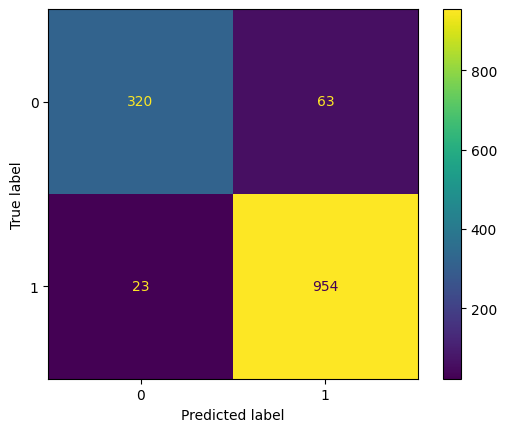

In [1194]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a skalovanim a ngram

In [1195]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_scal_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=4,
                           min_samples_split=10, n_estimators=200)

In [1196]:
y_pred_train_gbm = model.predict(X_train_combined_scal_out_gbm)

In [1197]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1198]:
y_pred_gbm = model.predict(X_test_combined_scal_out_gbm)

In [1199]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1200]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9514705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.86      0.91       383
           1       0.95      0.99      0.97       977

    accuracy                           0.95      1360
   macro avg       0.96      0.92      0.94      1360
weighted avg       0.95      0.95      0.95      1360



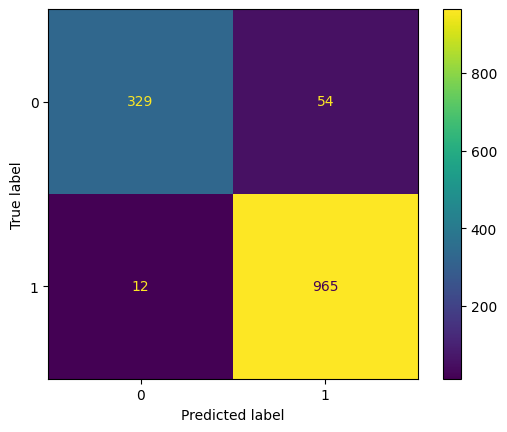

In [1201]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a skalovanim a tfidf ngram

In [1202]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_scal_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=4,
                           min_samples_split=10, n_estimators=200)

In [1203]:
y_pred_train_gbm = model.predict(X_train_combined2_scal_out_gbm)

In [1204]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1205]:
y_pred_gbm = model.predict(X_test_combined2_scal_out_gbm)

In [1206]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1207]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9433823529411764
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.86      0.90       383
           1       0.95      0.98      0.96       977

    accuracy                           0.94      1360
   macro avg       0.94      0.92      0.93      1360
weighted avg       0.94      0.94      0.94      1360



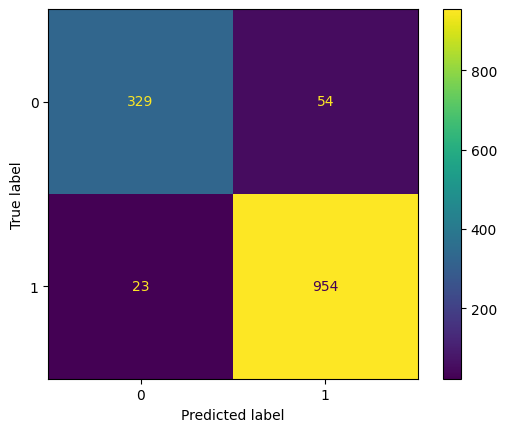

In [1208]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a skalovanim a word frequency

In [1209]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_scal_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=4,
                           min_samples_split=10, n_estimators=200)

In [1210]:
y_pred_train_gbm = model.predict(X_train_combined3_scal_out_gbm)

In [1211]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1212]:
y_pred_gbm = model.predict(X_test_combined3_scal_out_gbm)

In [1213]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })


In [1214]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9522058823529411
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.88      0.91       383
           1       0.95      0.98      0.97       977

    accuracy                           0.95      1360
   macro avg       0.95      0.93      0.94      1360
weighted avg       0.95      0.95      0.95      1360



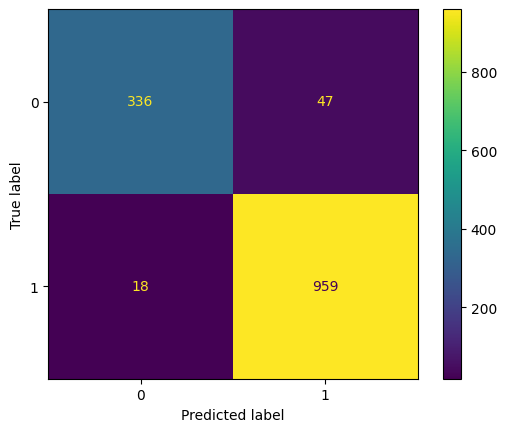

In [1215]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a skalovanim a tfidf word frequency

In [1216]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_scal_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=4,
                           min_samples_split=10, n_estimators=200)

In [1217]:
y_pred_train_gbm = model.predict(X_train_combined4_scal_out_gbm)

In [1218]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       958
           1       1.00      1.00      1.00      2214

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1219]:
y_pred_gbm = model.predict(X_test_combined4_scal_out_gbm)

In [1220]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })


In [1221]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9441176470588235
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.86      0.90       383
           1       0.95      0.98      0.96       977

    accuracy                           0.94      1360
   macro avg       0.94      0.92      0.93      1360
weighted avg       0.94      0.94      0.94      1360



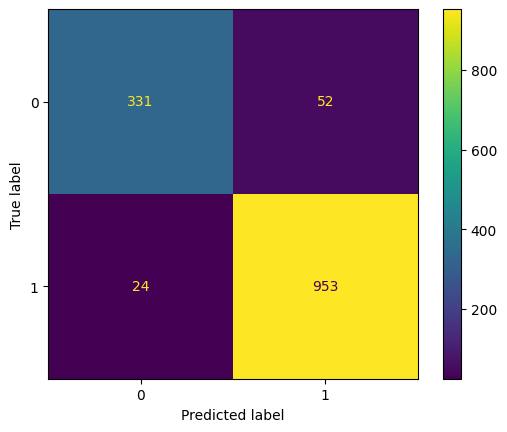

In [1222]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

In [1223]:
results_gbm3 = pd.DataFrame(results_list3_gbm)
print(results_gbm3)

    best_score  accuracy_train  accuracy_test  precision_train  \
0     0.777111             1.0       0.777206              1.0   
1          NaN             1.0       0.892647              1.0   
2          NaN             1.0       0.877941              1.0   
3          NaN             1.0       0.872794              1.0   
4          NaN             1.0       0.871324              1.0   
5     0.932849             1.0       0.930882              1.0   
6          NaN             1.0       0.940441              1.0   
7          NaN             1.0       0.938235              1.0   
8          NaN             1.0       0.947059              1.0   
9          NaN             1.0       0.936765              1.0   
10    0.772693             1.0       0.777206              1.0   
11         NaN             1.0       0.883824              1.0   
12         NaN             1.0       0.874265              1.0   
13         NaN             1.0       0.876471              1.0   
14        

Najlepšie výsledky nám priniesli datasety s ošetrenými outliermi a s ošetrenými outliermi a škálovaním. Niektoré presnosti sa znížili, lebo sme na nich nevykonali gridsearch a použili sme na nich neefektívne hyperparametre. Model sa nám taktiež pretrénoval na niektorých prípadoch

In [1224]:
row_names = ['bez osetrenia outlierov a skalovania', 'bez osetrenia outlierov a skalovania s ngramami', 'bez osetrenia outlierov a skalovania s tfidf ngramami', 'bez osetrenia outlierov a skalovania s word frequency', 'bez osetrenia outlierov a skalovania s tfidf word frequency', 's osetrenim outlierov', 's osetrenim outlierov a s ngramami', 's osetrenim outlierov a s tfidf ngramami', 's osetrenim outlierov a s word frequency', 's osetrenim outlierov a s tfidf word frequency', 'so skalovanim','so skalovanim a s ngramami','so skalovanim a s tfidf ngramami', 'so skalovanim a s word frequency','so skalovanim a s tfidf word frequency','s osetrenim outlierov a skalovanim','s osetrenim outlierov a skalovanim a s ngramami','s osetrenim outlierov a skalovanim a s tfidf ngramami', 's osetrenim outlierov a skalovanim a s word frequency','s osetrenim outlierov a skalovanim a s tfidf word frequency']  # Zoznam by mal obsahovať meno pre každý riadok

# Priradenie zoznamu mien do indexu DataFrame
results_svc1.index = row_names
results_svc2.index = row_names
results_svc3.index = row_names

results_rf1.index = row_names
results_rf2.index = row_names
results_rf3.index = row_names

results_gbm1.index = row_names
results_gbm2.index = row_names
results_gbm3.index = row_names

OHODNOTENIE

Podľa výsledkov nižšie môžeme vidieť, že najlepšie výsledky nám poskytol model Gradient Boosting Maschine a to s verziami datasetu, kde boli ošetrený outlieri. Podľa tabuliek vidíme, že ošetrenie outlierov malo naväčší vplyv na accuracy. Naopak najhoršie výsledky mal čistý dataset bez ošetrenia outlierov a škálovania a bez pridania textových reprezentácií vo všetkých modeloch. Najhorší model na určovanie pohlavia v mojej práci bol SVC, tým sa mi najmenšie accuracy podarilo dosiahnúť.

In [1225]:
results_svc1

,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.697982,0.718382,0.697982,0.718382,1.000000,1.000000,0.822131,0.836115
bez osetrenia outlierov a skalovania s ngramami,0.763241,0.778676,0.753202,0.772581,0.982836,0.980553,0.852832,0.864231
bez osetrenia outlierov a skalovania s tfidf ngramami,0.697982,0.718382,0.697982,0.718382,1.000000,1.000000,0.822131,0.836115
bez osetrenia outlierov a skalovania s word frequency,0.755044,0.772059,0.745641,0.763636,0.985095,0.988741,0.848803,0.861731
bez osetrenia outlierov a skalovania s tfidf word frequency,0.697982,0.718382,0.697982,0.718382,1.000000,1.000000,0.822131,0.836115
s osetrenim outlierov,0.697982,0.718382,0.697982,0.718382,1.000000,1.000000,0.822131,0.836115
s osetrenim outlierov a s ngramami,0.772699,0.780147,0.761288,0.773387,0.982385,0.981576,0.857819,0.865133
s osetrenim outlierov a s tfidf ngramami,0.697982,0.718382,0.697982,0.718382,1.000000,1.000000,0.822131,0.836115
s osetrenim outlierov a s word frequency,0.766393,0.772794,0.755286,0.765924,0.984192,0.984647,0.854677,0.861621
s osetrenim outlierov a s tfidf word frequency,0.697982,0.718382,0.697982,0.718382,1.000000,1.000000,0.822131,0.836115


In [1226]:
results_svc2

,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.698613,0.718382,0.698423,0.718382,1.000000,1.000000,0.822437,0.836115
bez osetrenia outlierov a skalovania s ngramami,0.872636,0.852206,0.864625,0.855311,0.969286,0.955988,0.913969,0.902852
bez osetrenia outlierov a skalovania s tfidf ngramami,0.698298,0.718382,0.698453,0.718704,0.999097,0.998976,0.822152,0.835974
bez osetrenia outlierov a skalovania s word frequency,0.854666,0.847059,0.848232,0.853076,0.964318,0.950870,0.902558,0.899322
bez osetrenia outlierov a skalovania s tfidf word frequency,0.698298,0.718382,0.698453,0.718704,0.999097,0.998976,0.822152,0.835974
s osetrenim outlierov,0.742119,0.756618,0.739205,0.753135,0.974255,0.983623,0.840608,0.853085
s osetrenim outlierov a s ngramami,0.873266,0.851471,0.865028,0.854529,0.969738,0.955988,0.914395,0.902415
s osetrenim outlierov a s tfidf ngramami,0.777112,0.795588,0.770946,0.787182,0.968383,0.980553,0.858458,0.873291
s osetrenim outlierov a s word frequency,0.854981,0.847059,0.848569,0.853076,0.964318,0.950870,0.902748,0.899322
s osetrenim outlierov a s tfidf word frequency,0.776482,0.793382,0.770781,0.785714,0.967480,0.979529,0.858001,0.871982


In [1227]:
results_svc3

,best_score,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.771115,0.803909,0.776471,0.805449,0.800715,0.948058,0.917093,0.870954,0.854962
bez osetrenia outlierov a skalovania s ngramami,NaN,1.000000,0.867647,1.000000,0.902932,1.000000,0.914023,1.000000,0.908444
bez osetrenia outlierov a skalovania s tfidf ngramami,NaN,0.802648,0.811029,0.796933,0.809811,0.962511,0.963153,0.871931,0.879850
bez osetrenia outlierov a skalovania s word frequency,NaN,1.000000,0.838235,1.000000,0.891417,1.000000,0.882293,1.000000,0.886831
bez osetrenia outlierov a skalovania s tfidf word frequency,NaN,0.801702,0.809559,0.795378,0.806314,0.963866,0.967247,0.871554,0.879479
s osetrenim outlierov,0.797292,0.824401,0.788971,0.835018,0.821229,0.932701,0.902764,0.881161,0.860068
s osetrenim outlierov a s ngramami,NaN,1.000000,0.865441,1.000000,0.905102,1.000000,0.907881,1.000000,0.906490
s osetrenim outlierov a s tfidf ngramami,NaN,0.697982,0.718382,0.697982,0.718382,1.000000,1.000000,0.822131,0.836115
s osetrenim outlierov a s word frequency,NaN,1.000000,0.836029,1.000000,0.892708,1.000000,0.877175,1.000000,0.884874
s osetrenim outlierov a s tfidf word frequency,NaN,0.697982,0.718382,0.697982,0.718382,1.000000,1.000000,0.822131,0.836115


In [1228]:
results_rf1

,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.999685,0.763971,0.999549,0.780342,1.0,0.934493,0.999774,0.850489
bez osetrenia outlierov a skalovania s ngramami,1.000000,0.851471,1.000000,0.848158,1.0,0.966223,1.000000,0.903349
bez osetrenia outlierov a skalovania s tfidf ngramami,1.000000,0.858088,1.000000,0.857013,1.0,0.963153,1.000000,0.906988
bez osetrenia outlierov a skalovania s word frequency,1.000000,0.849265,1.000000,0.849638,1.0,0.960082,1.000000,0.901490
bez osetrenia outlierov a skalovania s tfidf word frequency,1.000000,0.857353,1.000000,0.857534,1.0,0.961105,1.000000,0.906371
s osetrenim outlierov,1.000000,0.913971,1.000000,0.911090,1.0,0.975435,1.000000,0.942165
s osetrenim outlierov a s ngramami,1.000000,0.886029,1.000000,0.878453,1.0,0.976459,1.000000,0.924867
s osetrenim outlierov a s tfidf ngramami,1.000000,0.894853,1.000000,0.889720,1.0,0.974411,1.000000,0.930142
s osetrenim outlierov a s word frequency,1.000000,0.914706,1.000000,0.906516,1.0,0.982600,1.000000,0.943026
s osetrenim outlierov a s tfidf word frequency,1.000000,0.911765,1.000000,0.902347,1.0,0.983623,1.000000,0.941234


In [1229]:
results_rf2

,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,1.0,0.767647,1.0,0.786644,1.0,0.928352,1.0,0.851643
bez osetrenia outlierov a skalovania s ngramami,1.0,0.855147,1.0,0.851986,1.0,0.966223,1.0,0.905516
bez osetrenia outlierov a skalovania s tfidf ngramami,1.0,0.863235,1.0,0.863177,1.0,0.962129,1.0,0.909971
bez osetrenia outlierov a skalovania s word frequency,1.0,0.859559,1.0,0.856624,1.0,0.966223,1.0,0.908129
bez osetrenia outlierov a skalovania s tfidf word frequency,1.0,0.860294,1.0,0.859361,1.0,0.963153,1.0,0.908301
s osetrenim outlierov,1.0,0.911029,1.0,0.914729,1.0,0.966223,1.0,0.939771
s osetrenim outlierov a s ngramami,1.0,0.880147,1.0,0.872029,1.0,0.976459,1.0,0.921294
s osetrenim outlierov a s tfidf ngramami,1.0,0.894853,1.0,0.887546,1.0,0.977482,1.0,0.930346
s osetrenim outlierov a s word frequency,1.0,0.906618,1.0,0.902462,1.0,0.975435,1.0,0.937531
s osetrenim outlierov a s tfidf word frequency,1.0,0.900000,1.0,0.893358,1.0,0.977482,1.0,0.933529


In [1230]:
results_rf3

,best_score,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.777108,0.996532,0.771324,0.997528,0.737810,0.994259,0.640030,0.995874,0.655312
bez osetrenia outlierov a skalovania s ngramami,NaN,0.999685,0.851471,0.999774,0.863457,0.999478,0.758516,0.999626,0.789002
bez osetrenia outlierov a skalovania s tfidf ngramami,NaN,0.999685,0.856618,0.999774,0.861802,0.999478,0.771623,0.999626,0.800131
bez osetrenia outlierov a skalovania s word frequency,NaN,0.999369,0.855882,0.999549,0.867185,0.998956,0.766349,0.999252,0.796650
bez osetrenia outlierov a skalovania s tfidf word frequency,NaN,0.999054,0.858824,0.999323,0.868410,0.998434,0.772365,0.998877,0.802124
s osetrenim outlierov,0.910148,1.000000,0.916176,1.000000,0.915377,1.000000,0.873399,1.000000,0.891162
s osetrenim outlierov a s ngramami,NaN,1.000000,0.879412,1.000000,0.897305,1.000000,0.800981,1.000000,0.832452
s osetrenim outlierov a s tfidf ngramami,NaN,1.000000,0.900735,1.000000,0.909426,1.000000,0.841221,1.000000,0.866993
s osetrenim outlierov a s word frequency,NaN,1.000000,0.916912,1.000000,0.927669,1.000000,0.865180,1.000000,0.889754
s osetrenim outlierov a s tfidf word frequency,NaN,1.000000,0.907353,1.000000,0.923346,1.000000,0.846621,1.000000,0.874987


In [1231]:
results_gbm1

,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.861917,0.776471,0.855484,0.803975,0.965221,0.910952,0.907046,0.854127
bez osetrenia outlierov a skalovania s ngramami,0.969735,0.898529,0.971925,0.916584,0.985095,0.944729,0.978466,0.930444
bez osetrenia outlierov a skalovania s tfidf ngramami,0.965637,0.892647,0.966741,0.911794,0.984643,0.941658,0.975610,0.926485
bez osetrenia outlierov a skalovania s word frequency,0.962799,0.879412,0.964539,0.901283,0.982836,0.934493,0.973602,0.917588
bez osetrenia outlierov a skalovania s tfidf word frequency,0.965952,0.890441,0.966755,0.909091,0.985095,0.941658,0.975839,0.925088
s osetrenim outlierov,0.969735,0.936765,0.967756,0.939783,0.989612,0.974411,0.978562,0.956784
s osetrenim outlierov a s ngramami,0.999054,0.962500,0.998647,0.963000,1.000000,0.985670,0.999323,0.974203
s osetrenim outlierov a s tfidf ngramami,0.995586,0.953676,0.994604,0.956088,0.999097,0.980553,0.996845,0.968166
s osetrenim outlierov a s word frequency,0.994956,0.960294,0.993711,0.962889,0.999097,0.982600,0.996396,0.972644
s osetrenim outlierov a s tfidf word frequency,0.996847,0.955147,0.996396,0.958000,0.999097,0.980553,0.997745,0.969145


In [1232]:
results_gbm2

,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.854666,0.777941,0.850460,0.806540,0.960705,0.908905,0.902227,0.854668
bez osetrenia outlierov a skalovania s ngramami,0.968789,0.899265,0.969791,0.917495,0.985998,0.944729,0.977828,0.930913
bez osetrenia outlierov a skalovania s tfidf ngramami,0.963745,0.890441,0.965823,0.911531,0.982836,0.938588,0.974256,0.924861
bez osetrenia outlierov a skalovania s word frequency,0.959332,0.883088,0.960265,0.900980,0.982385,0.940635,0.971199,0.920381
bez osetrenia outlierov a skalovania s tfidf word frequency,0.964691,0.888235,0.967943,0.908821,0.981933,0.938588,0.974888,0.923464
s osetrenim outlierov,0.969105,0.940441,0.966490,0.943564,0.990063,0.975435,0.978135,0.959235
s osetrenim outlierov a s ngramami,0.998108,0.960294,0.998195,0.959204,0.999097,0.986694,0.998646,0.972755
s osetrenim outlierov a s tfidf ngramami,0.995271,0.956618,0.994602,0.959000,0.998645,0.981576,0.996619,0.970157
s osetrenim outlierov a s word frequency,0.994010,0.962500,0.993258,0.963000,0.998193,0.985670,0.995720,0.974203
s osetrenim outlierov a s tfidf word frequency,0.994641,0.956618,0.994152,0.959000,0.998193,0.981576,0.996169,0.970157


In [1233]:
results_gbm3

,best_score,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.777111,1.0,0.777206,1.0,0.728931,1.0,0.679048,1.0,0.694057
bez osetrenia outlierov a skalovania s ngramami,NaN,1.0,0.892647,1.0,0.879549,1.0,0.848291,1.0,0.861865
bez osetrenia outlierov a skalovania s tfidf ngramami,NaN,1.0,0.877941,1.0,0.858609,1.0,0.831706,1.0,0.843500
bez osetrenia outlierov a skalovania s word frequency,NaN,1.0,0.872794,1.0,0.847671,1.0,0.832092,1.0,0.839285
bez osetrenia outlierov a skalovania s tfidf word frequency,NaN,1.0,0.871324,1.0,0.846197,1.0,0.829481,1.0,0.837150
s osetrenim outlierov,0.932849,1.0,0.930882,1.0,0.927701,1.0,0.898715,1.0,0.911691
s osetrenim outlierov a s ngramami,NaN,1.0,0.940441,1.0,0.940800,1.0,0.910130,1.0,0.923837
s osetrenim outlierov a s tfidf ngramami,NaN,1.0,0.938235,1.0,0.934222,1.0,0.910976,1.0,0.921631
s osetrenim outlierov a s word frequency,NaN,1.0,0.947059,1.0,0.945742,1.0,0.921879,1.0,0.932827
s osetrenim outlierov a s tfidf word frequency,NaN,1.0,0.936765,1.0,0.930797,1.0,0.910746,1.0,0.920039


Grafická vizualizácia

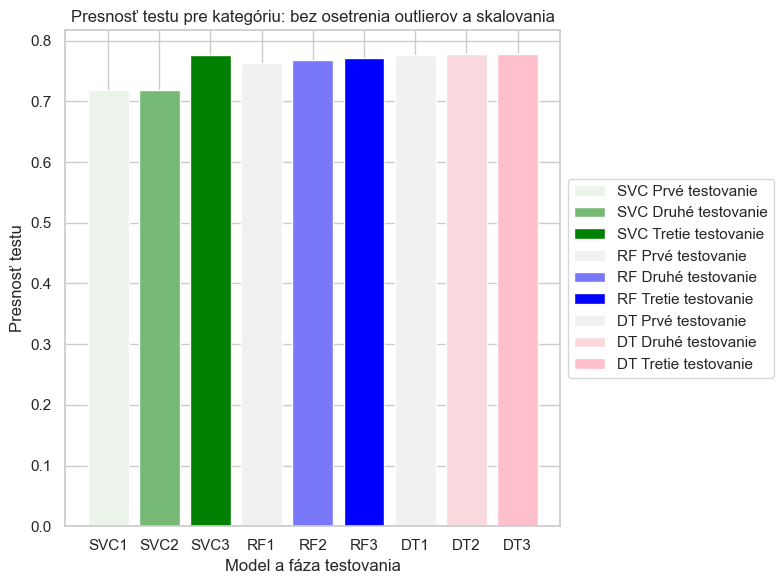

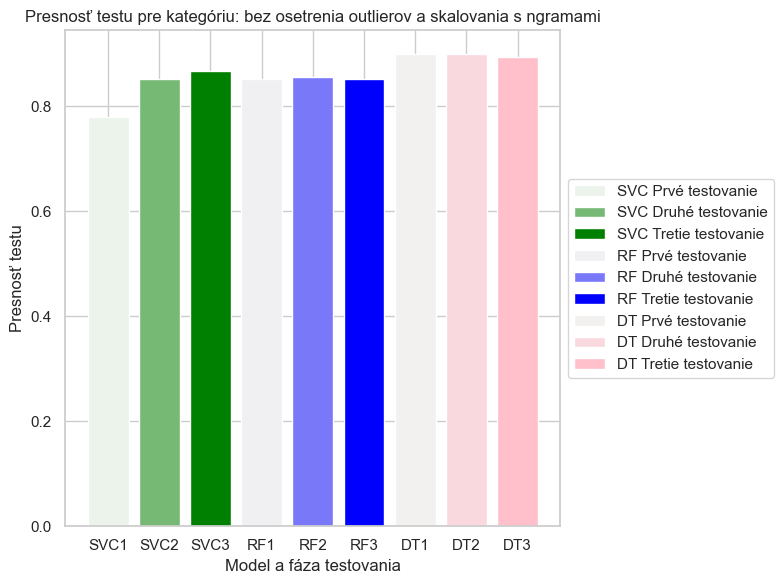

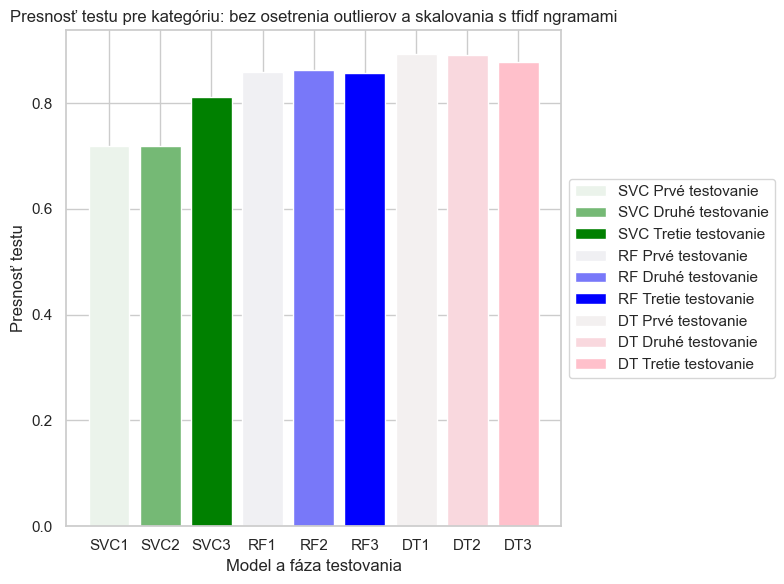

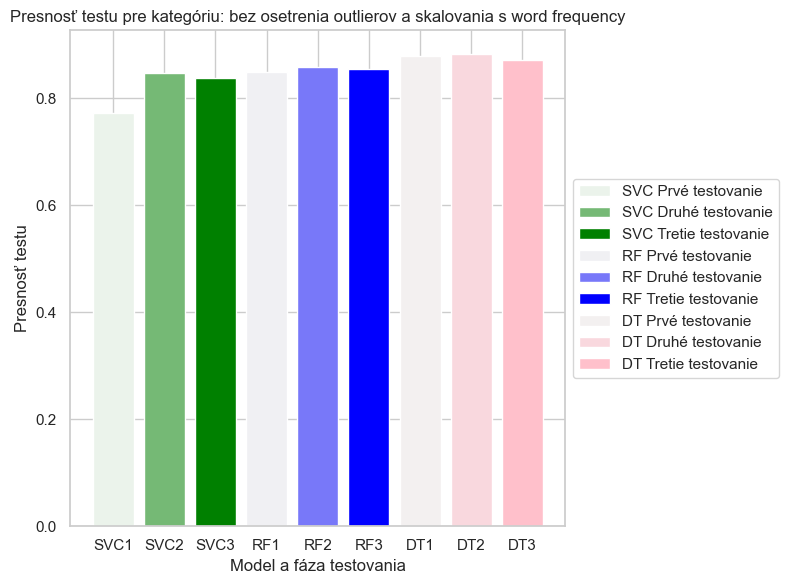

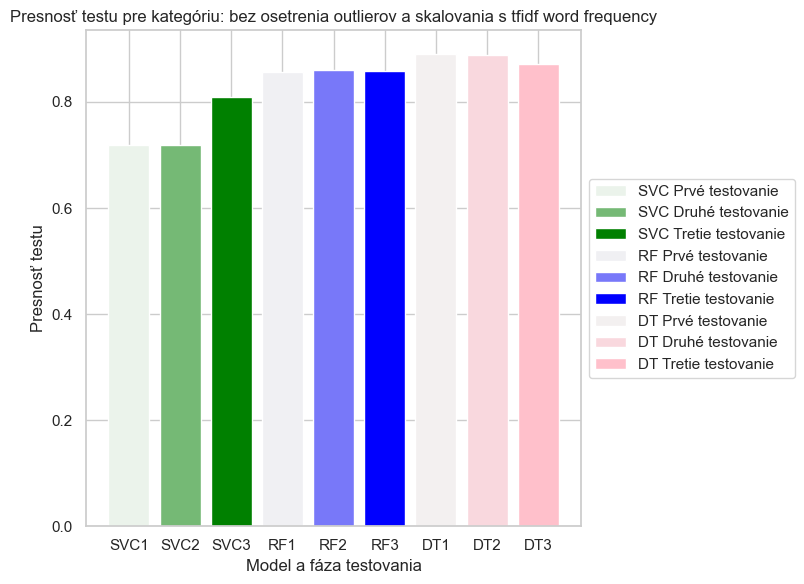

...

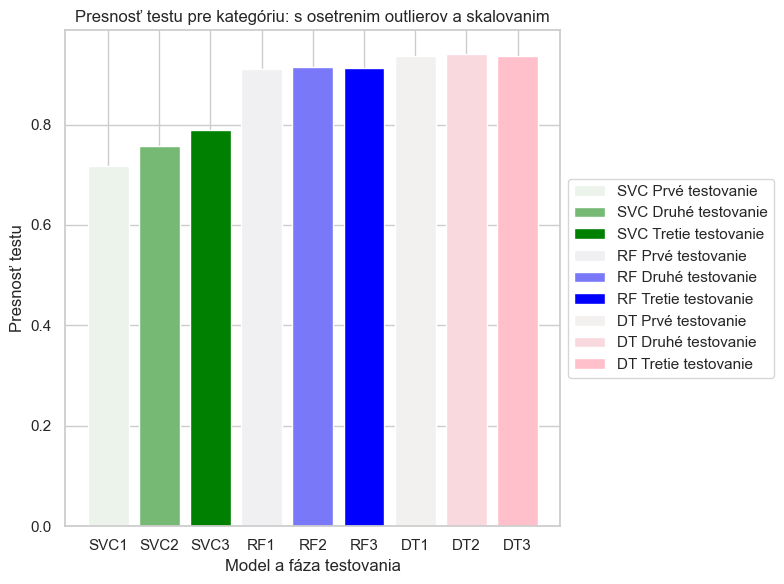

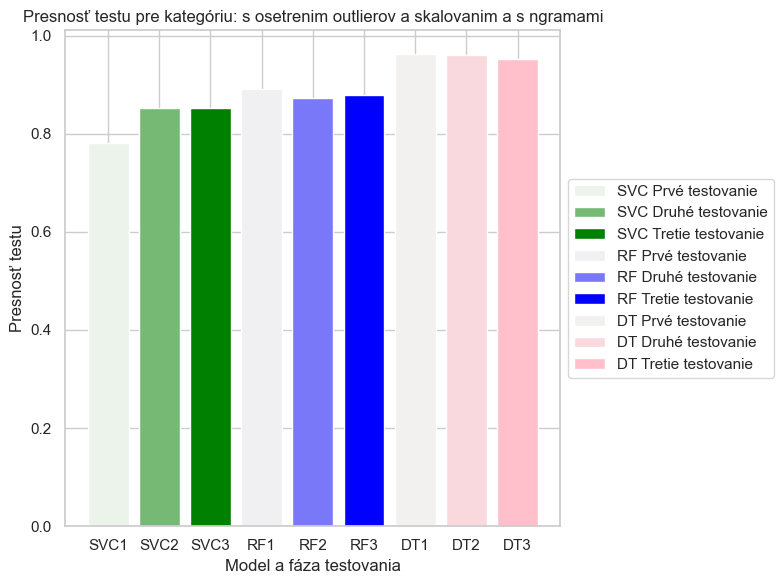

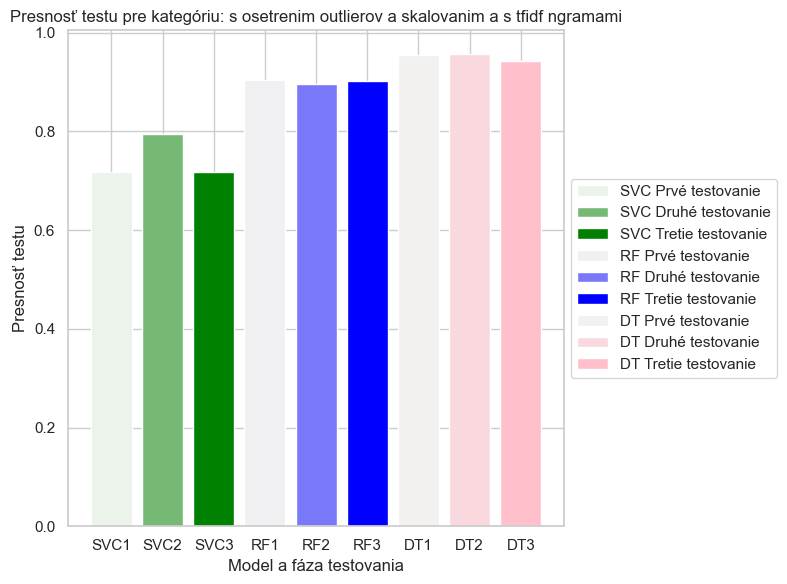

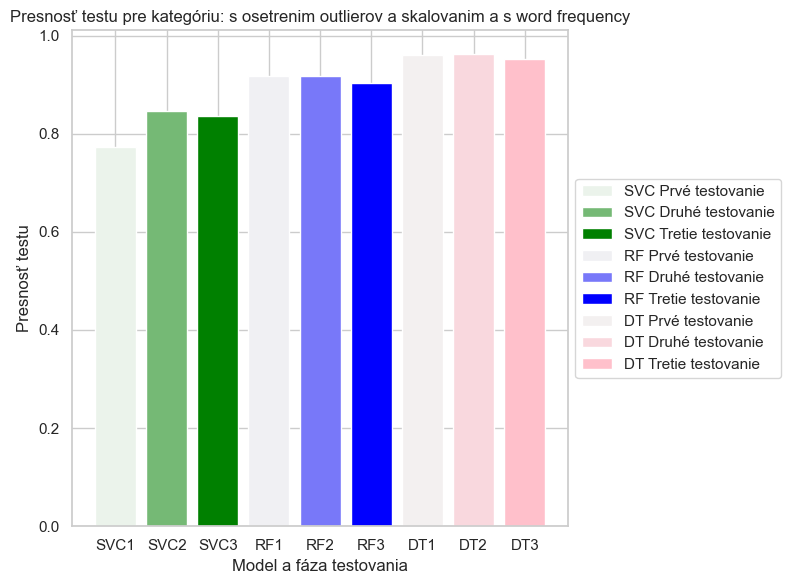

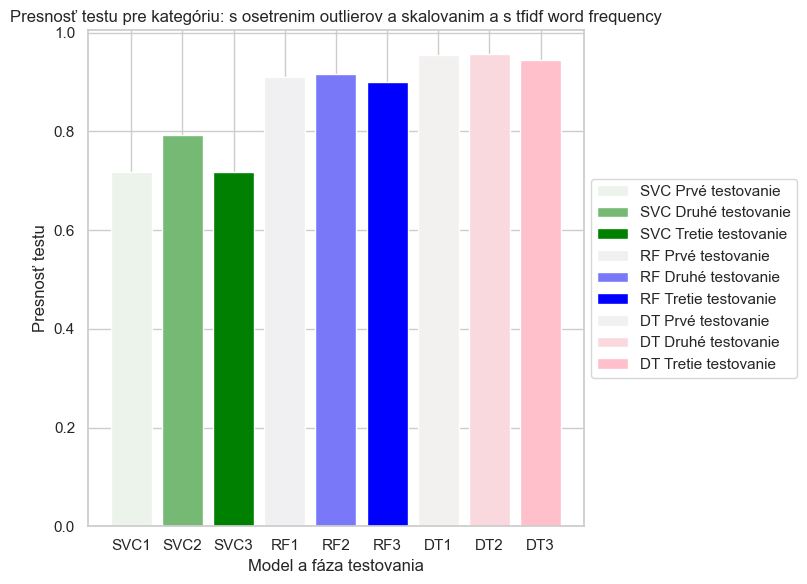

In [1234]:
# Nastavenie štýlu Seaborn pre pekné grafy
sns.set(style="whitegrid")

test_categories = results_svc1.index.tolist()

# Pre každú kategóriu vytvoríme graf
for category in test_categories:
    fig, ax = plt.subplots(figsize=(10, 6))

    # Farebné schémy pre testy
    colors_svc = sns.light_palette("green", 3)
    colors_rf = sns.light_palette("blue", 3)
    colors_gbm = sns.light_palette("pink", 3)

    # Pridanie dát pre SVC
    ax.bar('SVC1', results_svc1.loc[category, 'accuracy_test'], label='SVC Prvé testovanie', color=colors_svc[0])
    ax.bar('SVC2', results_svc2.loc[category, 'accuracy_test'], label='SVC Druhé testovanie', color=colors_svc[1])
    ax.bar('SVC3', results_svc3.loc[category, 'accuracy_test'], label='SVC Tretie testovanie', color=colors_svc[2])

    # Pridanie dát pre Random Forest
    ax.bar('RF1', results_rf1.loc[category, 'accuracy_test'], label='RF Prvé testovanie', color=colors_rf[0])
    ax.bar('RF2', results_rf2.loc[category, 'accuracy_test'], label='RF Druhé testovanie', color=colors_rf[1])
    ax.bar('RF3', results_rf3.loc[category, 'accuracy_test'], label='RF Tretie testovanie', color=colors_rf[2])

    # Pridanie dát pre GRADIENT BOOSTING MASHINE
    ax.bar('DT1', results_gbm1.loc[category, 'accuracy_test'], label='DT Prvé testovanie', color=colors_gbm[0])
    ax.bar('DT2', results_gbm2.loc[category, 'accuracy_test'], label='DT Druhé testovanie', color=colors_gbm[1])
    ax.bar('DT3', results_gbm3.loc[category, 'accuracy_test'], label='DT Tretie testovanie', color=colors_gbm[2])

    # Nastavenie legendy mimo grafu na pravej strane
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    # Titulok grafu
    ax.set_title(f'Presnosť testu pre kategóriu: {category}')

    # Popisy osí
    ax.set_xlabel('Model a fáza testovania')
    ax.set_ylabel('Presnosť testu')

    # Zobrazenie grafu
    plt.tight_layout(rect=[0, 0, 0.8, 1])  # Uvoľnenie priestoru pre legendu
    plt.show()

<Figure size 1200x700 with 0 Axes>

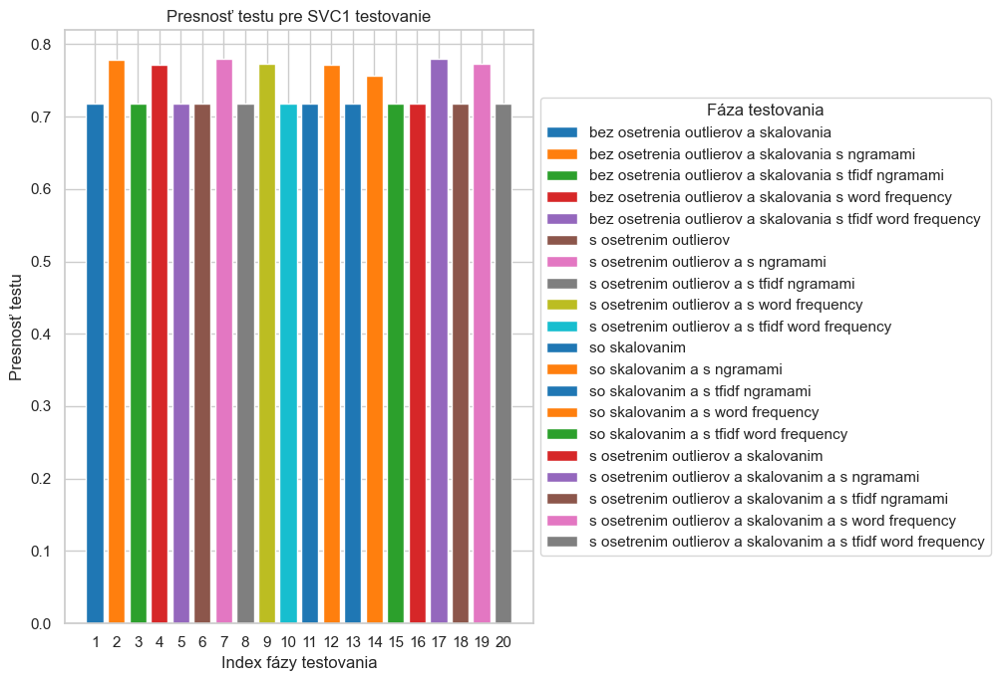

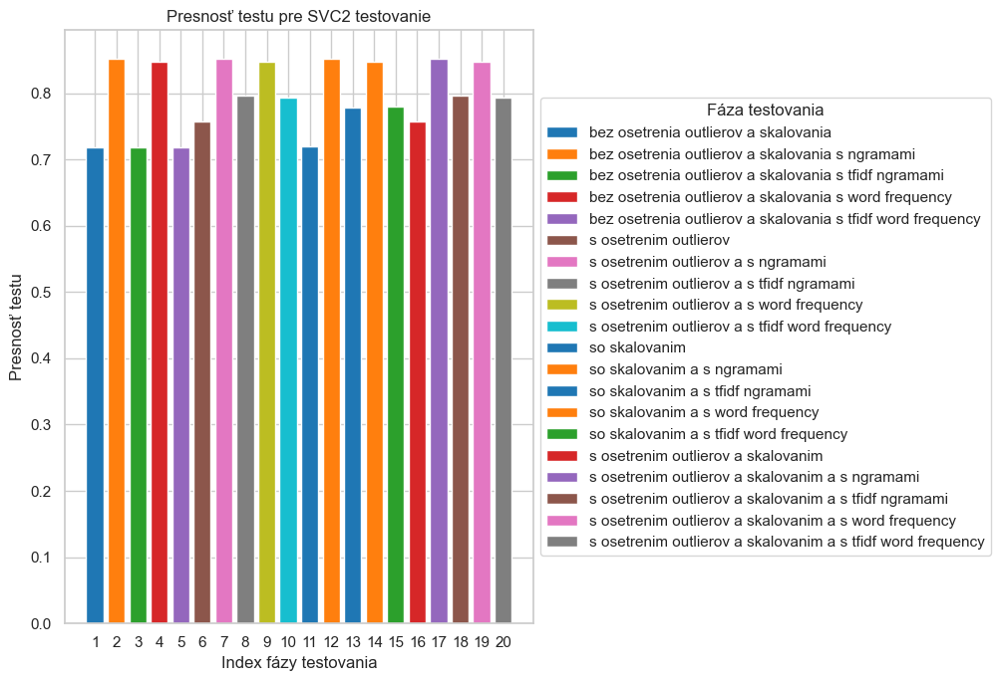

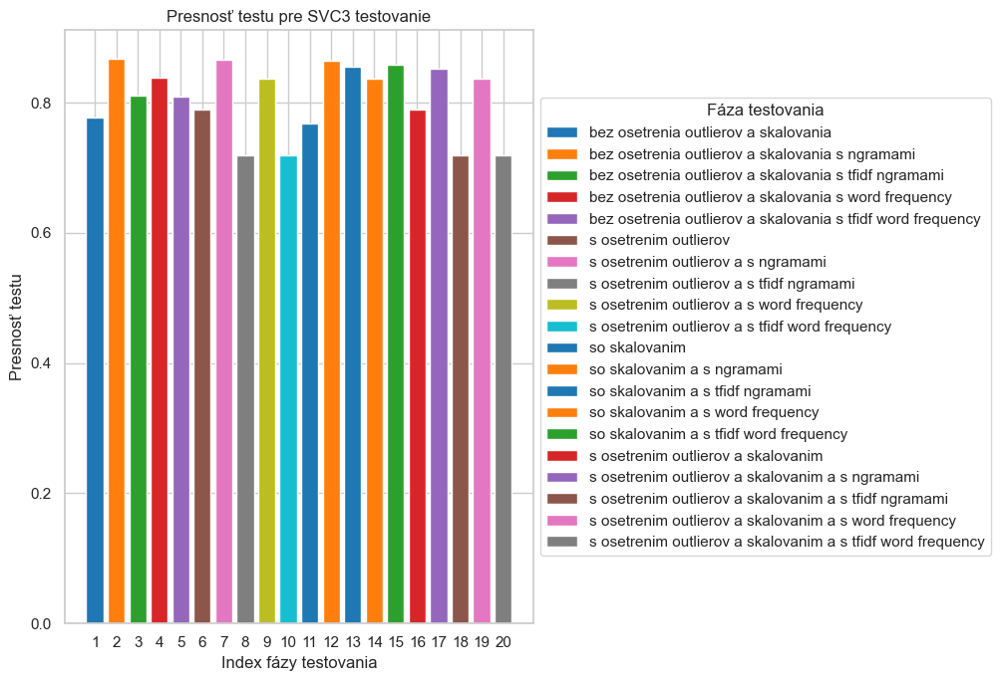

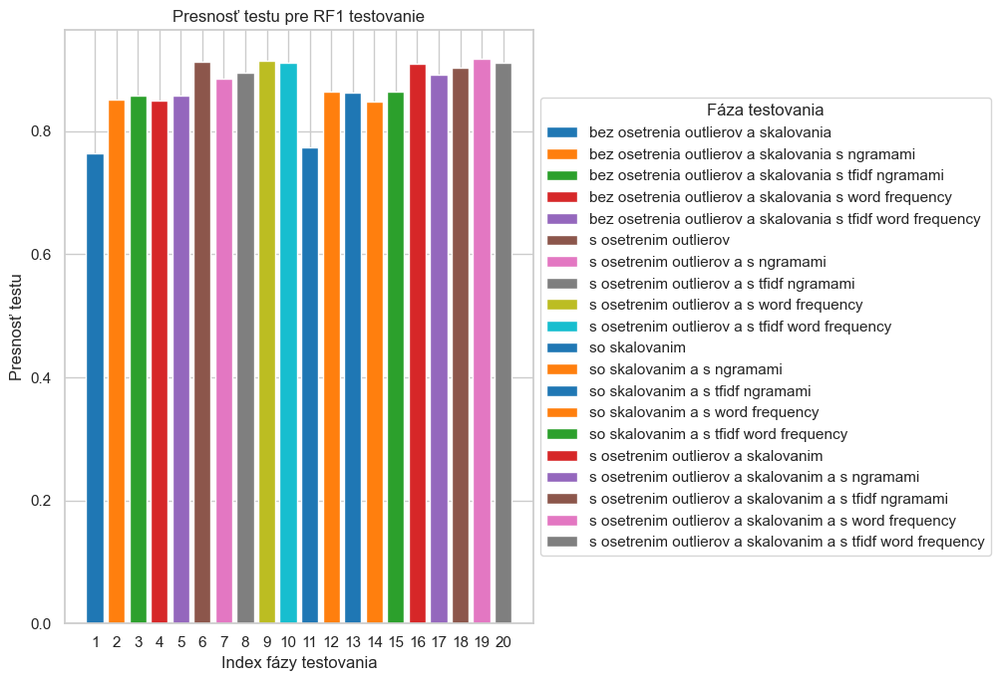

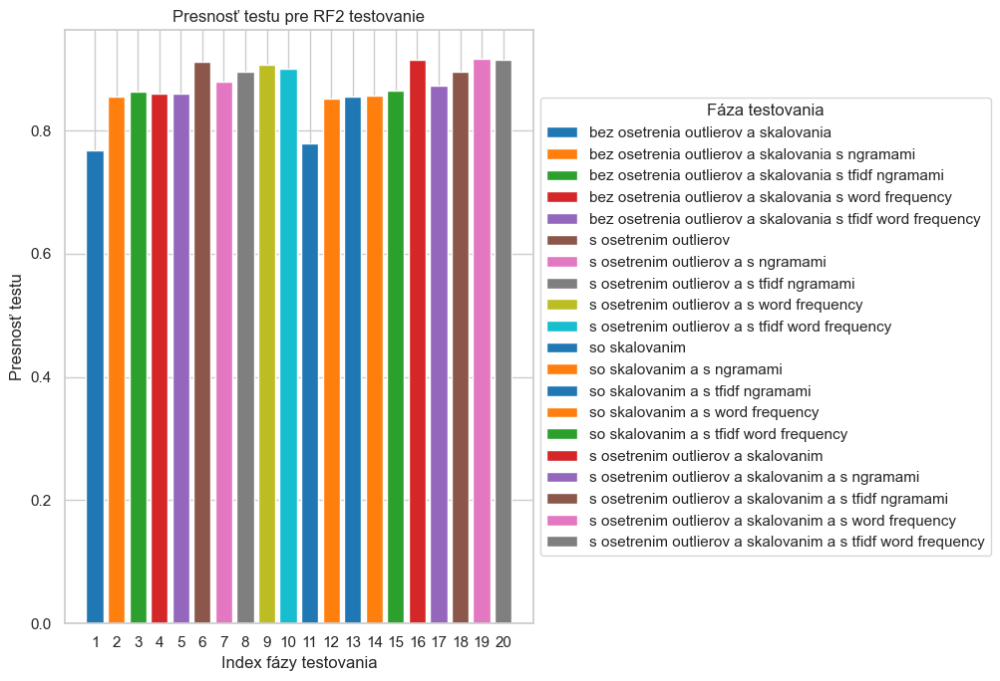

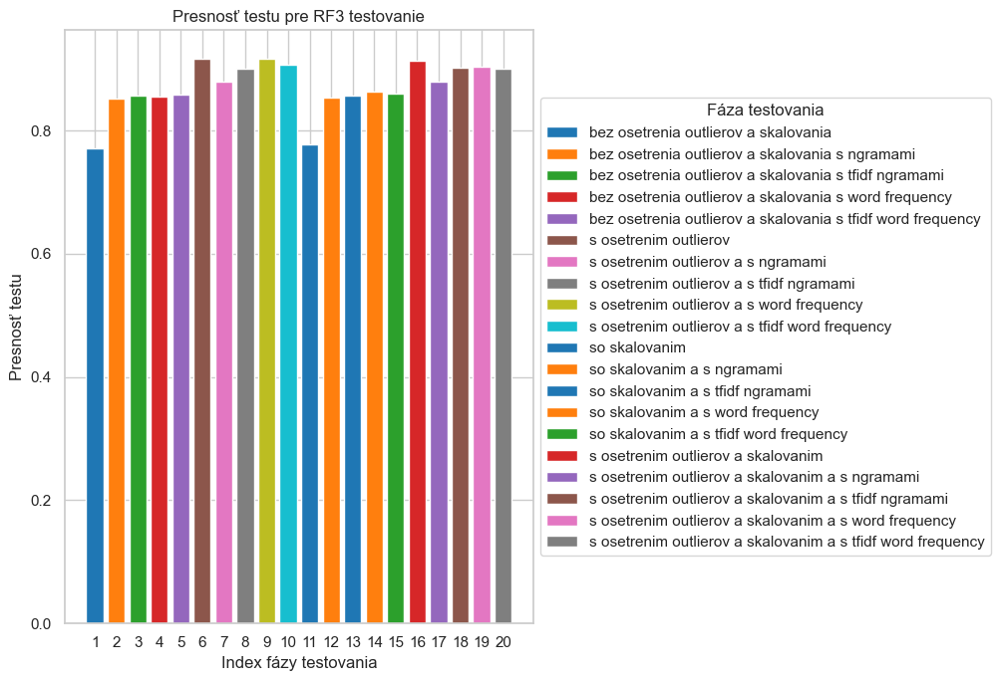

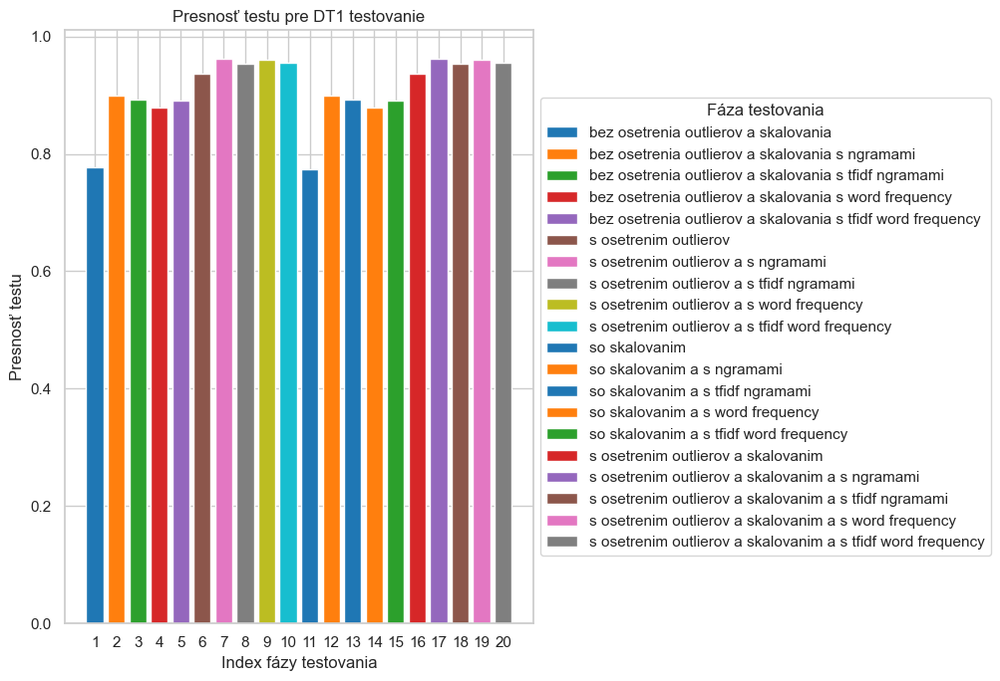

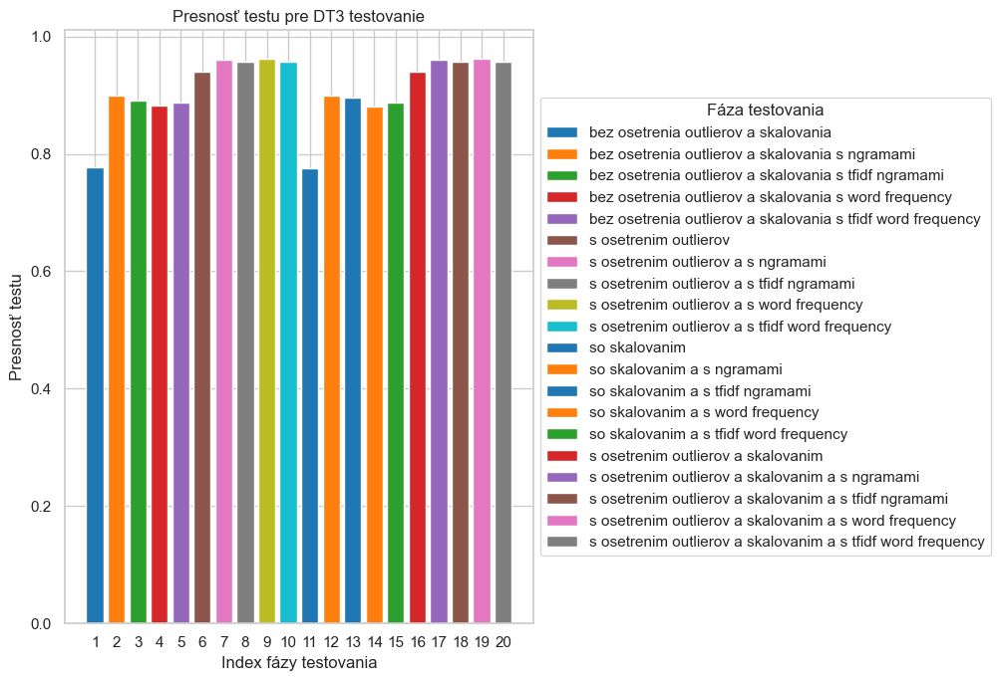

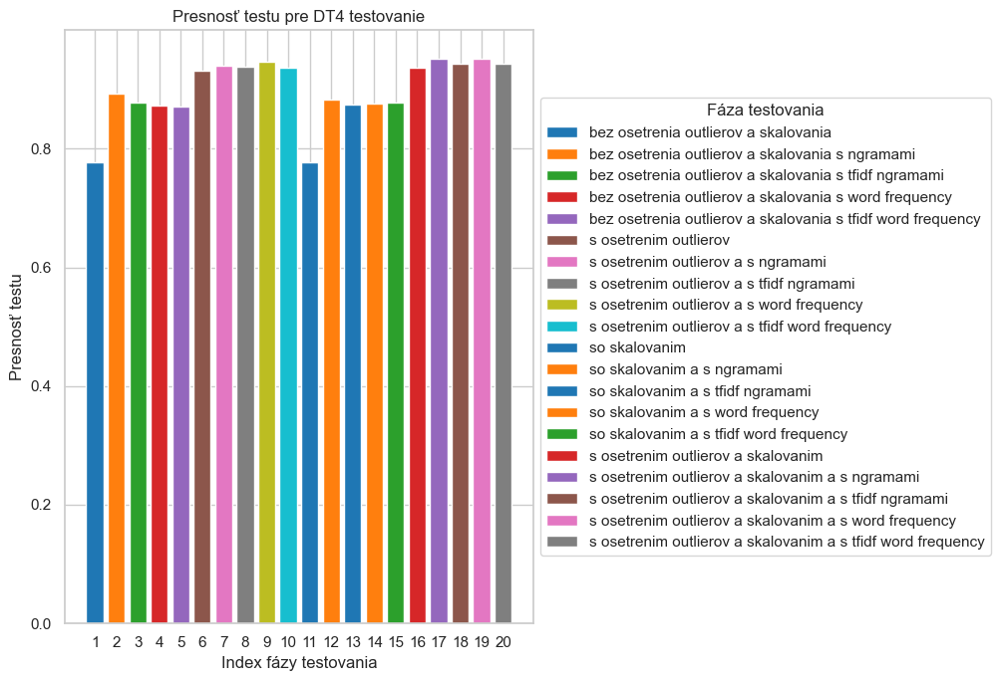

In [1235]:
# Nastavenie veľkosti grafu
plt.figure(figsize=(12, 7))

# Farebná paleta pre rôzne testovania
colors = sns.color_palette("tab10", 12)

# Vykreslenie grafu pre každý DataFrame
for results_df, label in [(results_svc1, 'SVC1'), (results_svc2, 'SVC2'), (results_svc3, 'SVC3'), (results_rf1, 'RF1'), (results_rf2, 'RF2'), (results_rf3, 'RF3'), (results_gbm1, 'DT1'), (results_gbm2, 'DT3'), (results_gbm3, 'DT4')]:
    fig, ax = plt.subplots(figsize=(12, 7))

    # Názvy indexov vo vašom DataFrame, upravte podľa potreby
    index_names = results_df.index.tolist()

    # Vykreslenie stĺpcov pre každý index
    for i, index_name in enumerate(index_names):
        # Vyberieme farbu pre aktuálny index
        color = colors[i % len(colors)]
        # Vykreslíme stĺpec a pridáme popisek pre legendu
        ax.bar(i, results_df.loc[index_name, 'accuracy_test'], color=color, label=index_name)

    # Nastavíme os x na čísla od 0 do počtu indexov - 1
    ax.set_xticks(np.arange(len(index_names)))
    ax.set_xticklabels(np.arange(1, len(index_names) + 1))

    # Pridáme legendu
    ax.legend(title='Fáza testovania', loc='center left', bbox_to_anchor=(1, 0.5))

    # Nastavíme názov grafu a popisy osí
    ax.set_title(f'Presnosť testu pre {label} testovanie')
    ax.set_xlabel('Index fázy testovania')
    ax.set_ylabel('Presnosť testu')

    # Zobrazíme graf
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()